# Dataset preparation

## Dataset import

In [1]:
import time,datetime
start_time = time.time()

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px

from tqdm.notebook import tqdm_notebook, tnrange
from tqdm.contrib import tenumerate

import joblib

%matplotlib inline
from os import listdir

In [2]:
from google.colab import drive
drive.mount('/content/drive')
import os
path =  "/content/drive/MyDrive/Colab_Notebooks/Project_6/Flipkart/Images/"
os.chdir(path)

Mounted at /content/drive


In [3]:
list_photos = [file for file in listdir(path)]
print(len(list_photos))

1066


In [4]:
Flipkart = pd.read_csv('../flipkart_com-ecommerce_sample_1050.csv',encoding='iso-8859-1')
Flipkart.head(5)

dataset=Flipkart[['product_category_tree','image']].copy()

In [5]:
# Renommage des catégories (legendes des matrices de confusion trop longues)
shorten={'Watches ':'Watches',
         'Computers ':'Computers',
         'Home Decor & Festive Needs ':'Decor',
         'Kitchen & Dining ':'Kitchen',
         'Home Furnishing ':'Furniture',
         'Beauty and Personal Care ':'Beauty',
         'Baby Care ':'Baby'}

In [6]:
# extraction du premier etage de l'arbre category affichages des occurences
dataset['category']=dataset.product_category_tree.apply(lambda s : s[2:s.find('>>')])
cat=pd.DataFrame(dataset.category.value_counts())
cat.reset_index(inplace=True)
cat['category'] = cat['category'].replace(shorten)
cat

,category,count
0,Furniture,150
1,Baby,150
2,Watches,150
3,Decor,150
4,Kitchen,150
5,Beauty,150
6,Computers,150


In [7]:
# Shorten category names
dataset['category']= dataset['category'].replace(shorten)
dataset.category.value_counts()

,count
category,
Furniture,150
Baby,150
Watches,150
Decor,150
Kitchen,150
Beauty,150
Computers,150


In [8]:
# dictionary for ordinal encoding of category names
# comparison with clustering results
dico={cat.loc[i,'category']:i for i in cat.index}
dico_reverse={i:cat.loc[i,'category'] for i in cat.index}
display(dico)

# assignment to cat_code column
dataset['cat_code']=dataset.category.map(dico)
dataset.cat_code.value_counts()

{'Furniture': 0,
 'Baby': 1,
 'Watches': 2,
 'Decor': 3,
 'Kitchen': 4,
 'Beauty': 5,
 'Computers': 6}

,count
cat_code,
0,150
1,150
2,150
3,150
4,150
5,150
6,150


In [9]:
data=dataset[['category','cat_code','image']].copy()

data.head(2)

,category,cat_code,image
0,Furniture,0,55b85ea15a1536d46b7190ad6fff8ce7.jpg
1,Baby,1,7b72c92c2f6c40268628ec5f14c6d590.jpg


In [10]:
# Dictionaries to hold results
# Function to append results to result_dict
def append_dict(dict1_obj, dict2_obj):
    for key in dict1_obj.keys():
        dict1_obj[key].append(dict2_obj[key])

# Initialize results dictionary
results={'title' : [], 'metrics':[]}
results1={'title' : [], 'metrics':[]}

In [11]:
# Resumption of all results evaluation steps

from sklearn.cluster import KMeans
from sklearn.metrics import precision_recall_fscore_support
from sklearn.metrics import adjusted_rand_score
from sklearn.metrics import confusion_matrix,ConfusionMatrixDisplay,classification_report
from scipy.optimize import linear_sum_assignment
from collections import Counter

# Plot confusion matrix with better cmap look.
def plot_conf_mat(matrix,y_names,x_names,title=''):
    fig,axe=plt.subplots(figsize=(8,6))

    sns.heatmap(matrix, annot=True, cmap='Accent',ax=axe, square=True,fmt='g',vmin=0,vmax=150)
    axe.set_yticklabels(y_names,rotation = 0,fontsize=11)
    axe.set_xticklabels(x_names, rotation = 45, ha="right",fontsize=11)
    axe.set_title(title,fontsize=16)
    plt.show()



"""
Main function.
Evaluates clustering performance by comparing predicted cluster labels with ground truth labels.

This function performs several key evaluation steps:
1. Counts the frequency of each cluster
2. Computes a confusion matrix between predicted clusters and true categories
3. Optimizes cluster-to-category alignment using the Hungarian algorithm
4. Visualizes the aligned confusion matrix
5. Calculates the Adjusted Rand Index (ARI) to measure clustering quality
6. Generates a detailed classification report with precision, recall, and F1-score

Parameters:
    pred_labels (array-like): Predicted cluster labels from clustering algorithm
    true_labels (array-like): Ground truth category labels
    cat_names (list): List of category names for visualization and reporting

Returns:
    tuple: ((precision, recall, f1, support), ari) - Macro-averaged metrics and ARI score
"""
def clustering_evaluate(pred_labels, true_labels, cat_names):

    # Count clusters effectives
    effectives=dict(sorted(Counter(pred_labels).items()))

    # compute confusion matrix
    conf_mat=confusion_matrix(true_labels,pred_labels)

    # Plot confusion matrix
#     plot_conf_mat(conf_mat,cat['index'],range(7),title='Confusion matrix')

    # Maximize values on first diagonal
    row_ind, col_ind = linear_sum_assignment(conf_mat,maximize=True)
    permut = pd.DataFrame(col_ind,index=cat['category'],columns=['cluster'])
    permut.index.rename('Category',inplace=True)
    permut['effectives']=[effectives[cls] for cls in permut.cluster]
    display(permut)
    cm=conf_mat.take(col_ind,axis=1)

    # Plot aligned confusion matrix
    plot_conf_mat(cm,cat_names,cat_names,title='Aligned confusion matrix')

    # Align cluster label on category code   [corresp[cls] for cls in labels]
    corresp = np.argmax(conf_mat, axis=0)

    # print  adjusted rand score
    ari = adjusted_rand_score(true_labels,pred_labels)
    print(' ARI : {}'.format(ari))

    # Print classification report
    print(classification_report(true_labels,
                                [corresp[cls] for cls in pred_labels],
                                target_names=cat_names,
                                zero_division=0)
         )
    return  precision_recall_fscore_support(true_labels,
                                [corresp[cls] for cls in pred_labels],
                                             average='macro', zero_division=0), ari


# 2D projection scatterplot
def plot_clusters(reduced,labels):
    data=pd.DataFrame(np.c_[reduced,labels],columns=['Component 1','Component 2','Cluster'])

    plt.figure(figsize=(10,8))
    sns.scatterplot(data=data,
                    x='Component 1',
                    y='Component 2',
                    hue='Cluster',
                    palette=sns.color_palette('tab10', n_colors=7))
    plt.title(f'')
    plt.figure(figsize=(10,8))

In [38]:
specific_picture_index = 458

## Creating photo labels from image names

In [12]:
data.groupby('cat_code').count()

,category,image
cat_code,,
0,150,150
1,150,150
2,150,150
3,150,150
4,150,150
5,150,150
6,150,150


## Display sample images by label

In [13]:
from matplotlib.image import imread


for categ in set(data.category):
    plt.figure(figsize=(12,4))
    print('Sample category {} :'.format(categ))
    image_sample=data[data.category == categ].image.sample(3)
    for i in range(3):
        plt.subplot(130 + 1 + i)
        filename = path + image_sample.iloc[i]
        image = imread(filename)
        plt.imshow(image)
    plt.show()

Output hidden; open in https://colab.research.google.com to view.

# SIFT descriptors

- Scale and rotation invariance: SIFT is designed to detect points of interest in an image that are invariant to both scale and rotation changes. It finds key points at different levels of the image pyramid.

- Descriptors: Once the key points have been detected, SIFT generates a descriptor based on a neighborhood around each key point. This descriptor is generally a feature vector describing the orientation and intensity of pixels in the region around the key point.

- Complexity: SIFT is relatively expensive in terms of computation and memory, which can make it less effective for real-time applications.

## Determining and displaying SIFT descriptors

Parameters
    
    * nfeatures	The maximum number of best features to retain. The features are ranked by their scores (measured in SIFT algorithm as the local contrast)
    
    * nOctaveLayers	The number of layers in each octave. 3 is the value used in D. Lowe paper. The number of octaves is computed automatically from the image resolution.
    
    * contrastThreshold	The contrast threshold used to filter out weak features in semi-uniform (low-contrast) regions. The larger the threshold, the less features are produced by the detector.

Note
    The contrast threshold will be divided by nOctaveLayers when the filtering is applied. When nOctaveLayers is set to default and if you want to use the value used in D. Lowe paper, 0.03, set this argument to 0.09.

Parameters
    
    * edgeThreshold	The threshold used to filter out edge-like features. Note that the its meaning is different from the contrastThreshold, i.e. the larger the edgeThreshold, the less features are filtered out (more features are retained).
    
    * sigma	The sigma of the Gaussian applied to the input image at the octave #0. If your image is captured with a weak camera with soft lenses, you might want to reduce the number.

In [14]:
# Image size for SIFT process
image_size=(256,256)

Grey levels


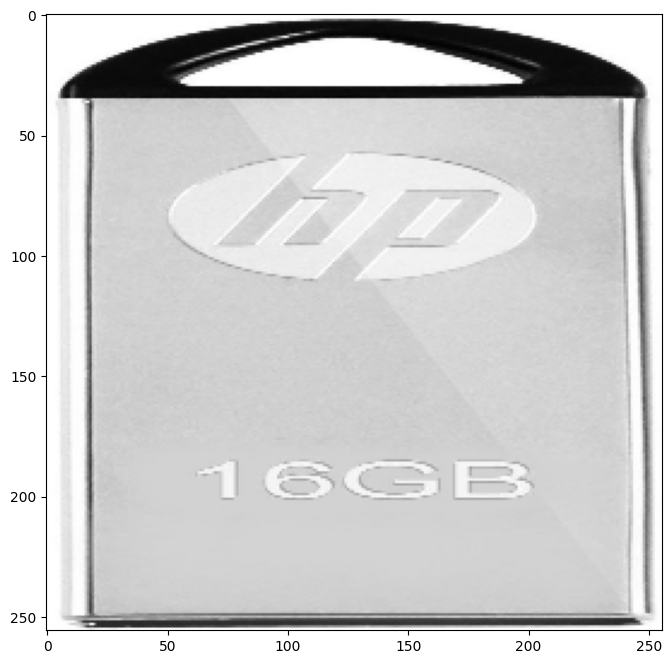

Adaptative contract equalization


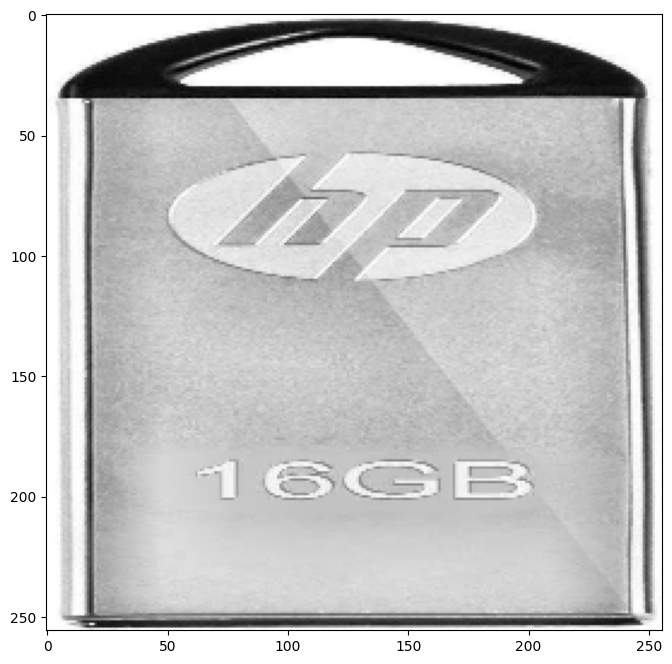

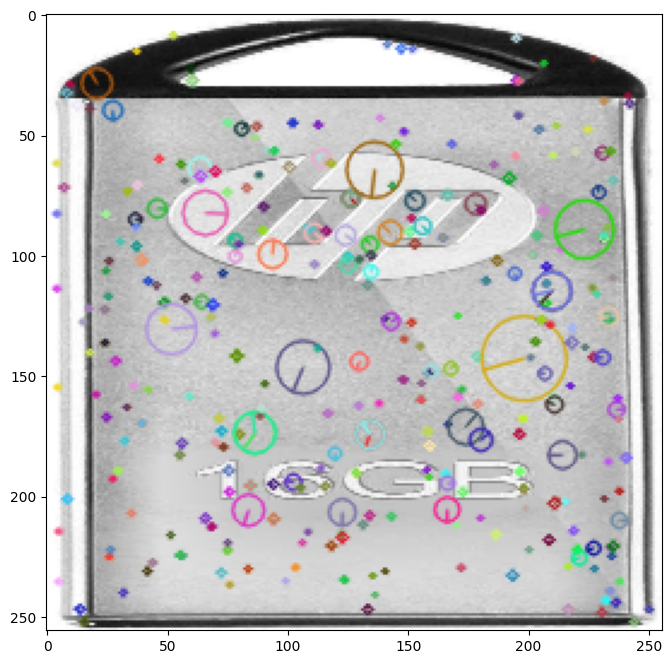

Descriptors number : 357 (vector size 128) 

[[18.  3.  0. ...  0.  0.  0.]
 [22.  1.  0. ...  0.  0.  0.]
 [25.  1.  0. ...  0.  0.  0.]
 ...
 [ 3. 12. 50. ...  0.  0.  0.]
 [ 0.  0.  1. ...  1.  0.  1.]
 [88.  2.  0. ...  0.  1. 14.]]


In [21]:
import cv2

plt.figure(figsize=(8,8))
sift = cv2.SIFT_create(nfeatures = 500,
                                   nOctaveLayers = 3,
                                   contrastThreshold = 0.004,
                                   edgeThreshold = 10,
                                   sigma = 1.6
                                  )
image_full = cv2.imread(path+data.image.iloc[specific_picture_index],0) # convert in gray
image = cv2.resize(image_full,dsize=image_size,interpolation= cv2.INTER_LINEAR)
print('Grey levels')
plt.imshow(image,cmap='gray')
plt.show()

# Contrast Limited Adaptative Histogram Equalization
clahe=cv2.createCLAHE(clipLimit=2.0,tileGridSize=(8,8))
image = clahe.apply(image)   # equalize image histogram
print('Adaptative contract equalization')
plt.figure(figsize=(8,8))
plt.imshow(image,cmap='gray')
plt.show()


kp, des = sift.detectAndCompute(image, None)
img=cv2.drawKeypoints(image,kp,image,flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)
plt.figure(figsize=(8,8))
plt.imshow(img)
plt.show()
print("Descriptors number : {} (vector size {}) ".format(des.shape[0],des.shape[1]))
print()
print(des)


## Image pre-processing via SIFT

### Bags of Visual Words (BoVW)

#### Creating descriptors for each image
* Pour chaque image passage en gris et equalisation
* création d'une liste keypoints qui contients les keypoints de chaque image
* création d'une liste de descripteurs par image ("descriptors") qui sera utilisée pour réaliser les histogrammes par image
* création d'une liste de descripteurs pour l'ensemble des images ("descriptors_all") qui sera utilisé pour créer les clusters de descripteurs

In [48]:
# identification of key points and associated descriptors
import time, cv2

keypoints = {}
descriptors = []
temps1=time.time()

sift = cv2.SIFT_create(nfeatures = 0,
                                   nOctaveLayers = 3,
                                   contrastThreshold = 0.004,
                                   edgeThreshold = 10,
                                   sigma = 1.6)

for image_num in tnrange(data.shape[0],desc='Create SIFT descriptors') :

    image_full = cv2.imread(path+data.image.iloc[image_num],0) # convert in gray
    image = cv2.resize(image_full,dsize=image_size,interpolation= cv2.INTER_LINEAR) # image resize to 224 x 224
    # image = cv2.cvtColor(image,cv2.COLOR_BGR2GRAY)
    res = clahe.apply(image)   # equalize image histogram
    kp, des = sift.detectAndCompute(res, None)
    keypoints[image_num]=kp
    descriptors.append(des)


descriptors_all = np.concatenate(descriptors, axis=0)

print()
print("Nombre de descripteurs : ", descriptors_all.shape)

# duration1=time.time()-temps1
# print("temps de traitement SIFT descriptor : ", "%15.2f" % duration1, "secondes")

Create SIFT descriptors:   0%|          | 0/1050 [00:00<?, ?it/s]


Nombre de descripteurs :  (2319277, 128)


In [49]:
# Random sample of images with their descriptors
samples=data.sample(50)

samples=samples.reset_index()
for index_ in samples['index']:
    kp=keypoints[index_]
    image_full = cv2.imread(path+data.image.iloc[index_],0) # convert in gray
    image = cv2.resize(image_full,dsize=image_size,interpolation= cv2.INTER_LINEAR) # image resize to 224 x 224
    # Contrast Limited Adaptative Histogram Equalization
    clahe=cv2.createCLAHE(clipLimit=2.0,tileGridSize=(8,8))
    image = clahe.apply(image)   # equalize image histogram


    img=cv2.drawKeypoints(image,kp,image,flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)
    plt.figure(figsize=(8,8))
    plt.title('Image {} number of descriptors : {}'.format(index_,len(kp)))
    plt.imshow(img)
    plt.show()

Output hidden; open in https://colab.research.google.com to view.

#### Creating visual vocabulary
* Use MiniBatchKMeans to achieve reasonable processing times

In [51]:
from sklearn import cluster, metrics

# Determination number of clusters
temps1=time.time()

k = int(round(np.sqrt(len(descriptors_all)),0))
print("Estimated number of clusters : ", k)
print("Generating",k, "descriptor clusters ...")

# Clustering
kmeans = cluster.MiniBatchKMeans(n_clusters=k, init_size=3*k, random_state=0)
kmeans.fit(descriptors_all)

duration1=time.time()-temps1
print("kmeans processing time : ", "%15.2f" % duration1, "seconds")

Estimated number of clusters :  1523
Generating 1523 descriptor clusters ...
kmeans processing time :           104.37 seconds


#### Attributing visual words
* For each image :
   - prediction of cluster numbers for each descriptor
   - creation of a histogram = count for each cluster number the number of visual words in the image

Image features = Image histogram = Image count of the number of descriptors per cluster

In [52]:
# Creation of histograms (features)
temps1=time.time()

def build_histogram(kmeans, des, image_num):
    res = kmeans.predict(des)
    hist = np.zeros(len(kmeans.cluster_centers_))
    nb_des=len(des)
    if nb_des==0 : print("problème histogramme image  : ", image_num)
    for i in res:
        hist[i] += 1.0/nb_des
    return hist


# Creation of a matrix of histograms
hist_vectors=[]

for i, image_desc in tenumerate(descriptors) :
#     if i%100 == 0 : print(i)
    hist = build_histogram(kmeans, image_desc, i) #calculates the histogram
    hist_vectors.append(hist) #histogram is the feature vector

im_features = np.asarray(hist_vectors)

duration1=time.time()-temps1
print("Computing time : ", "%15.2f" % duration1, "secondes")


  0%|          | 0/1050 [00:00<?, ?it/s]

Computing time :            29.54 secondes


In [53]:
print(im_features[specific_picture_index])

[0.         0.         0.         ... 0.         0.00127226 0.00212044]


#### ARI Score


,cluster,effectives
Category,,
Furniture,3,31
Baby,0,3
Watches,4,1
Decor,5,593
Kitchen,1,390
Beauty,6,5
Computers,2,27


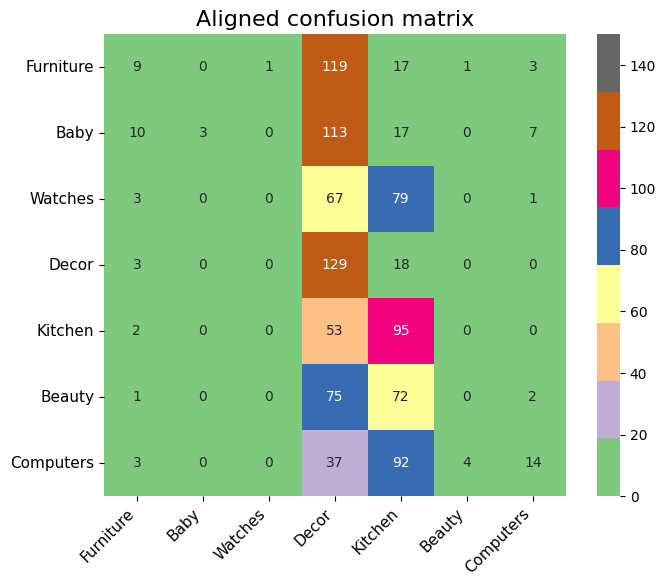

 ARI : 0.05981560260546207
              precision    recall  f1-score   support

   Furniture       1.00      0.01      0.01       150
        Baby       0.38      0.09      0.14       150
     Watches       0.00      0.00      0.00       150
       Decor       0.22      0.86      0.35       150
     Kitchen       0.24      0.63      0.35       150
      Beauty       0.00      0.00      0.00       150
   Computers       0.56      0.12      0.20       150

    accuracy                           0.24      1050
   macro avg       0.34      0.24      0.15      1050
weighted avg       0.34      0.24      0.15      1050

Clustering on description BoVW


In [54]:
# Import KMeans clusterer
from sklearn.cluster import KMeans

kmeans0 = KMeans(n_clusters=len(dico), random_state=42,n_init=30).fit(im_features)
    # Assign clusters
labels=kmeans0.labels_

title='BoVW'
# Evaluate and store metrics results)
append_dict(results, {'title'   : title,
                     'metrics' : clustering_evaluate(labels, data.cat_code,cat['category'])
                     }
           )
# clustering_evaluate(labels, data.cat_code,cat['index'])
print('Clustering on description '+title)

### Visual Words encoding Strategies

#### BoVW + tfidf

TF-IDF (Term Frequency-Inverse Document Frequency) weights words based on their specificity to documents. It emphasizes distinctive terms while reducing the importance of commonly occurring words across the corpus.\
This technique helps identify characteristic vocabulary for each document category, improving clustering and classification by focusing on truly discriminative features rather than generic terms.





In [55]:
from sklearn.feature_extraction.text import TfidfTransformer
tf_transformer = TfidfTransformer(use_idf=True).fit(im_features)
data_tfidf = tf_transformer.transform(im_features)

In [56]:
type(data_tfidf)

scipy.sparse._csr.csr_matrix

Sparse matrix, densify it for interpretability and saving dataframe.

In [57]:
data_tfidf=data_tfidf.toarray()

In [58]:
data_tfidf.shape

(1050, 1523)

In [59]:
tok=pd.DataFrame(data_tfidf,columns=[ 'T'+str(i) for i in range(data_tfidf.shape[1])])

# joblib.dump(tok, 'FEAT_TFIDF_IMGS')

tok

,T0,T1,T2,T3,T4,T5,T6,T7,T8,T9,...,T1513,T1514,T1515,T1516,T1517,T1518,T1519,T1520,T1521,T1522
0,0.009255,0.000000,0.008999,0.000000,0.031329,0.026206,0.008216,0.004788,0.004553,0.008961,...,0.000000,0.008644,0.005458,0.003937,0.000000,0.008885,0.016233,0.000000,0.004490,0.012439
1,0.009825,0.027270,0.105082,0.024663,0.000000,0.000000,0.008722,0.050830,0.019333,0.009512,...,0.000000,0.045880,0.034762,0.000000,0.020514,0.018863,0.000000,0.000000,0.019065,0.000000
2,0.041272,0.000000,0.000000,0.069068,0.039915,0.000000,0.012213,0.000000,0.040607,0.119874,...,0.000000,0.000000,0.000000,0.005852,0.000000,0.000000,0.018096,0.000000,0.006674,0.000000
3,0.006530,0.018125,0.012699,0.000000,0.031578,0.006163,0.017391,0.060812,0.019275,0.000000,...,0.006418,0.036593,0.007702,0.005555,0.006818,0.006269,0.000000,0.000000,0.012672,0.046807
4,0.010072,0.000000,0.019586,0.012641,0.009741,0.019012,0.008941,0.000000,0.009910,0.009751,...,0.029697,0.037627,0.011879,0.008568,0.000000,0.000000,0.017665,0.009397,0.000000,0.009024
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1045,0.022273,0.061821,0.010828,0.000000,0.000000,0.052554,0.009886,0.011523,0.000000,0.043128,...,0.010945,0.000000,0.000000,0.018948,0.000000,0.032071,0.019532,0.010390,0.000000,0.019956
1046,0.000000,0.000000,0.022621,0.000000,0.000000,0.021958,0.000000,0.000000,0.022890,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.022334,0.020402,0.000000,0.000000,0.020845
1047,0.000000,0.038788,0.024458,0.000000,0.016218,0.007914,0.014887,0.000000,0.008250,0.024353,...,0.008241,0.015662,0.000000,0.014266,0.026261,0.032195,0.000000,0.023468,0.000000,0.000000
1048,0.000000,0.020467,0.000000,0.000000,0.000000,0.000000,0.000000,0.022890,0.000000,0.000000,...,0.043483,0.082641,0.000000,0.094094,0.000000,0.000000,0.096995,0.020639,0.021463,0.019820


In [60]:
tok.loc[specific_picture_index]

,458
T0,0.000000
T1,0.000000
T2,0.000000
T3,0.000000
T4,0.017128
...,...
T1518,0.025502
T1519,0.007765
T1520,0.000000
T1521,0.025775


In [67]:
non_zero_series = tok.loc[specific_picture_index][tok.loc[specific_picture_index] != 0]
result_dict = {index: round(value, 4) for index, value in non_zero_series.to_dict().items()}
print(result_dict)

{'T4': 0.0171, 'T5': 0.0084, 'T6': 0.0157, 'T7': 0.0183, 'T8': 0.0087, 'T9': 0.0086, 'T10': 0.009, 'T11': 0.023, 'T12': 0.0093, 'T14': 0.0098, 'T18': 0.0091, 'T20': 0.0083, 'T21': 0.0165, 'T24': 0.0253, 'T26': 0.0092, 'T29': 0.0169, 'T31': 0.0207, 'T32': 0.0256, 'T33': 0.0147, 'T35': 0.0179, 'T36': 0.0082, 'T37': 0.0089, 'T38': 0.0486, 'T39': 0.0078, 'T42': 0.0155, 'T43': 0.0326, 'T44': 0.0091, 'T46': 0.0323, 'T48': 0.0386, 'T49': 0.017, 'T50': 0.009, 'T51': 0.0092, 'T52': 0.0158, 'T53': 0.0266, 'T54': 0.0167, 'T55': 0.0248, 'T56': 0.0076, 'T59': 0.0232, 'T60': 0.0246, 'T61': 0.0192, 'T62': 0.01, 'T63': 0.0092, 'T65': 0.0177, 'T66': 0.0179, 'T67': 0.0175, 'T68': 0.0085, 'T69': 0.0176, 'T71': 0.0079, 'T73': 0.0089, 'T74': 0.008, 'T76': 0.0158, 'T77': 0.0089, 'T78': 0.0079, 'T79': 0.307, 'T82': 0.0418, 'T83': 0.0086, 'T85': 0.0088, 'T86': 0.0088, 'T87': 0.0183, 'T88': 0.0172, 'T89': 0.0084, 'T90': 0.0082, 'T91': 0.0246, 'T92': 0.0319, 'T94': 0.0092, 'T95': 0.0088, 'T96': 0.0267, 'T97': 0

,cluster,effectives
Category,,
Furniture,1,132
Baby,5,50
Watches,0,230
Decor,6,251
Kitchen,3,205
Beauty,4,127
Computers,2,55


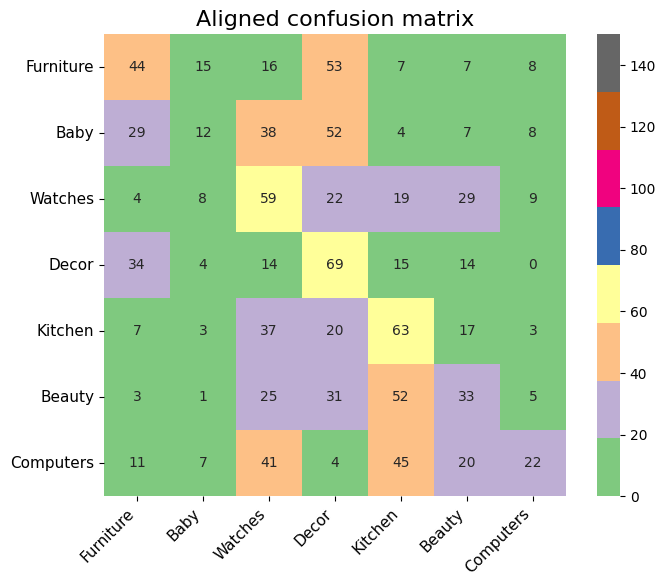

 ARI : 0.06691901513062762
              precision    recall  f1-score   support

   Furniture       0.32      0.39      0.36       150
        Baby       0.00      0.00      0.00       150
     Watches       0.26      0.39      0.31       150
       Decor       0.27      0.46      0.34       150
     Kitchen       0.31      0.42      0.35       150
      Beauty       0.26      0.22      0.24       150
   Computers       0.40      0.15      0.21       150

    accuracy                           0.29      1050
   macro avg       0.26      0.29      0.26      1050
weighted avg       0.26      0.29      0.26      1050

Clustering on BoVW + TFiDF


In [68]:
# Import KMeans clusterer
from sklearn.cluster import KMeans


kmeans1 = KMeans(n_clusters=len(dico), random_state=42,n_init=30).fit(tok)
    # Assign clusters
labels=kmeans1.labels_

title='BoVW + TFiDF'
# Evaluate and store metrics results)
append_dict(results, {'title'   : title,
                     'metrics' : clustering_evaluate(labels, data.cat_code,cat['category'])
                     }
           )
# clustering_evaluate(labels, data.cat_code,cat['index'])
print('Clustering on '+title)

In [69]:
# Check if the results are the same with a sparse matrix

# Import KMeans clusterer
from sklearn.cluster import KMeans


kmeans1 = KMeans(n_clusters=len(dico), random_state=42,n_init=30).fit(data_tfidf)
    # Assign clusters
labels=kmeans1.labels_
for i in range(0,7):
    print('Cluster {} values count : {}'.format(i, np.count_nonzero(labels == i)))
print(' ARI : {}'.format(adjusted_rand_score(data.cat_code,labels)))


Cluster 0 values count : 230
Cluster 1 values count : 132
Cluster 2 values count : 55
Cluster 3 values count : 205
Cluster 4 values count : 127
Cluster 5 values count : 50
Cluster 6 values count : 251
 ARI : 0.06691901513062762


Same result with sparse matrix.



#### BoVW + LDA

Unlike TF-IDF which represents documents by the relative importance of words, LDA (Latent Dirichlet Allocation) takes a thematic approach. This probabilistic generative model decomposes each document into a mixture of latent topics and each topic into a distribution of words. It captures the hidden semantic structure of documents by automatically identifying recurring themes and their associations. In our product description context, LDA can reveal more abstract conceptual groupings beyond simple keywords, potentially aligned with product categories.\
LDA is a pure statistic algorithm and does not use LLM.

,cluster,effectives
Category,,
Furniture,6,17
Baby,1,1
Watches,4,279
Decor,0,225
Kitchen,3,1
Beauty,5,425
Computers,2,102


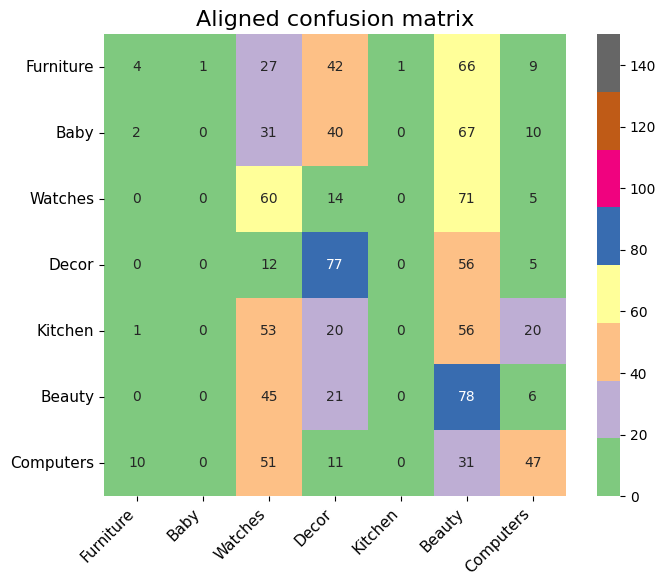

 ARI : 0.03743103497818142
              precision    recall  f1-score   support

   Furniture       1.00      0.01      0.03       150
        Baby       0.00      0.00      0.00       150
     Watches       0.22      0.40      0.28       150
       Decor       0.34      0.51      0.41       150
     Kitchen       0.00      0.00      0.00       150
      Beauty       0.18      0.52      0.27       150
   Computers       0.48      0.38      0.42       150

    accuracy                           0.26      1050
   macro avg       0.32      0.26      0.20      1050
weighted avg       0.32      0.26      0.20      1050

Clustering sur BoVW + LatentDirichletAllocation
Clustering sur BoVW + LatentDirichletAllocation


In [70]:
from sklearn.decomposition import LatentDirichletAllocation
tok_lda = LatentDirichletAllocation(n_components=8,random_state=42,n_jobs=-1).fit_transform(im_features)

# Import KMeans clusterer
from sklearn.cluster import KMeans


kmeans2 = KMeans(n_clusters=len(dico), random_state=42,n_init=30).fit(tok_lda)
    # Assign clusters
labels=kmeans2.labels_

title='BoVW + LatentDirichletAllocation'
# Evaluate and store metrics results)
append_dict(results, {'title'   : title,
                     'metrics' : clustering_evaluate(labels, data.cat_code,cat['category'])
                     }
           )
# clustering_evaluate(labels, data.cat_code,cat['index'])
print('Clustering sur '+title)
print('Clustering sur BoVW + LatentDirichletAllocation' )


In [73]:
tok_lda[specific_picture_index]

array([0.56249546, 0.06250065, 0.06250065, 0.06250065, 0.06250065,
       0.06250065, 0.06250065, 0.06250065])

### Projections

#### PCA

* **Linear space transformation**: PCA projects data into a new coordinate system defined by orthogonal directions of maximum variance
* **Dimensionality optimization**: Reduces feature redundancy by identifying and preserving only the most informative dimensions
* **Noise reduction effect**: Lower-ranked components often capture noise, so eliminating them increases signal-to-noise ratio
* **Global pattern prioritization**: Emphasizes broad patterns that explain the largest sources of variation across documents
* **Feature correlation resolution**: Addresses multicollinearity by creating uncorrelated components from correlated original features
* **Variance-based information retention**: Provides clear metrics on how much information (variance) is preserved in the reduced space

Overall, PCA gives the same (weak) ARI scores for both encoding strategies. It also worsened ARI score for BoVW only.


##### BoVW + PCA

,cluster,effectives
Category,,
Furniture,1,12
Baby,6,15
Watches,3,2
Decor,0,612
Kitchen,2,338
Beauty,4,2
Computers,5,69


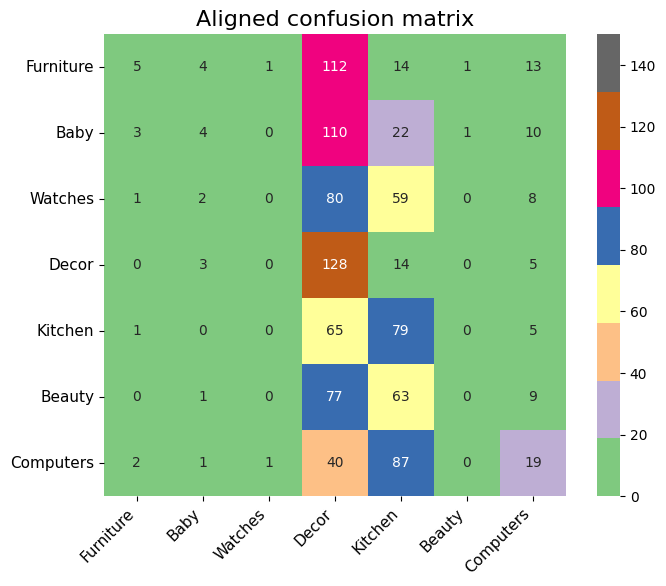

 ARI : 0.043886354826229365
              precision    recall  f1-score   support

   Furniture       0.35      0.07      0.12       150
        Baby       0.00      0.00      0.00       150
     Watches       0.00      0.00      0.00       150
       Decor       0.21      0.85      0.34       150
     Kitchen       0.00      0.00      0.00       150
      Beauty       0.00      0.00      0.00       150
   Computers       0.26      0.71      0.38       150

    accuracy                           0.23      1050
   macro avg       0.12      0.23      0.12      1050
weighted avg       0.12      0.23      0.12      1050

Clustering on BoVW + PCA (2 components, 11.95% explained variance)


In [ ]:
from sklearn.decomposition import PCA
from sklearn.cluster import KMeans

# Create full PCA model to calculate explained variance
pca_full = PCA(random_state=42)
pca_full.fit(im_features)

# Calculate cumulative variance explained by the first 2 components
explained_variance_ratio = pca_full.explained_variance_ratio_
cumulative_variance = explained_variance_ratio.cumsum()
variance_2_components = cumulative_variance[1] * 100

# Apply PCA with 2 components for dimensionality reduction
pca = PCA(n_components=2, random_state=42)
bovw_pca = pca.fit_transform(im_features)

# K-Means clustering on reduced data
kmeans2 = KMeans(n_clusters=len(dico), random_state=42, n_init=30).fit(bovw_pca)
labels = kmeans2.labels_

# Title including explained variance
title = f'BoVW + PCA (2 components, {variance_2_components:.2f}% explained variance)'

# Evaluate and store metrics results
append_dict(results, {
    'title': title,
    'metrics': clustering_evaluate(labels, data.cat_code, cat['category'])
})

# Display clustering results
print(f'Clustering on {title}')


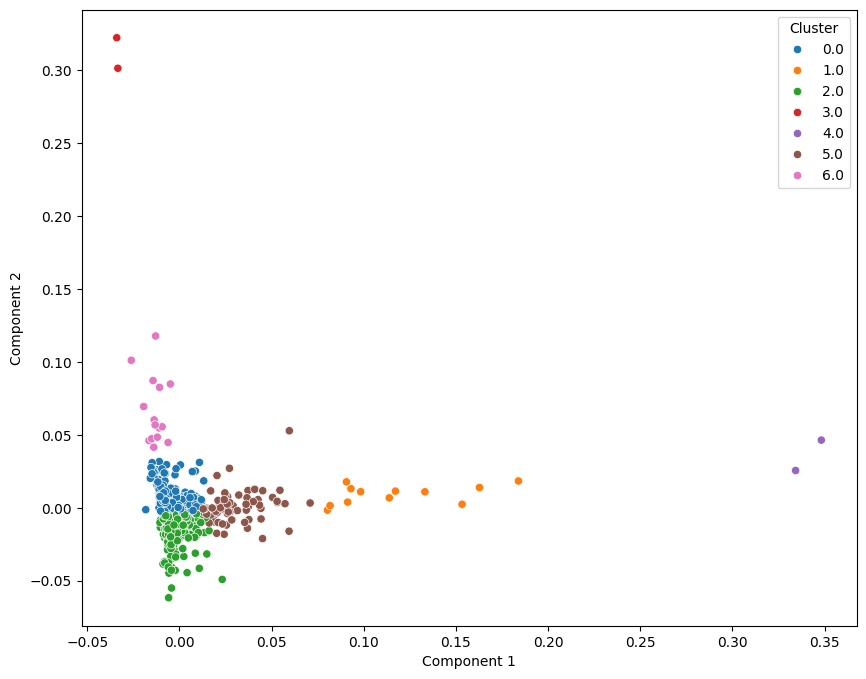

<Figure size 1000x800 with 0 Axes>

In [ ]:
plot_clusters(bovw_pca,labels)

##### BoVW + tfidf + PCA

,cluster,effectives
Category,,
Furniture,0,153
Baby,5,228
Watches,1,119
Decor,3,149
Kitchen,2,72
Beauty,6,134
Computers,4,195


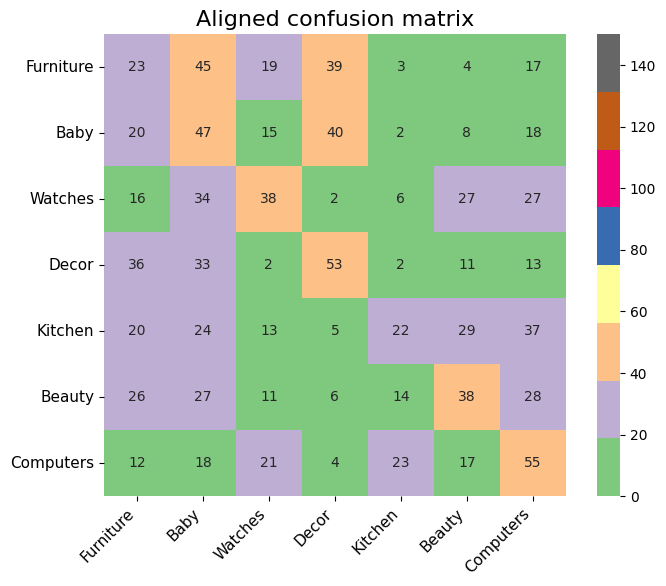

 ARI : 0.047067567896659106
              precision    recall  f1-score   support

   Furniture       0.00      0.00      0.00       150
        Baby       0.21      0.31      0.25       150
     Watches       0.32      0.25      0.28       150
       Decor       0.29      0.59      0.39       150
     Kitchen       0.00      0.00      0.00       150
      Beauty       0.28      0.25      0.27       150
   Computers       0.29      0.52      0.37       150

    accuracy                           0.28      1050
   macro avg       0.20      0.28      0.22      1050
weighted avg       0.20      0.28      0.22      1050

Clustering on BoVW + TFiDF + PCA (2 components, 8.01% explained variance)


In [ ]:
from sklearn.decomposition import PCA
from sklearn.cluster import KMeans

# Create full PCA model to calculate explained variance
pca_full = PCA(random_state=42)
pca_full.fit(tok)

# Calculate cumulative variance explained by the first 2 components
explained_variance_ratio = pca_full.explained_variance_ratio_
cumulative_variance = explained_variance_ratio.cumsum()
variance_2_components = cumulative_variance[1] * 100

# Apply PCA with 2 components for dimensionality reduction
pca = PCA(n_components=2, random_state=42)
tok_pca = pca.fit_transform(tok)

# K-Means clustering on reduced data
kmeans2 = KMeans(n_clusters=len(dico), random_state=42, n_init=30).fit(tok_pca)
labels = kmeans2.labels_

# Title including explained variance
title = f'BoVW + TFiDF + PCA (2 components, {variance_2_components:.2f}% explained variance)'

# Evaluate and store metrics results
append_dict(results, {
    'title': title,
    'metrics': clustering_evaluate(labels, data.cat_code, cat['category'])
})

# Display clustering results
print(f'Clustering on {title}')


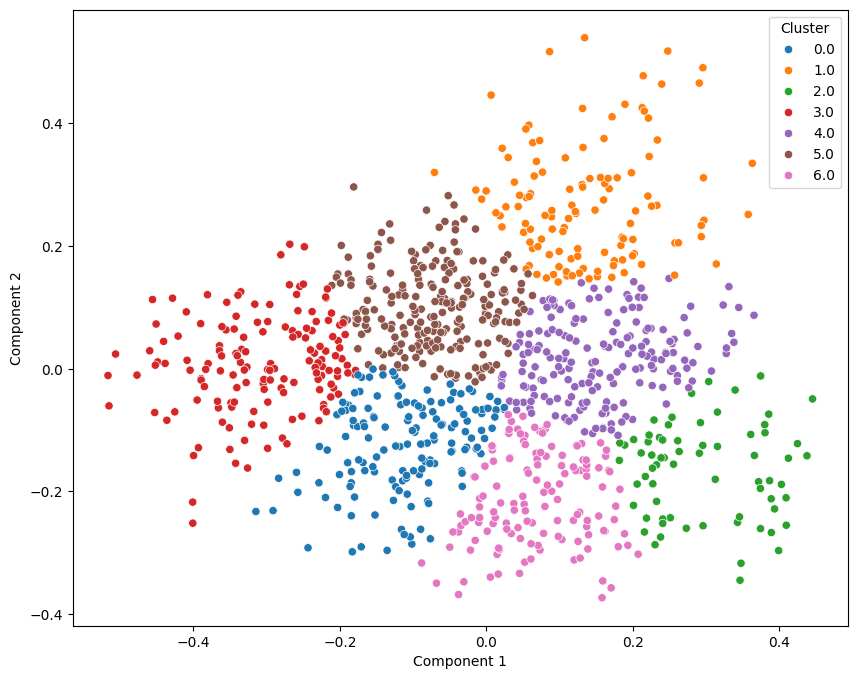

<Figure size 1000x800 with 0 Axes>

In [ ]:
plot_clusters(tok_pca,labels)

##### BoVW + LDA + PCA

,cluster,effectives
Category,,
Furniture,6,4
Baby,4,44
Watches,3,285
Decor,0,245
Kitchen,1,1
Beauty,5,324
Computers,2,147


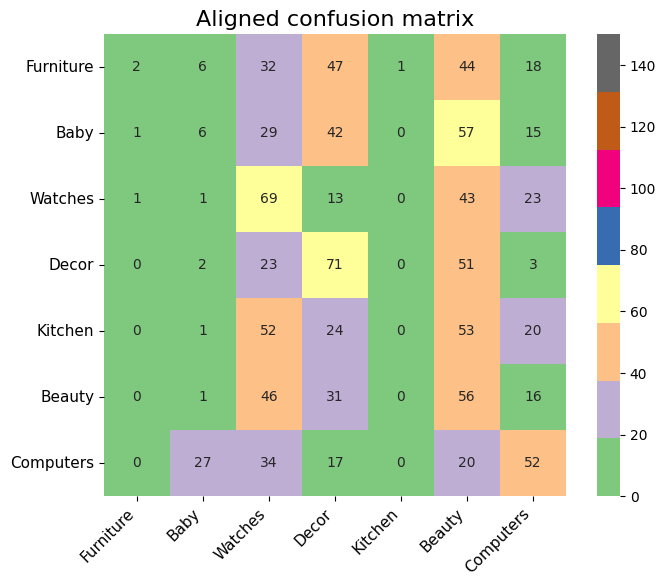

 ARI : 0.03531910276631124
              precision    recall  f1-score   support

   Furniture       0.60      0.02      0.04       150
        Baby       0.18      0.38      0.24       150
     Watches       0.24      0.46      0.32       150
       Decor       0.29      0.47      0.36       150
     Kitchen       0.00      0.00      0.00       150
      Beauty       0.00      0.00      0.00       150
   Computers       0.41      0.53      0.46       150

    accuracy                           0.27      1050
   macro avg       0.25      0.27      0.20      1050
weighted avg       0.25      0.27      0.20      1050

Clustering on BoVW + LDA + PCA (2 components, 100.00% explained variance)


In [ ]:
from sklearn.decomposition import PCA
from sklearn.cluster import KMeans

# Create full PCA model to calculate explained variance
pca_full = PCA(random_state=42)
pca_full.fit(tok_lda)

# Calculate cumulative variance explained by the first 2 components
explained_variance_ratio = pca_full.explained_variance_ratio_
cumulative_variance = explained_variance_ratio.cumsum()
variance_2_components = cumulative_variance[1] * 100

# Apply PCA with 2 components for dimensionality reduction
pca = PCA(n_components=2, random_state=42)
tok_pca = pca.fit_transform(tok_lda)

# K-Means clustering on reduced data
kmeans2 = KMeans(n_clusters=len(dico), random_state=42, n_init=30).fit(tok_pca)
labels = kmeans2.labels_

# Title including explained variance
title = f'BoVW + LDA + PCA (2 components, {variance_2_components:.2f}% explained variance)'

# Evaluate and store metrics results
append_dict(results, {
    'title': title,
    'metrics': clustering_evaluate(labels, data.cat_code, cat['category'])
})

# Display clustering results
print(f'Clustering on {title}')


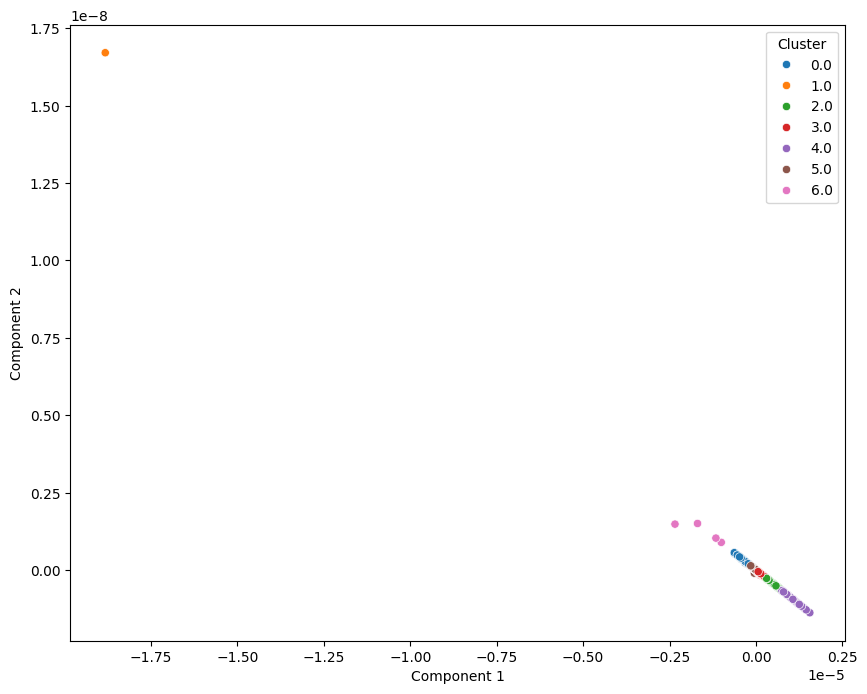

<Figure size 1000x800 with 0 Axes>

In [ ]:
plot_clusters(tok_pca,labels)

#### TSNE

* **Optimized spatial reorganization**: t-SNE transforms the vector space by preserving local similarities while amplifying differences between distinct groups
* **Curse of dimensionality mitigation**: Addresses the "curse of dimensionality" problem that affects high-dimensional TF-IDF vectors, where distance metrics become less meaningful
* **Adaptation to textual complexity**: Unlike linear methods, t-SNE adapts to complex and non-linear structures present in textual data
* **Dimensional noise elimination**: Reduction to 2D eliminates non-relevant dimensions that hindered K-means performance in the original sparse vector space
* **Enhancement of natural boundaries**: The transformation accentuates natural separations between categories, considerably facilitating the clustering algorithm's task

It is interesting to see that using TSNE projection helps having a better ARI score for BoVW only and TFiDF strategies.

##### BoVW + TSNE

,cluster,effectives
Category,,
Furniture,1,115
Baby,4,159
Watches,3,133
Decor,0,234
Kitchen,2,157
Beauty,6,132
Computers,5,120


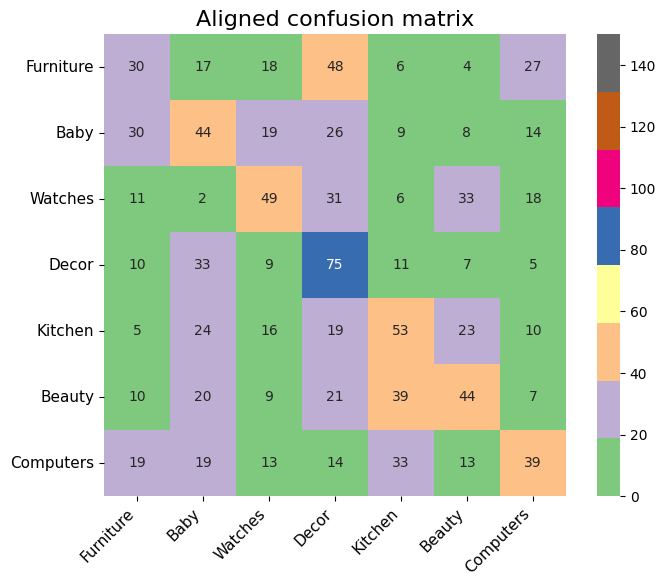

 ARI : 0.06681822674705941
              precision    recall  f1-score   support

   Furniture       0.26      0.20      0.23       150
        Baby       0.28      0.29      0.28       150
     Watches       0.37      0.33      0.35       150
       Decor       0.32      0.50      0.39       150
     Kitchen       0.34      0.35      0.35       150
      Beauty       0.33      0.29      0.31       150
   Computers       0.33      0.26      0.29       150

    accuracy                           0.32      1050
   macro avg       0.32      0.32      0.31      1050
weighted avg       0.32      0.32      0.31      1050

Clustering on BoVW + T-SNE 2 components


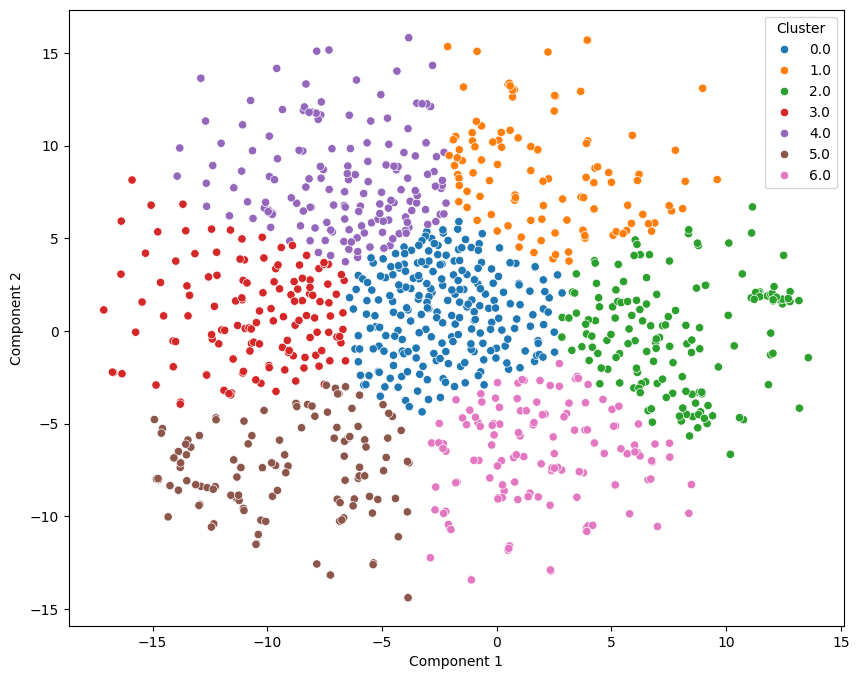

<Figure size 1000x800 with 0 Axes>

In [ ]:
from sklearn.manifold import TSNE
# tok variable comes from the countvectorizer + tfidf section
bovw_tsne = TSNE(n_components=2,
                perplexity=50,
                early_exaggeration=12.0,
                learning_rate=200.0,
                max_iter=1000,
                n_iter_without_progress=300,
                min_grad_norm=1e-07,
                metric='euclidean',
                init='random',   # pca
                verbose=0,
                random_state=42,
                method='barnes_hut',   # exact
                angle=0.2,
                n_jobs=-1
               ).fit_transform(im_features)

# Import KMeans clusterer
from sklearn.cluster import KMeans


kmeans2 = KMeans(n_clusters=len(dico), random_state=42,n_init=30).fit(bovw_tsne)
    # Assign clusters
labels=kmeans2.labels_

title='BoVW + T-SNE 2 components'
# Evaluate and store metrics results)
append_dict(results, {'title'   : title,
                     'metrics' : clustering_evaluate(labels, data.cat_code,cat['category'])
                     }
           )
# clustering_evaluate(labels, data.cat_code,cat['index'])
print('Clustering on '+title)

plot_clusters(bovw_tsne,labels)

##### BoVW + tfidf + TSNE

,cluster,effectives
Category,,
Furniture,1,165
Baby,3,124
Watches,4,148
Decor,6,183
Kitchen,0,109
Beauty,5,153
Computers,2,168


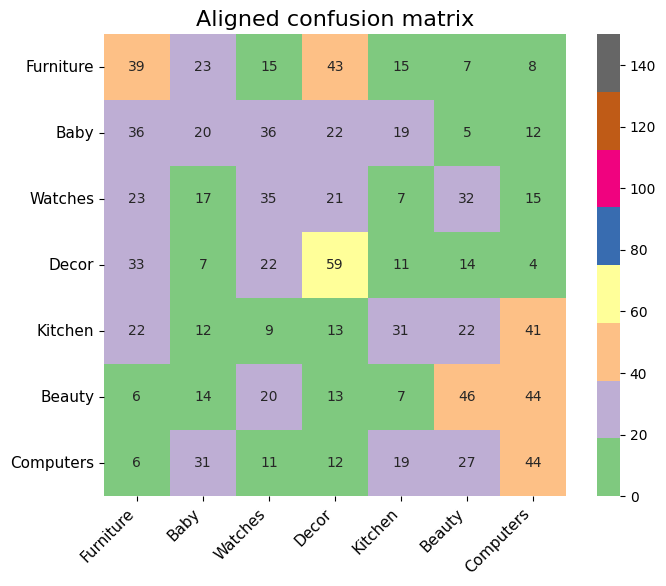

 ARI : 0.05188270530861625
              precision    recall  f1-score   support

   Furniture       0.24      0.26      0.25       150
        Baby       0.24      0.24      0.24       150
     Watches       0.00      0.00      0.00       150
       Decor       0.32      0.39      0.35       150
     Kitchen       0.28      0.21      0.24       150
      Beauty       0.28      0.60      0.38       150
   Computers       0.25      0.21      0.23       150

    accuracy                           0.27      1050
   macro avg       0.23      0.27      0.24      1050
weighted avg       0.23      0.27      0.24      1050

Clustering on BoVW + TFiDF + T-SNE 2 components


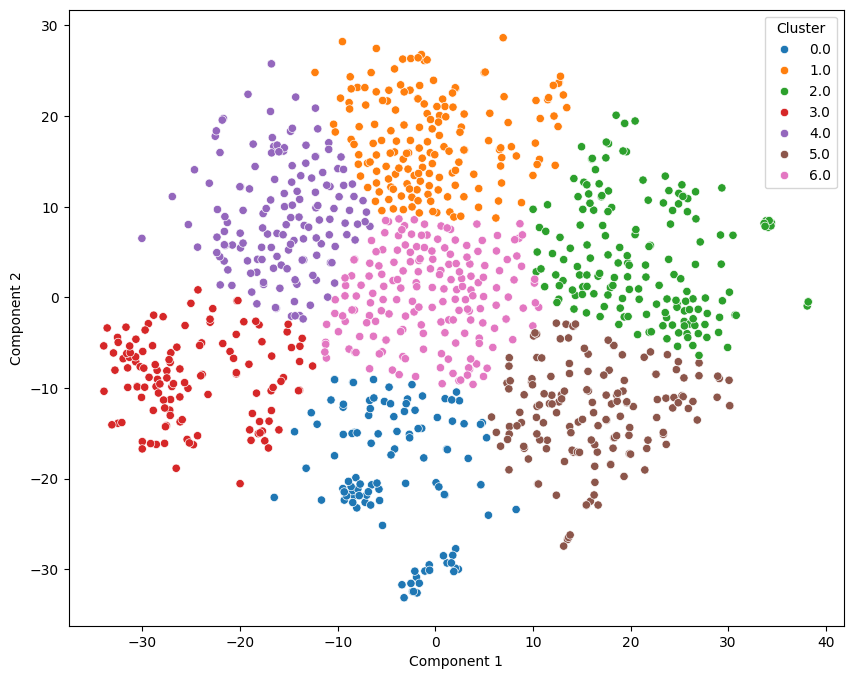

<Figure size 1000x800 with 0 Axes>

In [ ]:
from sklearn.manifold import TSNE
# tok variable comes from the countvectorizer + tfidf section
tok_tsne = TSNE(n_components=2,
                perplexity=50,
                early_exaggeration=12.0,
                learning_rate=200.0,
                max_iter=1000,
                n_iter_without_progress=300,
                min_grad_norm=1e-07,
                metric='euclidean',
                init='random',   # pca
                verbose=0,
                random_state=42,
                method='barnes_hut',   # exact
                angle=0.2,
                n_jobs=-1
               ).fit_transform(tok)

# Import KMeans clusterer
from sklearn.cluster import KMeans


kmeans2 = KMeans(n_clusters=len(dico), random_state=42,n_init=30).fit(tok_tsne)
    # Assign clusters
labels=kmeans2.labels_

title='BoVW + TFiDF + T-SNE 2 components'
# Evaluate and store metrics results)
append_dict(results, {'title'   : title,
                     'metrics' : clustering_evaluate(labels, data.cat_code,cat['category'])
                     }
           )
# clustering_evaluate(labels, data.cat_code,cat['index'])
print('Clustering on '+title)

plot_clusters(tok_tsne,labels)

##### BoVW + LDA +TSNE

,cluster,effectives
Category,,
Furniture,2,139
Baby,3,148
Watches,0,145
Decor,4,159
Kitchen,6,145
Beauty,1,154
Computers,5,160


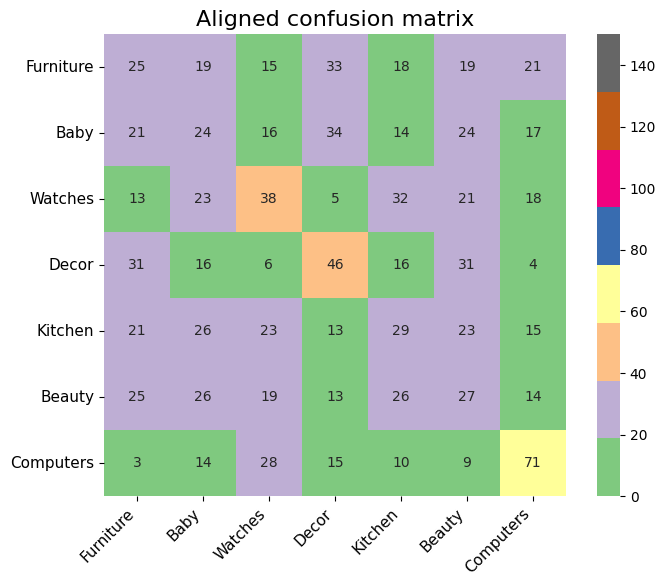

 ARI : 0.040391164516837476
              precision    recall  f1-score   support

   Furniture       0.00      0.00      0.00       150
        Baby       0.00      0.00      0.00       150
     Watches       0.24      0.47      0.32       150
       Decor       0.24      0.72      0.36       150
     Kitchen       0.18      0.17      0.17       150
      Beauty       0.00      0.00      0.00       150
   Computers       0.44      0.47      0.46       150

    accuracy                           0.26      1050
   macro avg       0.16      0.26      0.19      1050
weighted avg       0.16      0.26      0.19      1050

Clustering on BoVW + LDA + T-SNE 2 components


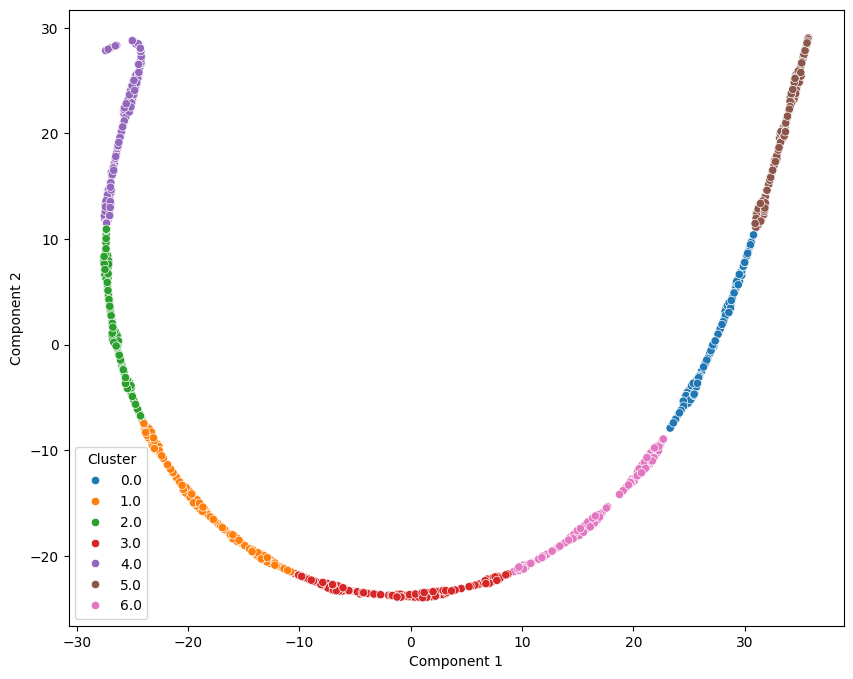

<Figure size 1000x800 with 0 Axes>

In [ ]:
from sklearn.manifold import TSNE
# tok variable comes from the countvectorizer + tfidf section
tok_tsne = TSNE(n_components=2,
                perplexity=50,
                early_exaggeration=12.0,
                learning_rate=200.0,
                max_iter=1000,
                n_iter_without_progress=300,
                min_grad_norm=1e-07,
                metric='euclidean',
                init='random',   # pca
                verbose=0,
                random_state=42,
                method='barnes_hut',   # exact
                angle=0.2,
                n_jobs=-1
               ).fit_transform(tok_lda)

# Import KMeans clusterer
from sklearn.cluster import KMeans


kmeans2 = KMeans(n_clusters=len(dico), random_state=42,n_init=30).fit(tok_tsne)
    # Assign clusters
labels=kmeans2.labels_

title='BoVW + LDA + T-SNE 2 components'
# Evaluate and store metrics results)
append_dict(results, {'title'   : title,
                     'metrics' : clustering_evaluate(labels, data.cat_code,cat['category'])
                     }
           )
# clustering_evaluate(labels, data.cat_code,cat['index'])
print('Clustering on '+title)

plot_clusters(tok_tsne,labels)

#### MDS

* **Distance preservation focus**: Maintains pairwise distances between documents in lower-dimensional space
* **Global relationship retention**: Preserves overall structure of document relationships
* **Similarity visualization**: Transforms abstract similarities into interpretable spatial relationships
* **Stress minimization**: Optimizes projection by minimizing distortion in distance representation
* **Metric integrity**: Provides faithful representation of original document dissimilarities
* **Euclidean interpretation**: Projected distances correspond meaningfully to original feature differences

Interesting to see that the MDS projection gives better results coupled with LDA approach (compared to TFIDF). The best ARI score is for the BoVW only strategy.

##### BoVW + MDS

,cluster,effectives
Category,,
Furniture,4,19
Baby,6,120
Watches,0,109
Decor,5,320
Kitchen,2,120
Beauty,1,203
Computers,3,159


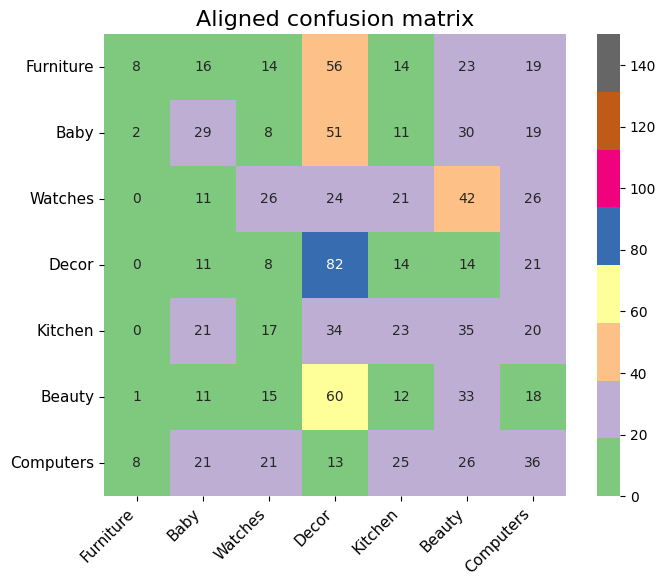

 ARI : 0.02720582283054257
              precision    recall  f1-score   support

   Furniture       0.42      0.05      0.09       150
        Baby       0.24      0.19      0.21       150
     Watches       0.22      0.45      0.29       150
       Decor       0.26      0.55      0.35       150
     Kitchen       0.00      0.00      0.00       150
      Beauty       0.00      0.00      0.00       150
   Computers       0.22      0.41      0.28       150

    accuracy                           0.24      1050
   macro avg       0.19      0.24      0.18      1050
weighted avg       0.19      0.24      0.18      1050

Clustering on BoVW + MDS 2 components


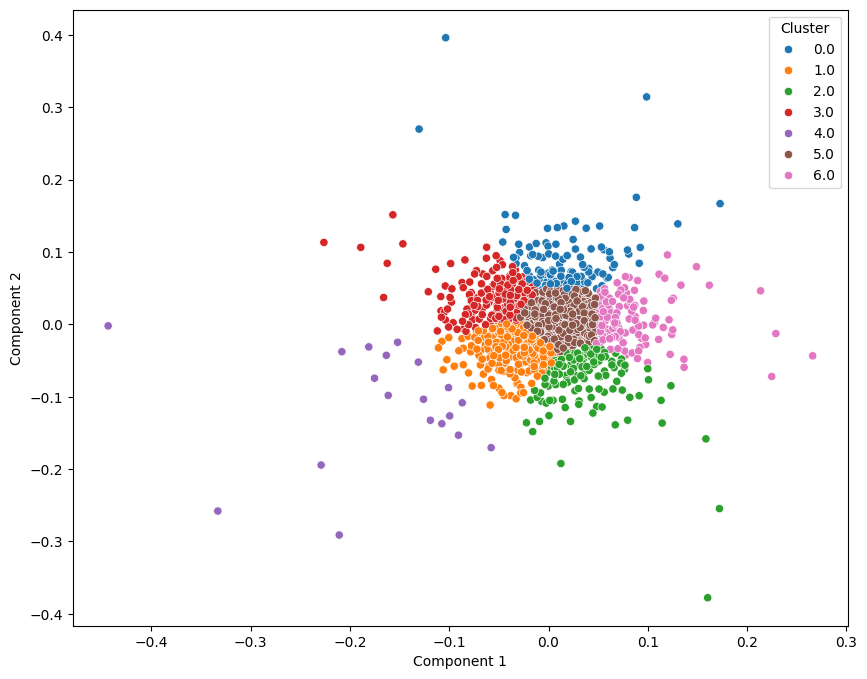

<Figure size 1000x800 with 0 Axes>

In [ ]:
from sklearn.manifold import MDS
bovw_mds = MDS(n_components=2,
              metric=True,
              n_init=4,
              max_iter=300,
              verbose=0,
              eps=0.001,
              n_jobs=-1,
              random_state=42,

             ).fit_transform(im_features)

# Import KMeans clusterer
from sklearn.cluster import KMeans


kmeans3 = KMeans(n_clusters=len(dico), random_state=42,n_init=30).fit(bovw_mds)
    # Assign clusters
labels=kmeans3.labels_

title='BoVW + MDS 2 components'
# Evaluate and store metrics results)
append_dict(results, {'title'   : title,
                     'metrics' : clustering_evaluate(labels, data.cat_code,cat['category'])
                     }
           )
# clustering_evaluate(labels, data.cat_code,cat['index'])
print('Clustering on '+title)

plot_clusters(bovw_mds,labels)

##### BoVW + tfidf + MDS

,cluster,effectives
Category,,
Furniture,4,163
Baby,0,153
Watches,2,149
Decor,5,124
Kitchen,6,154
Beauty,3,154
Computers,1,153


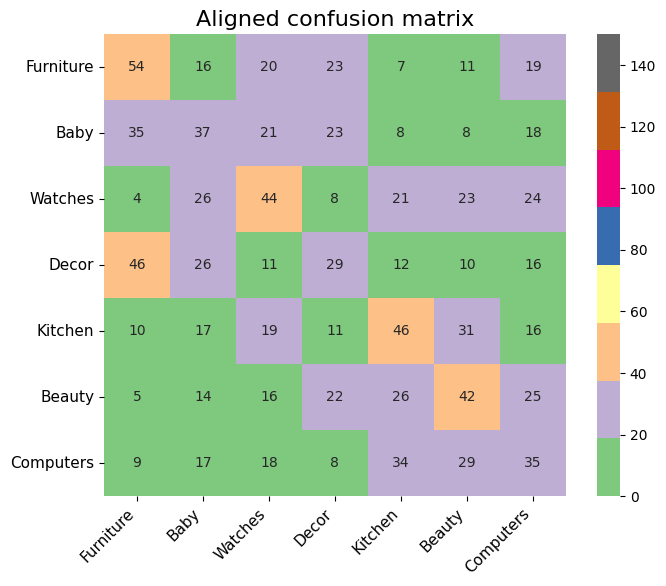

 ARI : 0.0442261723147406
              precision    recall  f1-score   support

   Furniture       0.33      0.36      0.35       150
        Baby       0.24      0.25      0.24       150
     Watches       0.30      0.29      0.29       150
       Decor       0.23      0.19      0.21       150
     Kitchen       0.30      0.31      0.30       150
      Beauty       0.27      0.28      0.28       150
   Computers       0.23      0.23      0.23       150

    accuracy                           0.27      1050
   macro avg       0.27      0.27      0.27      1050
weighted avg       0.27      0.27      0.27      1050

Clustering on BoVW + TFiDF + MDS 2 components


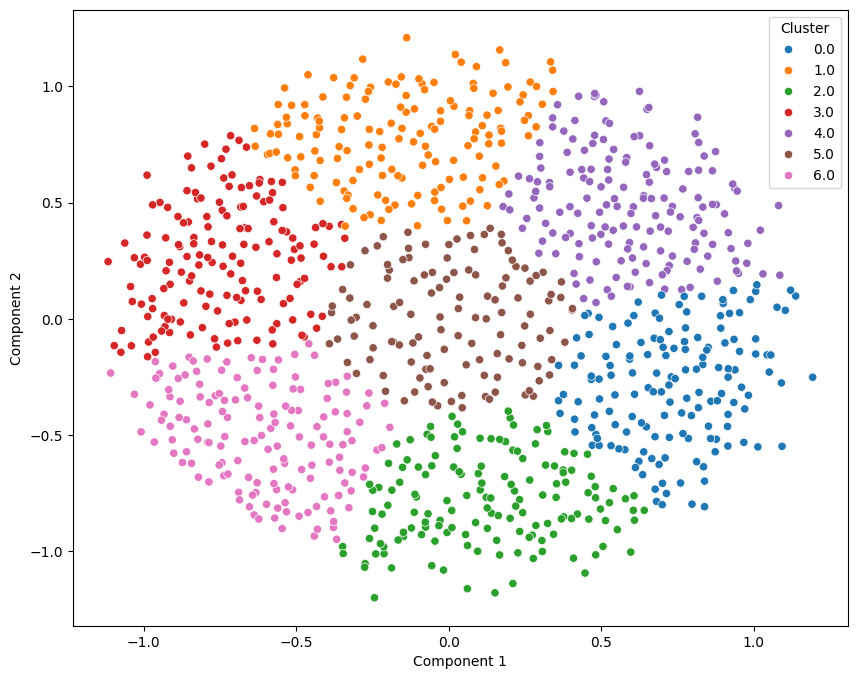

<Figure size 1000x800 with 0 Axes>

In [ ]:
from sklearn.manifold import MDS
tok_mds = MDS(n_components=2,
              metric=True,
              n_init=4,
              max_iter=300,
              verbose=0,
              eps=0.001,
              n_jobs=-1,
              random_state=42,

             ).fit_transform(tok)

# Import KMeans clusterer
from sklearn.cluster import KMeans


kmeans3 = KMeans(n_clusters=len(dico), random_state=42,n_init=30).fit(tok_mds)
    # Assign clusters
labels=kmeans3.labels_

title='BoVW + TFiDF + MDS 2 components'
# Evaluate and store metrics results)
append_dict(results, {'title'   : title,
                     'metrics' : clustering_evaluate(labels, data.cat_code,cat['category'])
                     }
           )
# clustering_evaluate(labels, data.cat_code,cat['index'])
print('Clustering on '+title)

plot_clusters(tok_mds,labels)

##### BoVW + LDA + MDS

,cluster,effectives
Category,,
Furniture,6,11
Baby,1,1
Watches,5,140
Decor,4,63
Kitchen,2,58
Beauty,0,713
Computers,3,64


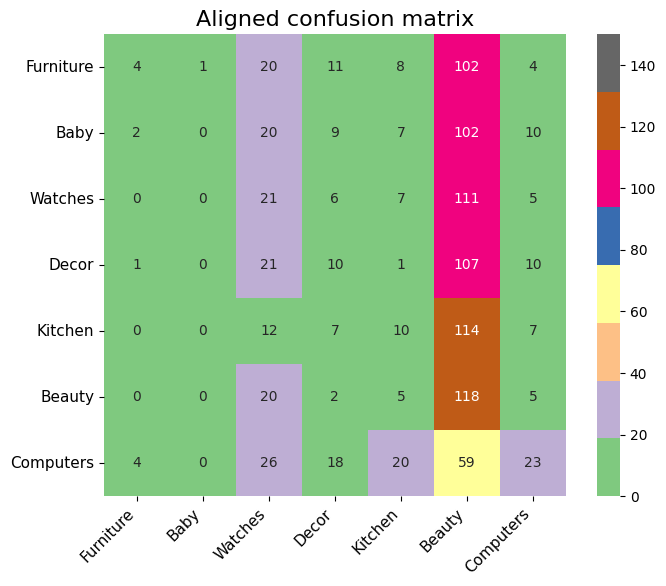

 ARI : 0.009711943398693652
              precision    recall  f1-score   support

   Furniture       0.42      0.03      0.06       150
        Baby       0.00      0.00      0.00       150
     Watches       0.00      0.00      0.00       150
       Decor       0.00      0.00      0.00       150
     Kitchen       0.00      0.00      0.00       150
      Beauty       0.17      0.79      0.27       150
   Computers       0.27      0.58      0.37       150

    accuracy                           0.20      1050
   macro avg       0.12      0.20      0.10      1050
weighted avg       0.12      0.20      0.10      1050

Clustering on BoVW + LDA + MDS 2 components


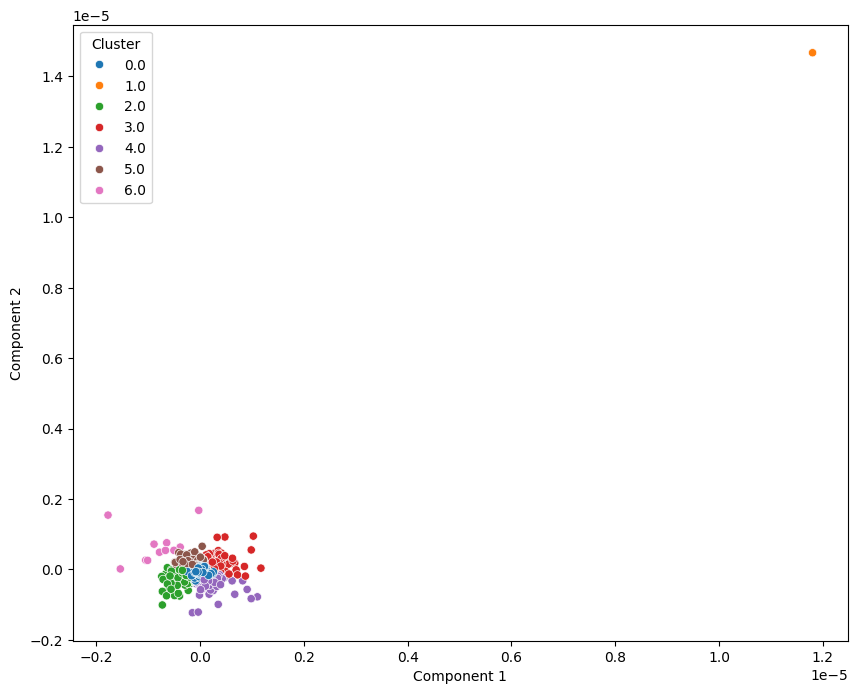

<Figure size 1000x800 with 0 Axes>

In [ ]:
from sklearn.manifold import MDS
tok_mds = MDS(n_components=2,
              metric=True,
              n_init=4,
              max_iter=300,
              verbose=0,
              eps=0.001,
              n_jobs=-1,
              random_state=42,

             ).fit_transform(tok_lda)

# Import KMeans clusterer
from sklearn.cluster import KMeans


kmeans3 = KMeans(n_clusters=len(dico), random_state=42,n_init=30).fit(tok_mds)
    # Assign clusters
labels=kmeans3.labels_

title='BoVW + LDA + MDS 2 components'
# Evaluate and store metrics results)
append_dict(results, {'title'   : title,
                     'metrics' : clustering_evaluate(labels, data.cat_code,cat['category'])
                     }
           )
# clustering_evaluate(labels, data.cat_code,cat['index'])
print('Clustering on '+title)

plot_clusters(tok_mds,labels)

#### SpectralEmbedding

* **Graph-based approach**: Leverages connectivity patterns between documents for dimensionality reduction
* **Non-linear manifold learning**: Captures intrinsic geometric structure of the document space
* **Eigenvector foundation**: Uses the most significant eigenvectors of the graph Laplacian matrix
* **Community detection strength**: Excels at revealing natural groupings and thematic communities
* **Connectivity preservation**: Maintains connected components from the high-dimensional space
* **Local-to-global mapping**: Builds global representation from local neighborhood information

On spectral projection, TFIDF gives better results than LDA. BoVW only ARI score is also falling.

##### BoVW + spectral

,cluster,effectives
Category,,
Furniture,2,50
Baby,3,80
Watches,1,190
Decor,5,337
Kitchen,6,121
Beauty,0,198
Computers,4,74


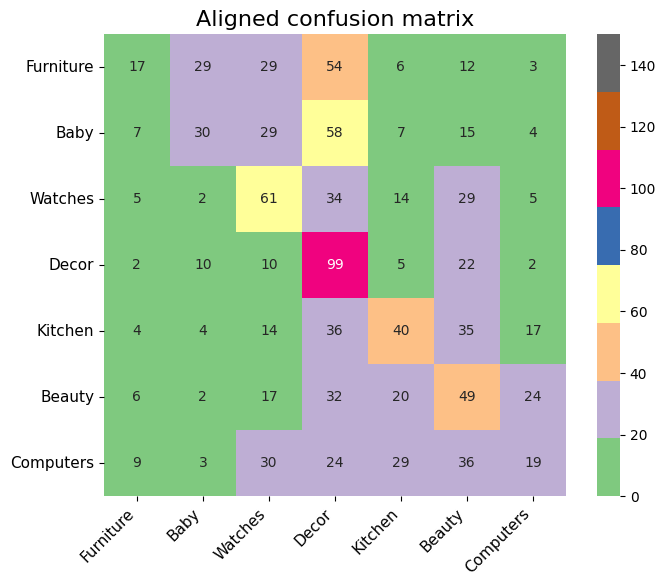

 ARI : 0.0551062660352678
              precision    recall  f1-score   support

   Furniture       0.34      0.11      0.17       150
        Baby       0.38      0.20      0.26       150
     Watches       0.32      0.41      0.36       150
       Decor       0.29      0.66      0.41       150
     Kitchen       0.33      0.27      0.30       150
      Beauty       0.27      0.49      0.35       150
   Computers       0.00      0.00      0.00       150

    accuracy                           0.30      1050
   macro avg       0.28      0.30      0.26      1050
weighted avg       0.28      0.30      0.26      1050

Clustering on BoVW + Spectral 2 components


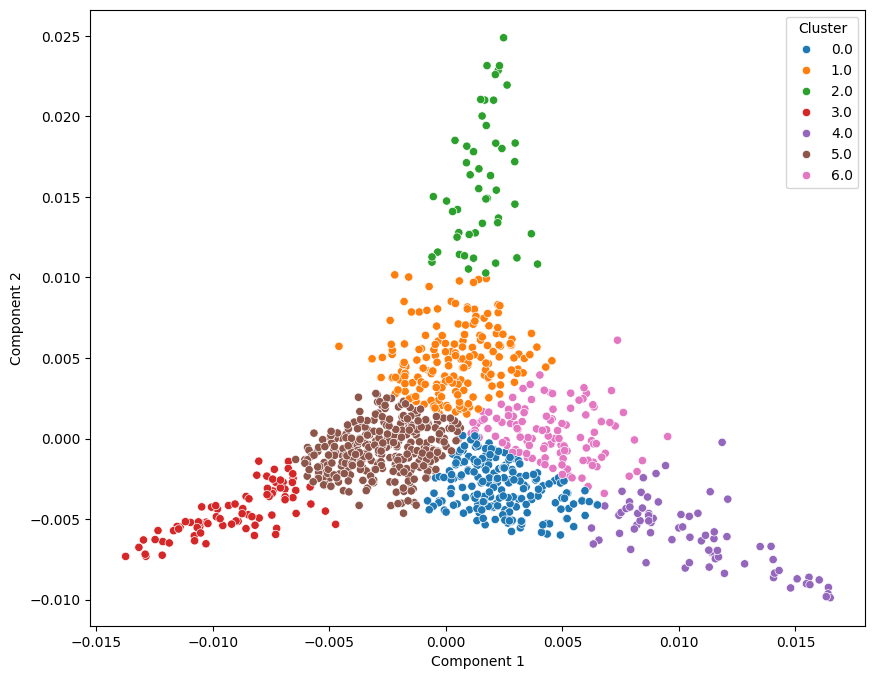

<Figure size 1000x800 with 0 Axes>

In [ ]:
from sklearn.manifold import SpectralEmbedding
bovw_spec = SpectralEmbedding(n_components=2,
                             affinity='nearest_neighbors', # rbf
                             gamma=None,
                             random_state=42,
                             eigen_solver=None, # arpack lobpcg amg
                             n_neighbors=50,
                             n_jobs=-1
                            ).fit_transform(im_features)

# Import KMeans clusterer
from sklearn.cluster import KMeans


kmeans4 = KMeans(n_clusters=len(dico), random_state=42,n_init=30).fit(bovw_spec)
    # Assign clusters
labels=kmeans4.labels_

title='BoVW + Spectral 2 components'
# Evaluate and store metrics results)
append_dict(results, {'title'   : title,
                     'metrics' : clustering_evaluate(labels, data.cat_code,cat['category'])
                     }
           )
# clustering_evaluate(labels, data.cat_code,cat['index'])
print('Clustering on '+title)

plot_clusters(bovw_spec,labels)

##### BoVW + tfidf + spectral

,cluster,effectives
Category,,
Furniture,6,76
Baby,1,264
Watches,5,81
Decor,3,195
Kitchen,4,277
Beauty,0,101
Computers,2,56


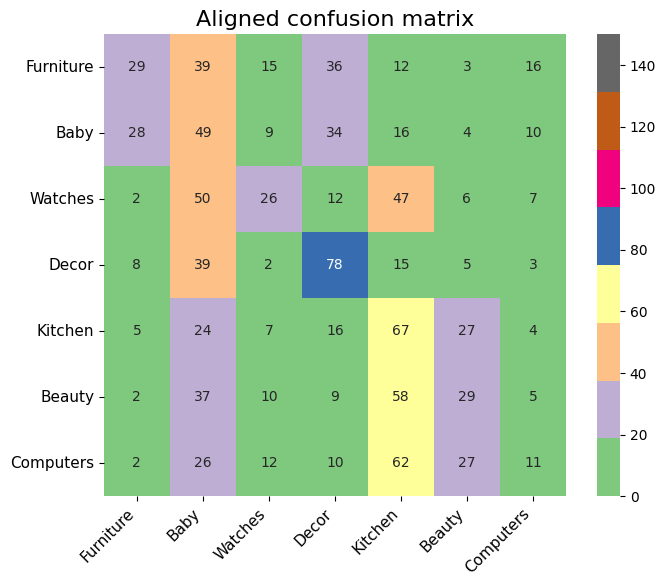

 ARI : 0.06161508906730739
              precision    recall  f1-score   support

   Furniture       0.34      0.30      0.32       150
        Baby       0.00      0.00      0.00       150
     Watches       0.22      0.51      0.31       150
       Decor       0.40      0.52      0.45       150
     Kitchen       0.24      0.45      0.31       150
      Beauty       0.29      0.19      0.23       150
   Computers       0.00      0.00      0.00       150

    accuracy                           0.28      1050
   macro avg       0.21      0.28      0.23      1050
weighted avg       0.21      0.28      0.23      1050

Clustering on BoVW + TFiDF + Spectral 2 components


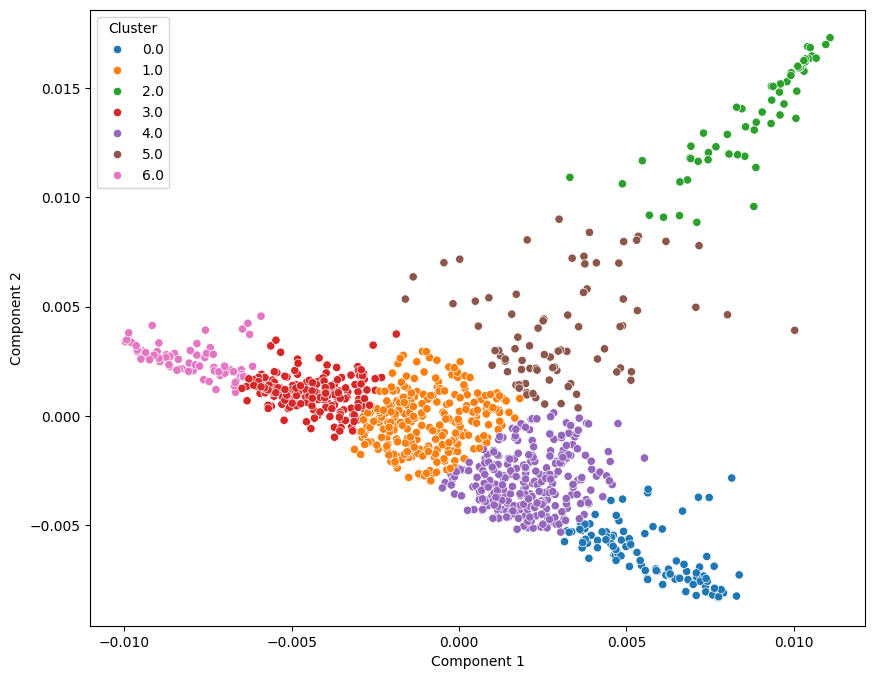

<Figure size 1000x800 with 0 Axes>

In [ ]:
from sklearn.manifold import SpectralEmbedding
tok_spec = SpectralEmbedding(n_components=2,
                             affinity='nearest_neighbors', # rbf
                             gamma=None,
                             random_state=42,
                             eigen_solver=None, # arpack lobpcg amg
                             n_neighbors=50,
                             n_jobs=-1
                            ).fit_transform(tok)

# Import KMeans clusterer
from sklearn.cluster import KMeans


kmeans4 = KMeans(n_clusters=len(dico), random_state=42,n_init=30).fit(tok_spec)
    # Assign clusters
labels=kmeans4.labels_

title='BoVW + TFiDF + Spectral 2 components'
# Evaluate and store metrics results)
append_dict(results, {'title'   : title,
                     'metrics' : clustering_evaluate(labels, data.cat_code,cat['category'])
                     }
           )
# clustering_evaluate(labels, data.cat_code,cat['index'])
print('Clustering on '+title)

plot_clusters(tok_spec,labels)

##### BoVW + LDA + spectral

,cluster,effectives
Category,,
Furniture,6,119
Baby,1,125
Watches,0,120
Decor,4,208
Kitchen,2,178
Beauty,5,115
Computers,3,185


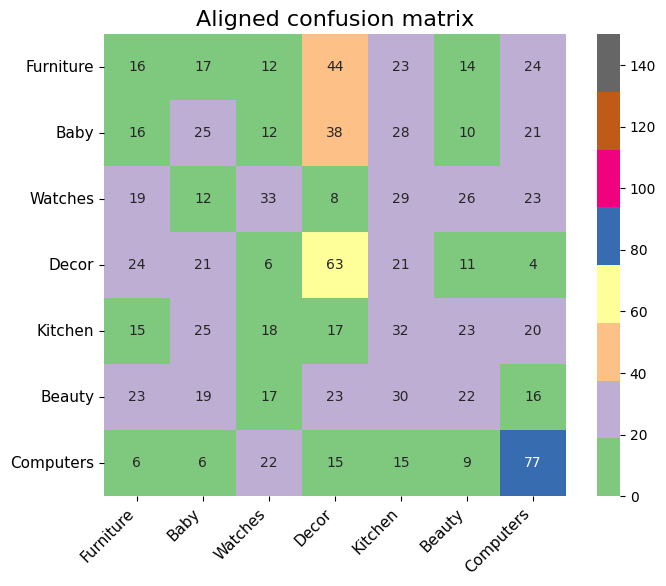

 ARI : 0.04539980371947803
              precision    recall  f1-score   support

   Furniture       0.00      0.00      0.00       150
        Baby       0.20      0.17      0.18       150
     Watches       0.25      0.39      0.31       150
       Decor       0.27      0.58      0.36       150
     Kitchen       0.18      0.21      0.20       150
      Beauty       0.00      0.00      0.00       150
   Computers       0.42      0.51      0.46       150

    accuracy                           0.27      1050
   macro avg       0.19      0.27      0.22      1050
weighted avg       0.19      0.27      0.22      1050

Clustering on BoVW + LDA + Spectral 2 components


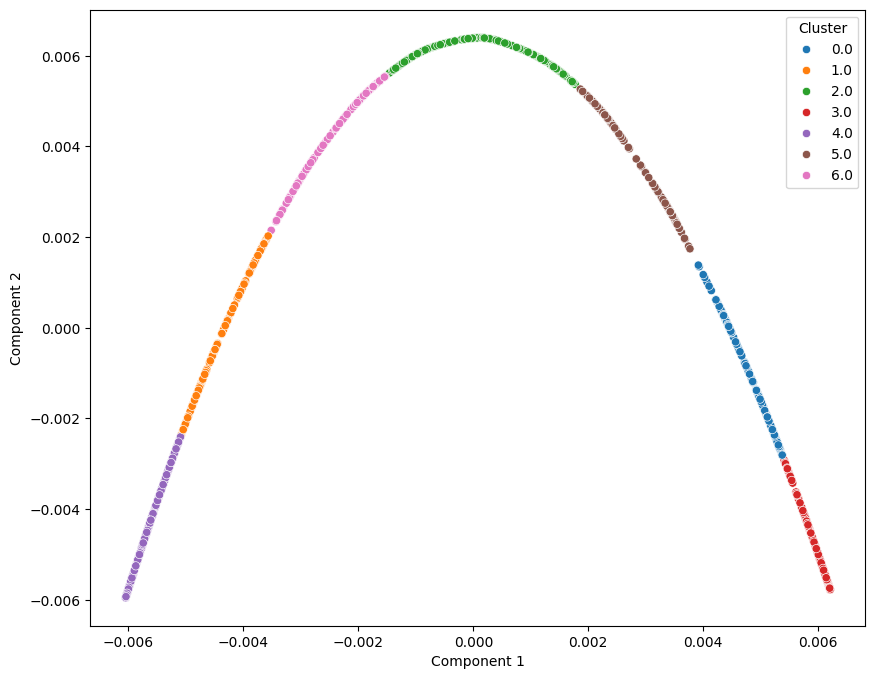

<Figure size 1000x800 with 0 Axes>

In [ ]:
from sklearn.manifold import SpectralEmbedding
tok_spec = SpectralEmbedding(n_components=2,
                             affinity='nearest_neighbors', # rbf
                             gamma=None,
                             random_state=42,
                             eigen_solver=None, # arpack lobpcg amg
                             n_neighbors=50,
                             n_jobs=-1
                            ).fit_transform(tok_lda)

# Import KMeans clusterer
from sklearn.cluster import KMeans


kmeans4 = KMeans(n_clusters=len(dico), random_state=42,n_init=30).fit(tok_spec)
    # Assign clusters
labels=kmeans4.labels_

title='BoVW + LDA + Spectral 2 components'
# Evaluate and store metrics results)
append_dict(results, {'title'   : title,
                     'metrics' : clustering_evaluate(labels, data.cat_code,cat['category'])
                     }
           )
# clustering_evaluate(labels, data.cat_code,cat['index'])
print('Clustering on '+title)

plot_clusters(tok_spec,labels)

#### UMAP

* **Balanced structure preservation**: Maintains both local similarity relationships and global data patterns
* **Topological foundation**: Constructs representation based on manifold topology and fuzzy simplicial sets
* **Computational efficiency**: Delivers t-SNE-like quality with significantly better performance
* **Meaningful distance preservation**: Maintains more of the important distance relationships than t-SNE
* **Theoretical rigor**: Built on stronger mathematical foundations with clearer optimization objectives
* **Cluster separation clarity**: Produces well-defined clusters while preserving their relative positions

On UMAP projection, TFIDF gives better results than LDA. BoVW only ARI score fell a bit.

##### BoVW + UMAP

/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


,cluster,effectives
Category,,
Furniture,3,160
Baby,5,155
Watches,1,148
Decor,0,195
Kitchen,6,61
Beauty,4,190
Computers,2,141


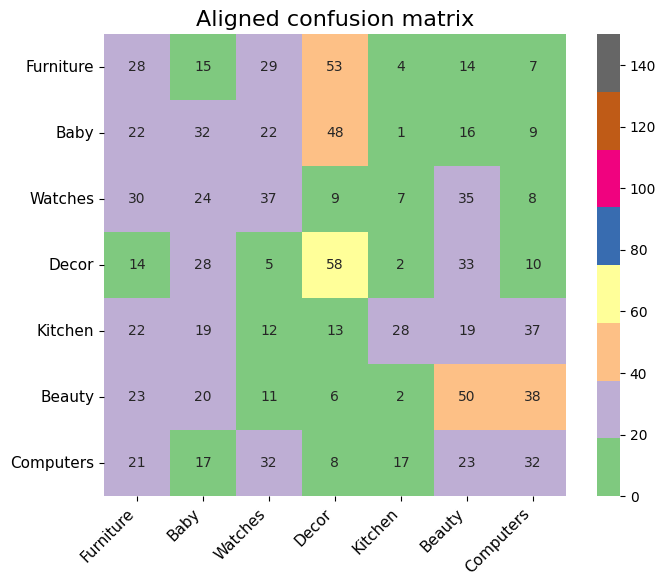

 ARI : 0.04914915693964755
              precision    recall  f1-score   support

   Furniture       0.00      0.00      0.00       150
        Baby       0.21      0.21      0.21       150
     Watches       0.22      0.45      0.29       150
       Decor       0.30      0.39      0.34       150
     Kitchen       0.46      0.19      0.27       150
      Beauty       0.27      0.59      0.37       150
   Computers       0.00      0.00      0.00       150

    accuracy                           0.26      1050
   macro avg       0.21      0.26      0.21      1050
weighted avg       0.21      0.26      0.21      1050

Clustering on BoVW + UMAP 2 components


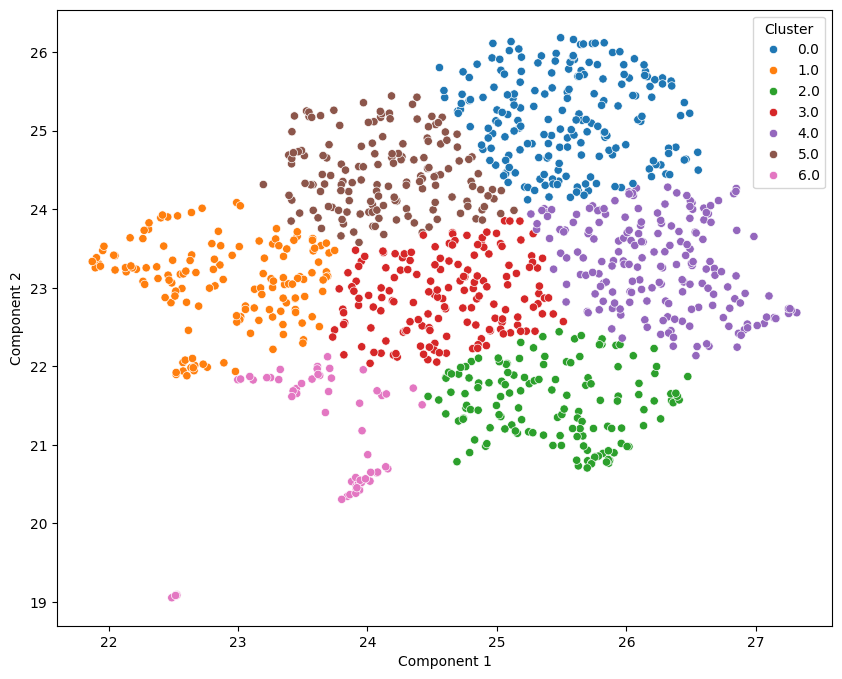

<Figure size 1000x800 with 0 Axes>

In [ ]:
import umap

Umap = umap.UMAP(
                n_neighbors=50,
                min_dist=0.1,
                n_components=2,
                metric='euclidean',
                random_state=42
    )
bovw_umap = Umap.fit_transform(im_features)

kmeans5 = KMeans(n_clusters=len(dico), random_state=42,n_init=30).fit(bovw_umap)
    # Assign clusters
labels=kmeans5.labels_

title='BoVW + UMAP 2 components'
# Evaluate and store metrics results)
append_dict(results, {'title'   : title,
                     'metrics' : clustering_evaluate(labels, data.cat_code,cat['category'])
                     }
           )
# clustering_evaluate(labels, data.cat_code,cat['index'])
print('Clustering on '+title)

plot_clusters(bovw_umap,labels)

##### BoVW + tfidf + UMAP

/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


,cluster,effectives
Category,,
Furniture,4,157
Baby,0,180
Watches,2,104
Decor,3,165
Kitchen,1,146
Beauty,5,126
Computers,6,172


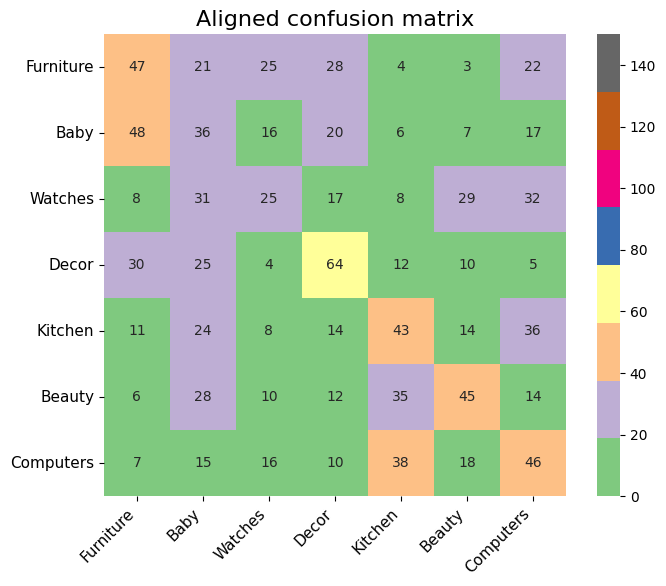

 ARI : 0.0618723513048769
              precision    recall  f1-score   support

   Furniture       0.24      0.17      0.20       150
        Baby       0.25      0.56      0.34       150
     Watches       0.00      0.00      0.00       150
       Decor       0.39      0.43      0.41       150
     Kitchen       0.29      0.29      0.29       150
      Beauty       0.36      0.30      0.33       150
   Computers       0.27      0.31      0.29       150

    accuracy                           0.29      1050
   macro avg       0.26      0.29      0.26      1050
weighted avg       0.26      0.29      0.26      1050

Clustering on BoVW + TFiDF + UMAP 2 components


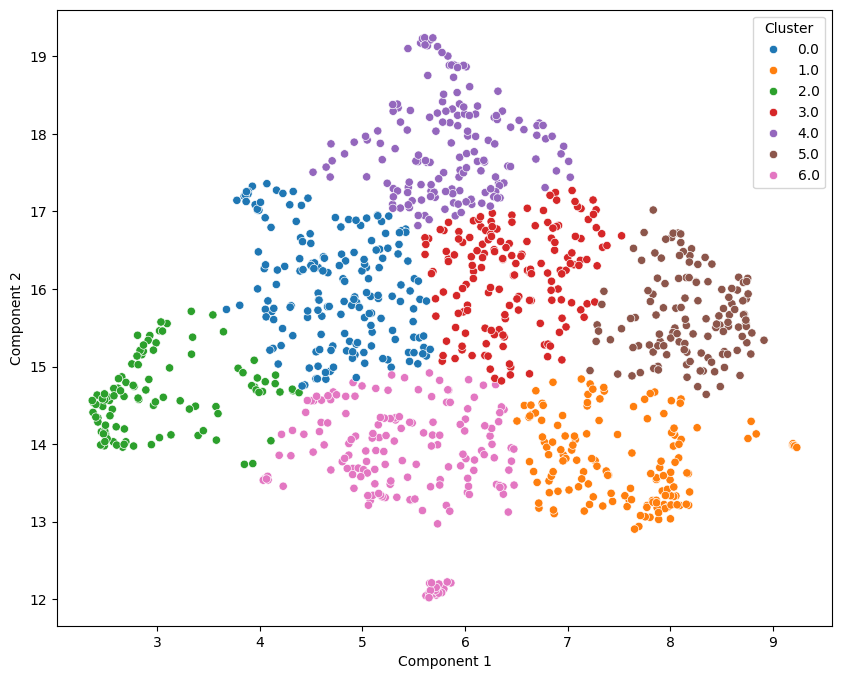

<Figure size 1000x800 with 0 Axes>

In [ ]:
import umap

Umap = umap.UMAP(
                n_neighbors=50,
                min_dist=0.1,
                n_components=2,
                metric='euclidean',
                random_state=42
    )
tok_umap = Umap.fit_transform(tok)

kmeans5 = KMeans(n_clusters=len(dico), random_state=42,n_init=30).fit(tok_umap)
    # Assign clusters
labels=kmeans5.labels_

title='BoVW + TFiDF + UMAP 2 components'
# Evaluate and store metrics results)
append_dict(results, {'title'   : title,
                     'metrics' : clustering_evaluate(labels, data.cat_code,cat['category'])
                     }
           )
# clustering_evaluate(labels, data.cat_code,cat['index'])
print('Clustering on '+title)

plot_clusters(tok_umap,labels)

##### BoVW + LDA + UMAP

/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


,cluster,effectives
Category,,
Furniture,5,168
Baby,0,177
Watches,6,48
Decor,4,164
Kitchen,1,174
Beauty,2,94
Computers,3,225


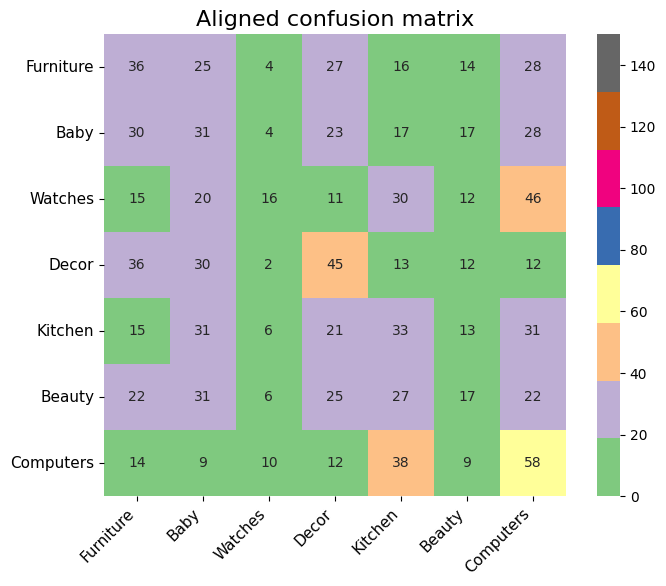

 ARI : 0.02229705142849149
              precision    recall  f1-score   support

   Furniture       0.21      0.24      0.23       150
        Baby       0.18      0.32      0.23       150
     Watches       0.33      0.11      0.16       150
       Decor       0.27      0.30      0.29       150
     Kitchen       0.00      0.00      0.00       150
      Beauty       0.00      0.00      0.00       150
   Computers       0.24      0.64      0.35       150

    accuracy                           0.23      1050
   macro avg       0.18      0.23      0.18      1050
weighted avg       0.18      0.23      0.18      1050

Clustering on BoVW + LDA + UMAP 2 components


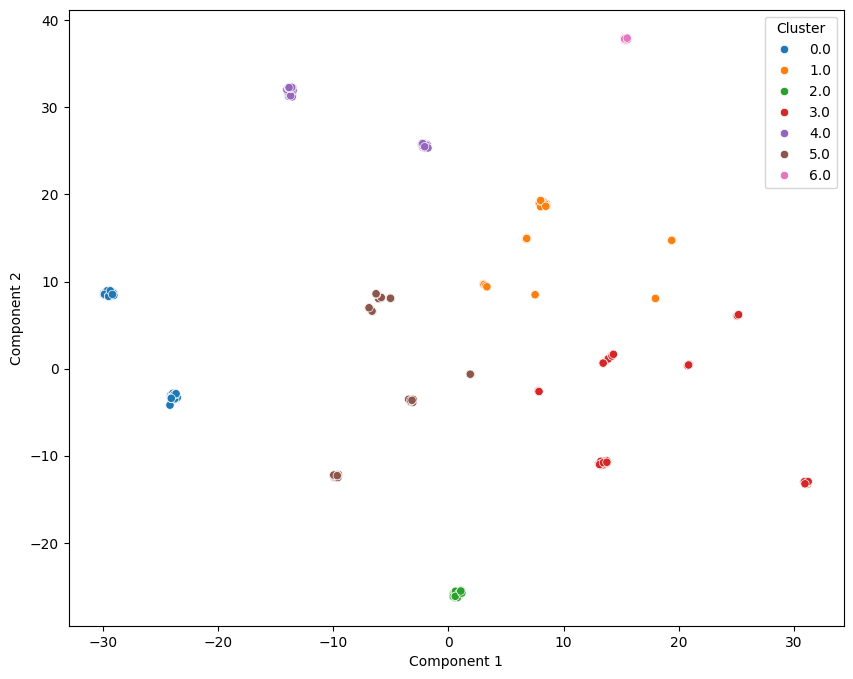

<Figure size 1000x800 with 0 Axes>

In [ ]:
import umap

Umap = umap.UMAP(
                n_neighbors=50,
                min_dist=0.1,
                n_components=2,
                metric='euclidean',
                random_state=42
    )
tok_umap = Umap.fit_transform(tok_lda)

kmeans5 = KMeans(n_clusters=len(dico), random_state=42,n_init=30).fit(tok_umap)
    # Assign clusters
labels=kmeans5.labels_

title='BoVW + LDA + UMAP 2 components'
# Evaluate and store metrics results)
append_dict(results, {'title'   : title,
                     'metrics' : clustering_evaluate(labels, data.cat_code,cat['category'])
                     }
           )
# clustering_evaluate(labels, data.cat_code,cat['index'])
print('Clustering on '+title)

plot_clusters(tok_umap,labels)

### Visual analysis: T-SNE display by image category
* The "cloudy" and "rain" categories are partially separated.

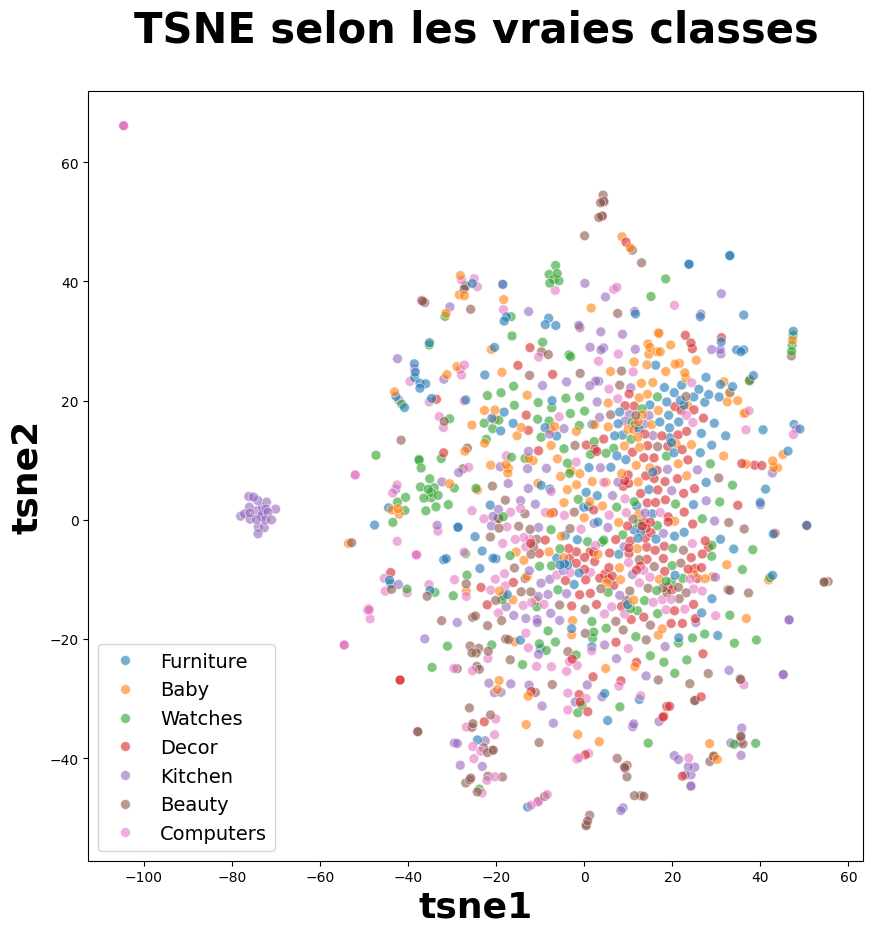

In [ ]:
plt.figure(figsize=(10,10))
sns.scatterplot(
    x="tsne1", y="tsne2", hue="class", data=df_tsne, legend="brief",
    palette=sns.color_palette('tab10', n_colors=7), s=50, alpha=0.6)

plt.title('TSNE selon les vraies classes', fontsize = 30, pad = 35, fontweight = 'bold')
plt.xlabel('tsne1', fontsize = 26, fontweight = 'bold')
plt.ylabel('tsne2', fontsize = 26, fontweight = 'bold')
plt.legend(prop={'size': 14})

plt.show()


### Measure analysis: similarity between categories and clusters

####  Cluster creation from T-SNE

In [ ]:
from sklearn import cluster, metrics

cls = cluster.KMeans(n_clusters=7, random_state=6)
cls.fit(X_tsne)

df_tsne["cluster"] = cls.labels_
print(df_tsne.shape)


(1050, 4)


####  Display of images by clusters and ARI calculation of image category/cluster similarity

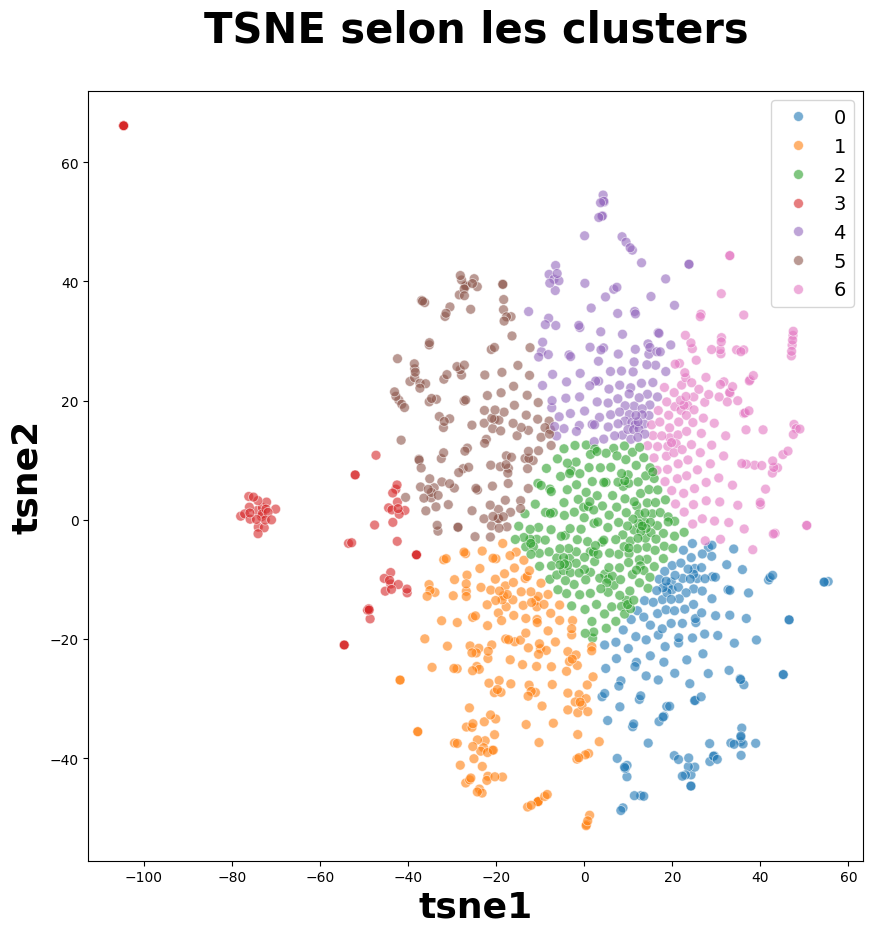

ARI :  0.04181923191995559


In [ ]:
plt.figure(figsize=(10,10))
sns.scatterplot(
    x="tsne1", y="tsne2",
    hue="cluster",
    palette=sns.color_palette('tab10', n_colors=7), s=50, alpha=0.6,
    data=df_tsne,
    legend="brief")

plt.title('TSNE selon les clusters', fontsize = 30, pad = 35, fontweight = 'bold')
plt.xlabel('tsne1', fontsize = 26, fontweight = 'bold')
plt.ylabel('tsne2', fontsize = 26, fontweight = 'bold')
plt.legend(prop={'size': 14})

plt.show()

labels = data.cat_code

print("ARI : ", metrics.adjusted_rand_score(labels, cls.labels_))

#### Class analysis
* La matrice de confusion doit être transformée par permutation de colonnes afin de maximiser la diagonale pour obtenir une correspondance entre les catégories réelles et estimées

In [ ]:
# Dictionary to hold results
# Function to append results to result_dict
def append_dict(dict1_obj, dict2_obj):
    for key in dict1_obj.keys():
        dict1_obj[key].append(dict2_obj[key])

# Initialize results dictionary
results={'title' : [], 'metrics':[]}

In [ ]:
from sklearn.cluster import KMeans
from sklearn.metrics import adjusted_rand_score
from sklearn.metrics import confusion_matrix,ConfusionMatrixDisplay,classification_report
from scipy.optimize import linear_sum_assignment
from collections import Counter

from sklearn.cluster import KMeans
from sklearn.metrics import precision_recall_fscore_support
from sklearn.metrics import adjusted_rand_score
from sklearn.metrics import confusion_matrix,ConfusionMatrixDisplay,classification_report
from scipy.optimize import linear_sum_assignment
from collections import Counter

# Fonctions d'évaluation des clusters

def plot_conf_mat(matrix,y_names,x_names,title=''):
#     print(y_names,x_names)

    fig,axe=plt.subplots(figsize=(8,6))

    sns.heatmap(matrix, annot=True, cmap='Accent',ax=axe, square=True,fmt='g',vmin=0,vmax=150)
    axe.set_yticklabels(y_names,rotation = 0,fontsize=11)
    axe.set_xticklabels(x_names, rotation = 45, ha="right",fontsize=11)
    axe.set_title(title,fontsize=16)
    plt.show()


"""
Main function.
Evaluates clustering performance by comparing predicted cluster labels with ground truth labels.

This function performs several key evaluation steps:
1. Counts the frequency of each cluster
2. Computes a confusion matrix between predicted clusters and true categories
3. Optimizes cluster-to-category alignment using the Hungarian algorithm
4. Visualizes the aligned confusion matrix
5. Calculates the Adjusted Rand Index (ARI) to measure clustering quality
6. Generates a detailed classification report with precision, recall, and F1-score

Parameters:
    pred_labels (array-like): Predicted cluster labels from clustering algorithm
    true_labels (array-like): Ground truth category labels
    cat_names (list): List of category names for visualization and reporting

Returns:
    tuple: ((precision, recall, f1, support), ari) - Macro-averaged metrics and ARI score
"""
def clustering_evaluate(pred_labels, true_labels, cat_names):

    # Count clusters effectives
    effectives=dict(sorted(Counter(pred_labels).items()))

    # compute confusion matrix
    conf_mat=confusion_matrix(true_labels,pred_labels)

    # Plot confusion matrix
#     plot_conf_mat(conf_mat,cat['index'],range(7),title='Confusion matrix')

    # Maximize values on first diagonal
    row_ind, col_ind = linear_sum_assignment(conf_mat,maximize=True)
    permut = pd.DataFrame(col_ind,index=cat['category'],columns=['cluster'])
    permut.index.rename('Category',inplace=True)
    permut['effectives']=[effectives[cls] for cls in permut.cluster]
    display(permut)
    cm=conf_mat.take(col_ind,axis=1)

    # Plot aligned confusion matrix
    plot_conf_mat(cm,cat_names,cat_names,title='Aligned confusion matrix')

    # Align cluster label on category code   [corresp[cls] for cls in labels]
    corresp = np.argmax(conf_mat, axis=0)

    # print  adjusted rand score
    ari = adjusted_rand_score(true_labels,pred_labels)
    print(' ARI : {}'.format(ari))

    # Print classification report
    print(classification_report(true_labels,
                                [corresp[cls] for cls in pred_labels],
                                target_names=cat_names,
                                zero_division=0)
         )
    return  precision_recall_fscore_support(true_labels,
                                [corresp[cls] for cls in pred_labels],
                                             average='macro', zero_division=0), ari

def plot_clusters(reduced,labels):
    data=pd.DataFrame([reduced,labels],columns=['Component 1','Component 2','Cluster'])
    fig=px.scatter(data,x='Component 1',y='Component 2',color='Cluster')

,cluster,effectives
Category,,
Furniture,2,140
Baby,4,168
Watches,5,169
Decor,0,181
Kitchen,1,217
Beauty,3,168
Computers,6,7


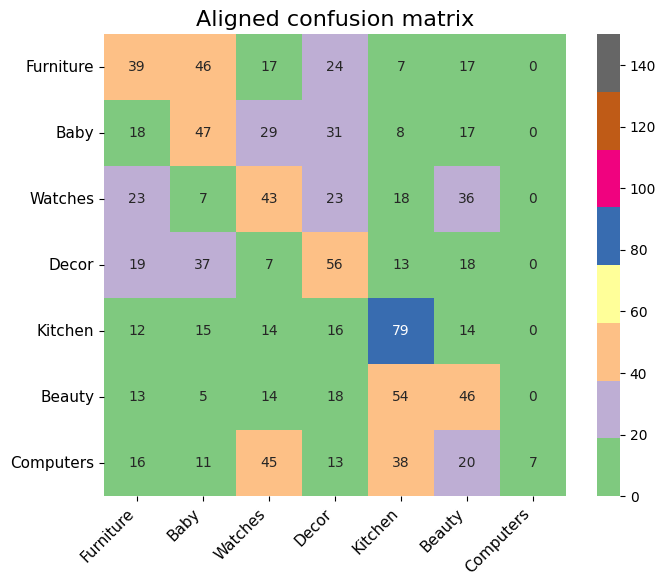

 ARI : 0.06860263554033685
              precision    recall  f1-score   support

   Furniture       0.28      0.26      0.27       150
        Baby       0.28      0.31      0.30       150
     Watches       0.00      0.00      0.00       150
       Decor       0.31      0.37      0.34       150
     Kitchen       0.36      0.53      0.43       150
      Beauty       0.27      0.31      0.29       150
   Computers       0.30      0.35      0.32       150

    accuracy                           0.30      1050
   macro avg       0.26      0.30      0.28      1050
weighted avg       0.26      0.30      0.28      1050

Clustering sur BoVW SIFT descriptors


In [ ]:
title='BoVW SIFT descriptors'
# Evaluate and store metrics results)
append_dict(results, {'title'   : title,
                     'metrics' : clustering_evaluate(cls.labels_, data.cat_code,cat['category'])
                     }
           )
# clustering_evaluate(labels, data.cat_code,cat['index'])
print('Clustering sur '+title)

## Visualisation of images in each cluster

In [ ]:
def view_cluster(pred_labels):
    # Dict to hold the cluster id and the images { id: [images] }
    groups_per = {}
    print('Create groups of images per cluster...')
    # Filling groups
    for file, cluster in zip(data.image,pred_labels):
        if cluster not in groups_per.keys():
            groups_per[cluster] = []
            groups_per[cluster].append(file)
        else:
            groups_per[cluster].append(file)
    print('done.')

    # loops on clusters for content sample
    for cluster in tnrange(7,desc='Printing images by cluster'):
        plt.figure(figsize = (25,25));
        # gets the list of filenames for a cluster
        files = groups_per[cluster]
        # only allow up to 30 images to be shown at a time
        if len(files) > 30:
            print(f"Clipping cluster {cluster} size from {len(files)} to 30")
            files = files[:29]
        else:
            print(f"Cluster {cluster} size {len(files)}")
        # plot each image in the cluster
        for index, file in enumerate(files):
            plt.subplot(10,10,index+1);
            img = cv2.imread(path+file)

            img = np.array(img)
            plt.imshow(img,cmap='gray')
            plt.axis('off')
        plt.show()



In [ ]:
# Show a sample of 30 image in each cluster for visual verification
print('In cluster image with BoVW SIFT descriptors')
view_cluster(cls.labels_)

Output hidden; open in https://colab.research.google.com to view.

# ORB descriptors

- Speed: ORB has been designed to be fast while retaining certain invariances. It is based on the FAST algorithm for corner detection and uses a modified version of BRIEF for descriptors.

- Rotationally invariant but not scale-invariant: ORB is rotationally invariant, but not scale-invariant contrary to SIFT. ORB can be used with an image pyramid for some form of scale invariance, but this is not its strong point.

- Performance and use: ORB is also less complex than SIFT, making it suitable for real-time applications and on devices with limited resources.



## Determining and displaying ORB descriptors



In [75]:
# Image size for ORB process
image_size=(500,500)

Grey levels


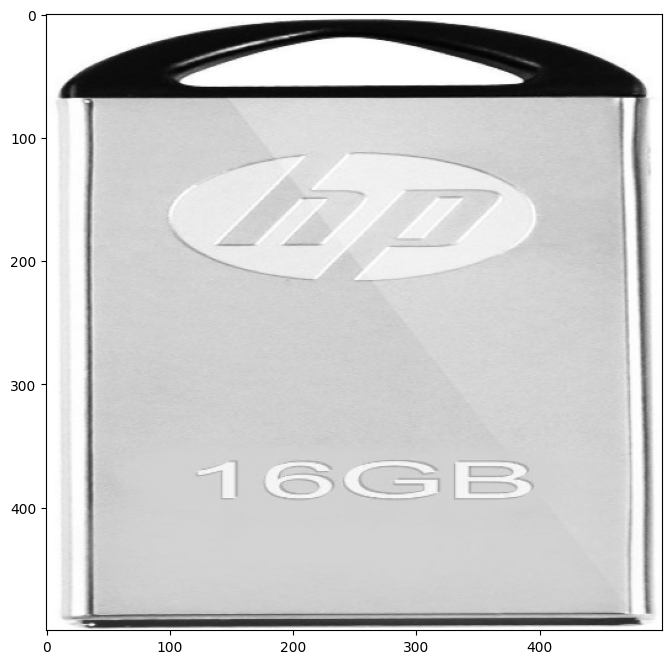

Adaptative contract equalization


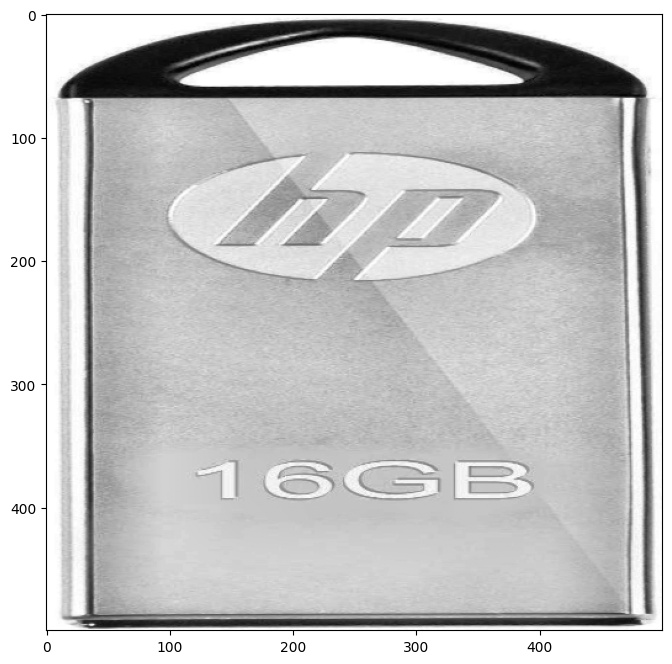

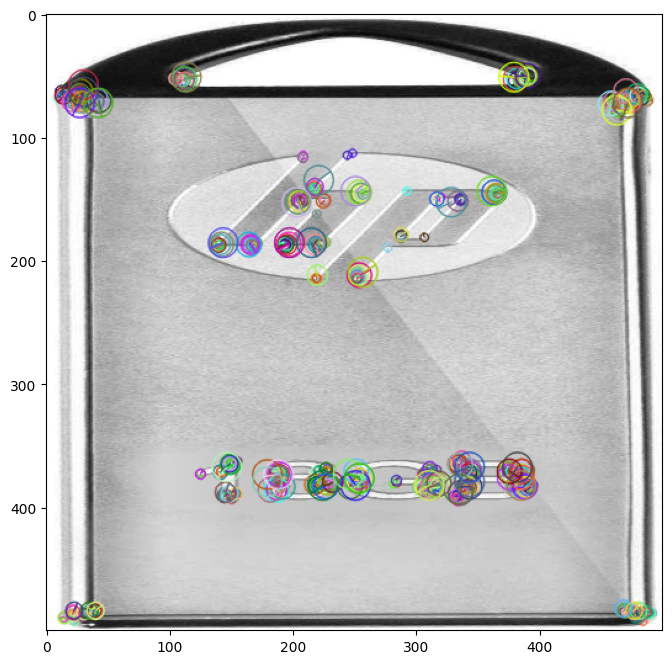

Descriptors :  (500, 32)

[[241 201 219 ...  12 150 155]
 [169   9 217 ...  12 162  25]
 [241 201 219 ...  12 166 233]
 ...
 [233   1 212 ...  31 164 174]
 [235   9 221 ... 187 160 158]
 [169  33 218 ...  30 178  26]]


In [76]:
import cv2


orb = cv2.ORB_create(nfeatures = 500,
                     scaleFactor = 1.2,
                     nlevels = 8,
                     edgeThreshold = 8,
                     firstLevel = 1,
                     WTA_K = 4,
#                      scoreType = cv2.HARRIS_SCORE,
                     patchSize = 8,
                     fastThreshold = 15 )

image_full = cv2.imread(path+data.image.iloc[specific_picture_index],0) # convert in gray
image = cv2.resize(image_full,dsize=image_size,interpolation= cv2.INTER_LINEAR)
print('Grey levels')
plt.figure(figsize=(8,8))
plt.imshow(image,cmap='gray')
plt.show()

# Contrast Limited Adaptative Histogram Equalization
clahe=cv2.createCLAHE(clipLimit=2.0,tileGridSize=(8,8))
image = clahe.apply(image)   # equalize image histogram
print('Adaptative contract equalization')
plt.figure(figsize=(8,8))
plt.imshow(image,cmap='gray')
plt.show()

# Compute ORB descriptors and print them on image
kp, des = orb.detectAndCompute(image, None)
img=cv2.drawKeypoints(image,kp,image,flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)
plt.figure(figsize=(8,8))
plt.imshow(img)
plt.show()
print("Descriptors : ", des.shape)
print()
print(des)

## Image pre-processing via ORB

### Bags of Visual Words (BoVW)

#### Creation of descriptors for each image
* For each image, grayscale and equalize
* creation of a list of descriptors for each image ("keypoints_by_img"), which will be used to create histograms for each image
* creation of a list of descriptors for all images ("keypoints_all"), which will be used to create descriptor clusters

In [77]:
# identification of key points and associated descriptors
import time, cv2
keypoints = {}
descriptors = []
temps1=time.time()

orb = cv2.ORB_create(nfeatures = 1000,
                     scaleFactor = 1.2,
                     nlevels = 8,
                     edgeThreshold = 8,
                     firstLevel = 1,
                     WTA_K = 4,
#                      scoreType = 'HARRIS_SCORE',
                     patchSize = 8,
                     fastThreshold = 15 )

for image_num in tnrange(data.shape[0],desc='Create ORB descriptors') :

    image_full = cv2.imread(path+data.image.iloc[image_num],0) # convert in gray
    image = cv2.resize(image_full,dsize=image_size,interpolation= cv2.INTER_LINEAR) # image resize to 331 x 331

    clahe=cv2.createCLAHE(clipLimit=2.0,tileGridSize=(8,8))
    res = clahe.apply(image)   # equalize image histogram

    kp, des = orb.detectAndCompute(res, None)
    keypoints[image_num]=kp
    descriptors.append(des)

descriptors_all = np.concatenate(descriptors, axis=0)

print()
print("Nombre de descripteurs : ", descriptors_all.shape)

duration1=time.time()-temps1
print("temps de traitement SIFT descriptor : ", "%15.2f" % duration1, "secondes")

Create ORB descriptors:   0%|          | 0/1050 [00:00<?, ?it/s]


Nombre de descripteurs :  (1033634, 32)
temps de traitement SIFT descriptor :            39.89 secondes


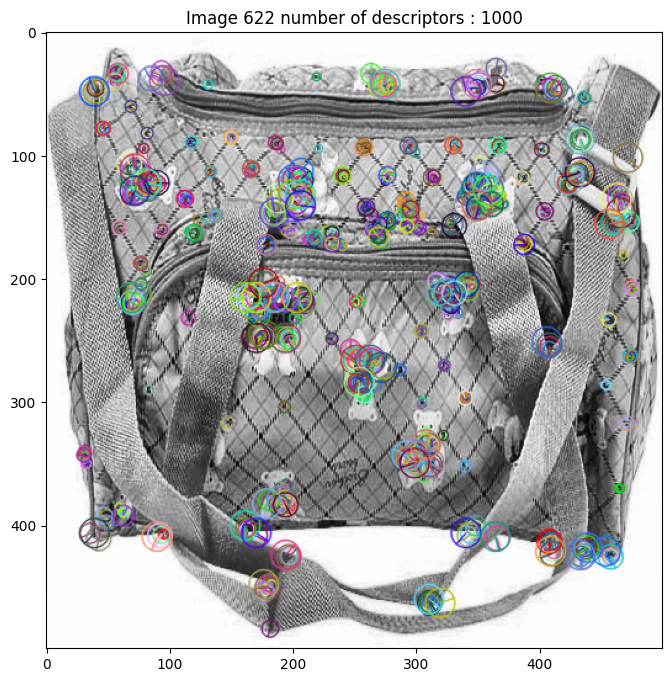

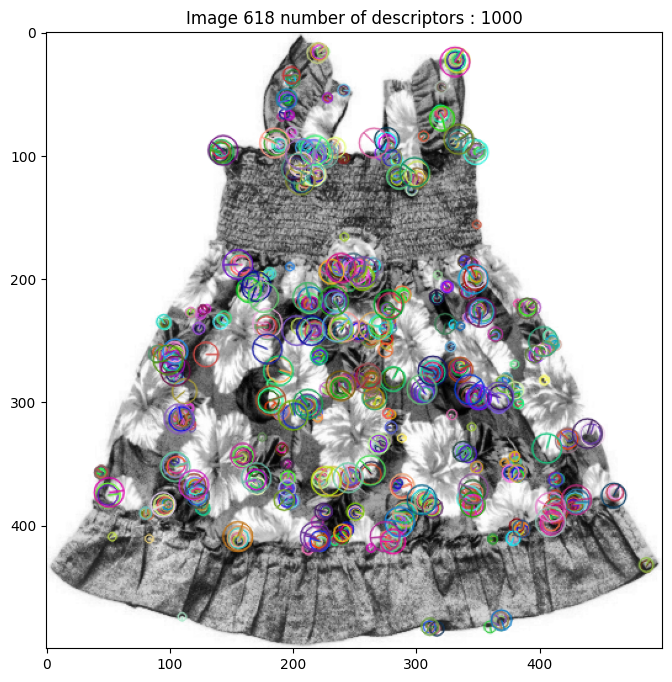

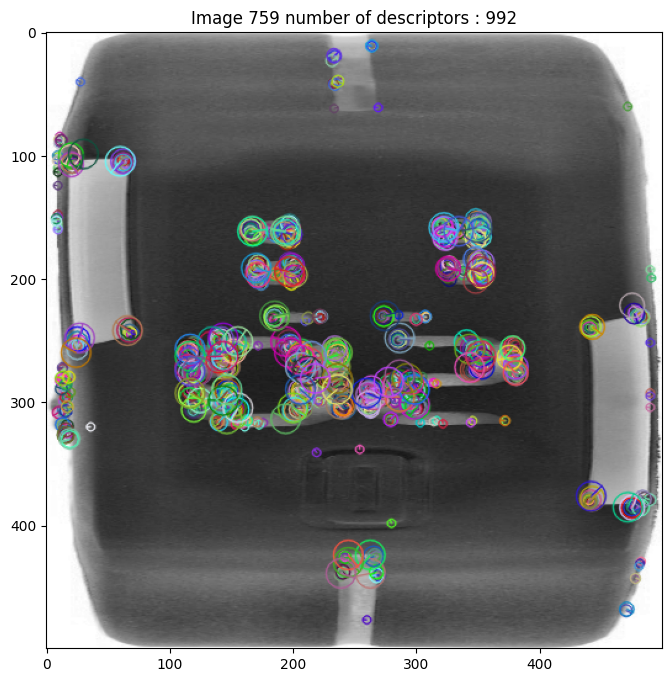

In [78]:
# Random sample of images with their descriptors
samples=data.sample(3)

samples=samples.reset_index()
for index_ in samples['index']:
    kp=keypoints[index_]
    image_full = cv2.imread(path+data.image.iloc[index_],0) # convert in gray
    image = cv2.resize(image_full,dsize=image_size,interpolation= cv2.INTER_LINEAR) # image resize to 331 x 331
    # Contrast Limited Adaptative Histogram Equalization
    clahe=cv2.createCLAHE(clipLimit=2.0,tileGridSize=(8,8))
    image = clahe.apply(image)   # equalize image histogram


    img=cv2.drawKeypoints(image,kp,image,flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)
    plt.figure(figsize=(8,8))
    plt.title('Image {} number of descriptors : {}'.format(index_,len(kp)))
    plt.imshow(img)
    plt.show()

#### Creating visual vocabulary
* Use MiniBatchKMeans to achieve reasonable processing times

In [79]:
from sklearn import cluster, metrics

# Determination number of clusters
temps1=time.time()

k = int(round(np.sqrt(len(descriptors_all)),0))
print("Estimated number of clusters : ", k)
print("Generating",k, "descriptor clusters ...")

# Clustering
kmeans = cluster.MiniBatchKMeans(n_clusters=k, init_size=3*k, random_state=0)
kmeans.fit(descriptors_all)

duration1=time.time()-temps1
print("kmeans processing time : ", "%15.2f" % duration1, "seconds")

Estimated number of clusters :  1017
Generating 1017 descriptor clusters ...
kmeans processing time :            20.35 seconds


#### Attributing visual words
* For each image :
   - prediction of cluster numbers for each descriptor
   - creation of a histogram = count for each cluster number the number of visual words in the image

Image features = Image histogram = Image count of the number of descriptors per cluster

In [80]:
# Creation of histograms (features)
temps1=time.time()

def build_histogram(kmeans, des, image_num):
    res = kmeans.predict(des)
    hist = np.zeros(len(kmeans.cluster_centers_))
    nb_des=len(des)
    if nb_des==0 : print("problème histogramme image  : ", image_num)
    for i in res:
        hist[i] += 1.0/nb_des
    return hist


# Creation of a matrix of histograms
hist_vectors=[]

for i, image_desc in tenumerate(descriptors) :
#     if i%100 == 0 : print(i)
    hist = build_histogram(kmeans, image_desc, i) #calculates the histogram
    hist_vectors.append(hist) #histogram is the feature vector

im_features = np.asarray(hist_vectors)

duration1=time.time()-temps1
print("temps de création histogrammes : ", "%15.2f" % duration1, "secondes")


  0%|          | 0/1050 [00:00<?, ?it/s]

temps de création histogrammes :             7.62 secondes


In [81]:
print(im_features[specific_picture_index])

[0.    0.    0.001 ... 0.002 0.    0.   ]


#### ARI Score

,cluster,effectives
Category,,
Furniture,2,83
Baby,5,165
Watches,0,245
Decor,1,220
Kitchen,3,1
Beauty,4,261
Computers,6,75


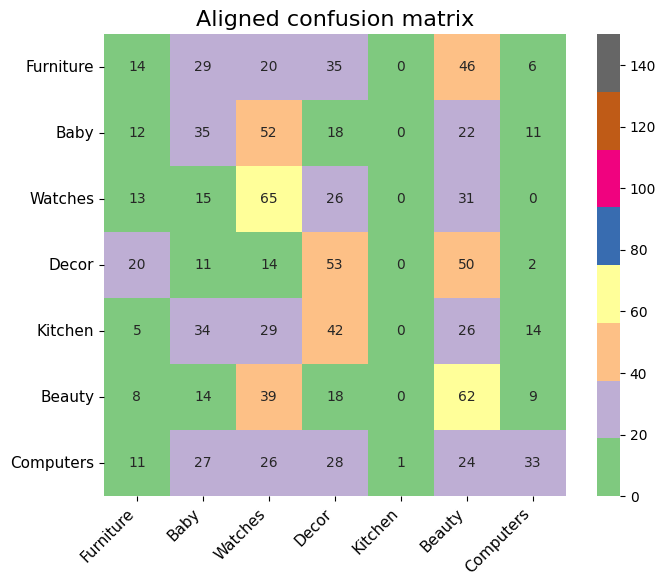

 ARI : 0.033128366840682606
              precision    recall  f1-score   support

   Furniture       0.00      0.00      0.00       150
        Baby       0.21      0.23      0.22       150
     Watches       0.27      0.43      0.33       150
       Decor       0.24      0.49      0.32       150
     Kitchen       0.00      0.00      0.00       150
      Beauty       0.24      0.41      0.30       150
   Computers       0.45      0.23      0.30       150

    accuracy                           0.26      1050
   macro avg       0.20      0.26      0.21      1050
weighted avg       0.20      0.26      0.21      1050

Clustering on description BoVW


In [82]:
# Import KMeans clusterer
from sklearn.cluster import KMeans

kmeans0 = KMeans(n_clusters=len(dico), random_state=42,n_init=30).fit(im_features)
    # Assign clusters
labels=kmeans0.labels_

title='BoVW'
# Evaluate and store metrics results)
append_dict(results1, {'title'   : title,
                     'metrics' : clustering_evaluate(labels, data.cat_code,cat['category'])
                     }
           )
# clustering_evaluate(labels, data.cat_code,cat['index'])
print('Clustering on description '+title)

### Visual Words encoding Strategies

#### BoVW + tfidf

TF-IDF (Term Frequency-Inverse Document Frequency) weights words based on their specificity to documents. It emphasizes distinctive terms while reducing the importance of commonly occurring words across the corpus.\
This technique helps identify characteristic vocabulary for each document category, improving clustering and classification by focusing on truly discriminative features rather than generic terms.





In [83]:
from sklearn.feature_extraction.text import TfidfTransformer
tf_transformer = TfidfTransformer(use_idf=True).fit(im_features)
data_tfidf = tf_transformer.transform(im_features)

In [84]:
type(data_tfidf)

scipy.sparse._csr.csr_matrix

Sparse matrix, densify it for interpretability and saving dataframe.

In [85]:
data_tfidf=data_tfidf.toarray()

In [86]:
data_tfidf.shape

(1050, 1017)

In [87]:
tok=pd.DataFrame(data_tfidf,columns=[ 'T'+str(i) for i in range(data_tfidf.shape[1])])

# joblib.dump(tok, 'FEAT_TFIDF_IMGS')

tok

,T0,T1,T2,T3,T4,T5,T6,T7,T8,T9,...,T1007,T1008,T1009,T1010,T1011,T1012,T1013,T1014,T1015,T1016
0,0.017925,0.035772,0.000000,0.000000,0.022300,0.019393,0.018604,0.019261,0.022502,0.031912,...,0.020979,0.000000,0.039918,0.000000,0.054361,0.000000,0.000000,0.000000,0.019798,0.045896
1,0.019075,0.000000,0.000000,0.043958,0.023731,0.020637,0.039595,0.020497,0.000000,0.000000,...,0.000000,0.016605,0.000000,0.000000,0.038566,0.024747,0.000000,0.000000,0.000000,0.024421
2,0.032290,0.032220,0.000000,0.018603,0.020086,0.017467,0.000000,0.000000,0.000000,0.014372,...,0.018896,0.056218,0.017977,0.090095,0.016321,0.000000,0.000000,0.071908,0.017832,0.000000
3,0.000000,0.097522,0.000000,0.016087,0.000000,0.000000,0.000000,0.030005,0.052582,0.000000,...,0.000000,0.036462,0.015546,0.000000,0.014114,0.018114,0.000000,0.062185,0.015421,0.000000
4,0.018055,0.000000,0.022844,0.041608,0.022463,0.000000,0.093698,0.038803,0.022666,0.096435,...,0.021132,0.000000,0.000000,0.020151,0.000000,0.023425,0.015894,0.000000,0.019942,0.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1045,0.100279,0.000000,0.000000,0.019257,0.000000,0.000000,0.000000,0.000000,0.000000,0.014878,...,0.000000,0.014549,0.018610,0.018653,0.000000,0.065049,0.000000,0.000000,0.036918,0.000000
1046,0.051576,0.034309,0.000000,0.019809,0.042777,0.055799,0.035686,0.018473,0.000000,0.061215,...,0.000000,0.014966,0.019143,0.000000,0.000000,0.000000,0.121068,0.000000,0.018988,0.022010
1047,0.152401,0.016897,0.000000,0.019511,0.000000,0.000000,0.017575,0.018196,0.000000,0.045221,...,0.059458,0.014741,0.018855,0.000000,0.000000,0.043938,0.059624,0.000000,0.000000,0.021679
1048,0.034926,0.052275,0.022094,0.060364,0.043451,0.018893,0.018124,0.000000,0.000000,0.031090,...,0.000000,0.000000,0.019444,0.116939,0.000000,0.000000,0.061488,0.000000,0.019287,0.000000


In [88]:
tok.loc[specific_picture_index]

,458
T0,0.000000
T1,0.000000
T2,0.023769
T3,0.000000
T4,0.000000
...,...
T1012,0.024373
T1013,0.033074
T1014,0.041837
T1015,0.000000


In [89]:
non_zero_series = tok.loc[specific_picture_index][tok.loc[specific_picture_index] != 0]
result_dict = {index: round(value, 4) for index, value in non_zero_series.to_dict().items()}
print(result_dict)

{'T2': 0.0238, 'T5': 0.0203, 'T7': 0.0202, 'T9': 0.0334, 'T11': 0.1125, 'T12': 0.0228, 'T14': 0.0459, 'T15': 0.0326, 'T16': 0.0377, 'T17': 0.0642, 'T18': 0.0389, 'T20': 0.0202, 'T21': 0.0184, 'T22': 0.0208, 'T24': 0.0176, 'T25': 0.0428, 'T26': 0.0677, 'T27': 0.0623, 'T28': 0.0403, 'T29': 0.0229, 'T31': 0.087, 'T32': 0.0192, 'T37': 0.0424, 'T38': 0.0573, 'T39': 0.0172, 'T40': 0.0193, 'T46': 0.0195, 'T47': 0.0642, 'T48': 0.0169, 'T49': 0.0523, 'T50': 0.0752, 'T60': 0.0454, 'T61': 0.0151, 'T62': 0.0218, 'T64': 0.0184, 'T65': 0.0219, 'T69': 0.0433, 'T70': 0.0308, 'T71': 0.0337, 'T72': 0.0553, 'T73': 0.0545, 'T75': 0.024, 'T76': 0.1366, 'T81': 0.0251, 'T82': 0.0221, 'T83': 0.0365, 'T84': 0.0181, 'T85': 0.0548, 'T88': 0.0351, 'T89': 0.0178, 'T90': 0.0261, 'T93': 0.0189, 'T94': 0.1431, 'T96': 0.0196, 'T97': 0.0201, 'T98': 0.0221, 'T100': 0.0467, 'T101': 0.0162, 'T102': 0.023, 'T103': 0.051, 'T105': 0.0238, 'T108': 0.0265, 'T109': 0.0436, 'T110': 0.055, 'T111': 0.0375, 'T113': 0.0221, 'T115': 

,cluster,effectives
Category,,
Furniture,6,177
Baby,4,155
Watches,0,165
Decor,2,89
Kitchen,5,203
Beauty,1,150
Computers,3,111


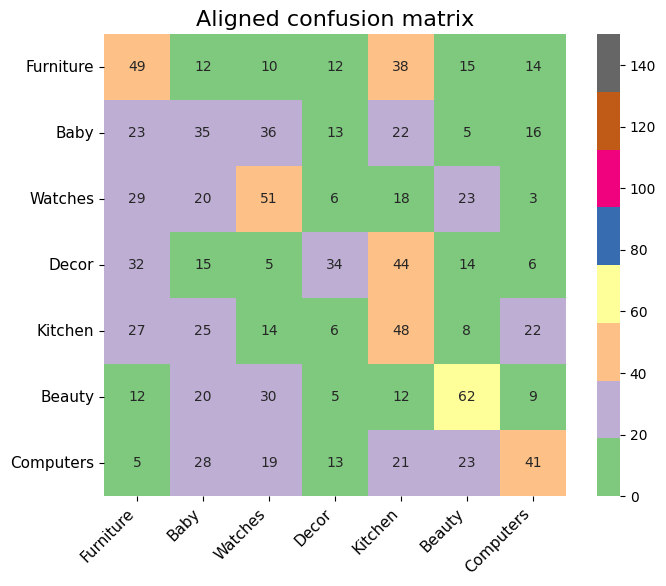

 ARI : 0.05374074613078963
              precision    recall  f1-score   support

   Furniture       0.28      0.33      0.30       150
        Baby       0.23      0.23      0.23       150
     Watches       0.31      0.34      0.32       150
       Decor       0.38      0.23      0.28       150
     Kitchen       0.24      0.32      0.27       150
      Beauty       0.41      0.41      0.41       150
   Computers       0.37      0.27      0.31       150

    accuracy                           0.30      1050
   macro avg       0.32      0.30      0.31      1050
weighted avg       0.32      0.30      0.31      1050

Clustering on BoVW + TFiDF


In [90]:
# Import KMeans clusterer
from sklearn.cluster import KMeans


kmeans1 = KMeans(n_clusters=len(dico), random_state=42,n_init=30).fit(tok)
    # Assign clusters
labels=kmeans1.labels_

title='BoVW + TFiDF'
# Evaluate and store metrics results)
append_dict(results1, {'title'   : title,
                     'metrics' : clustering_evaluate(labels, data.cat_code,cat['category'])
                     }
           )
# clustering_evaluate(labels, data.cat_code,cat['index'])
print('Clustering on '+title)

In [91]:
# Check if the results are the same with a sparse matrix

# Import KMeans clusterer
from sklearn.cluster import KMeans


kmeans1 = KMeans(n_clusters=len(dico), random_state=42,n_init=30).fit(data_tfidf)
    # Assign clusters
labels=kmeans1.labels_
for i in range(0,7):
    print('Cluster {} values count : {}'.format(i, np.count_nonzero(labels == i)))
print(' ARI : {}'.format(adjusted_rand_score(data.cat_code,labels)))


Cluster 0 values count : 165
Cluster 1 values count : 150
Cluster 2 values count : 89
Cluster 3 values count : 111
Cluster 4 values count : 155
Cluster 5 values count : 203
Cluster 6 values count : 177
 ARI : 0.05374074613078963


Same result with sparse matrix.



#### BoVW + LDA

Unlike TF-IDF which represents documents by the relative importance of words, LDA (Latent Dirichlet Allocation) takes a thematic approach. This probabilistic generative model decomposes each document into a mixture of latent topics and each topic into a distribution of words. It captures the hidden semantic structure of documents by automatically identifying recurring themes and their associations. In our product description context, LDA can reveal more abstract conceptual groupings beyond simple keywords, potentially aligned with product categories.\
LDA is a pure statistic algorithm and does not use LLM.

,cluster,effectives
Category,,
Furniture,0,83
Baby,6,21
Watches,2,239
Decor,3,225
Kitchen,1,213
Beauty,5,174
Computers,4,95


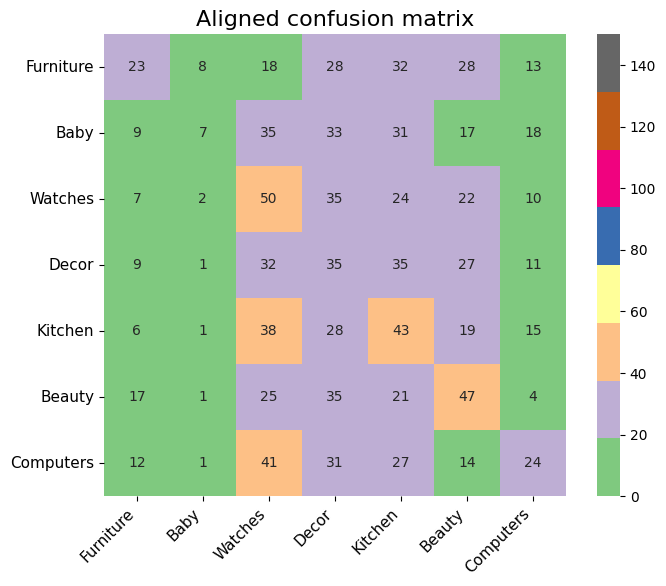

 ARI : 0.010453366998328373
              precision    recall  f1-score   support

   Furniture       0.30      0.21      0.24       150
        Baby       0.00      0.00      0.00       150
     Watches       0.18      0.57      0.28       150
       Decor       0.00      0.00      0.00       150
     Kitchen       0.20      0.29      0.24       150
      Beauty       0.27      0.31      0.29       150
   Computers       0.25      0.16      0.20       150

    accuracy                           0.22      1050
   macro avg       0.17      0.22      0.18      1050
weighted avg       0.17      0.22      0.18      1050

Clustering sur BoVW + LatentDirichletAllocation
Clustering sur BoVW + LatentDirichletAllocation


In [92]:
from sklearn.decomposition import LatentDirichletAllocation
tok_lda = LatentDirichletAllocation(n_components=8,random_state=42,n_jobs=-1).fit_transform(im_features)

# Import KMeans clusterer
from sklearn.cluster import KMeans


kmeans2 = KMeans(n_clusters=len(dico), random_state=42,n_init=30).fit(tok_lda)
    # Assign clusters
labels=kmeans2.labels_

title='BoVW + LatentDirichletAllocation'
# Evaluate and store metrics results)
append_dict(results1, {'title'   : title,
                     'metrics' : clustering_evaluate(labels, data.cat_code,cat['category'])
                     }
           )
# clustering_evaluate(labels, data.cat_code,cat['index'])
print('Clustering sur '+title)
print('Clustering sur BoVW + LatentDirichletAllocation' )


In [93]:
tok_lda[specific_picture_index]

array([0.06250056, 0.56249606, 0.06250056, 0.06250056, 0.06250056,
       0.06250056, 0.06250056, 0.06250056])

### Projections

#### PCA

* **Linear space transformation**: PCA projects data into a new coordinate system defined by orthogonal directions of maximum variance
* **Dimensionality optimization**: Reduces feature redundancy by identifying and preserving only the most informative dimensions
* **Noise reduction effect**: Lower-ranked components often capture noise, so eliminating them increases signal-to-noise ratio
* **Global pattern prioritization**: Emphasizes broad patterns that explain the largest sources of variation across documents
* **Feature correlation resolution**: Addresses multicollinearity by creating uncorrelated components from correlated original features
* **Variance-based information retention**: Provides clear metrics on how much information (variance) is preserved in the reduced space

Overall, PCA gives the same (weak) ARI scores for both encoding strategies. It also worsened ARI score for BoVW only.


##### BoVW + PCA

,cluster,effectives
Category,,
Furniture,4,250
Baby,1,148
Watches,6,167
Decor,2,158
Kitchen,5,97
Beauty,0,214
Computers,3,16


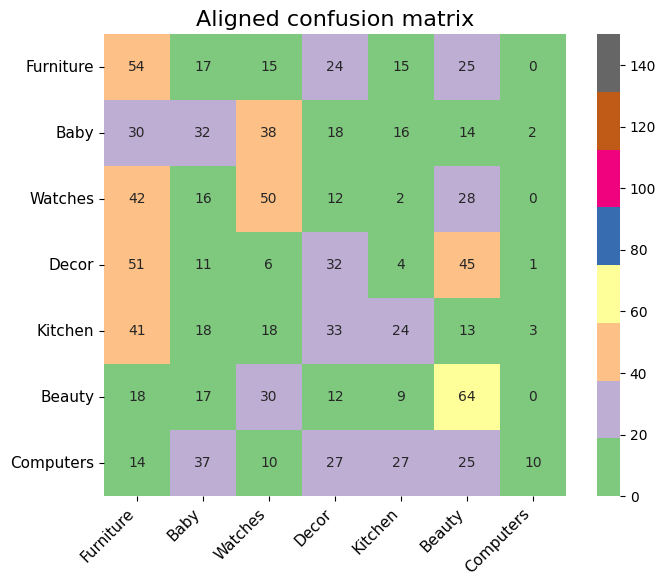

 ARI : 0.03990527546115413
              precision    recall  f1-score   support

   Furniture       0.22      0.36      0.27       150
        Baby       0.00      0.00      0.00       150
     Watches       0.30      0.33      0.32       150
       Decor       0.00      0.00      0.00       150
     Kitchen       0.21      0.22      0.21       150
      Beauty       0.30      0.43      0.35       150
   Computers       0.28      0.49      0.36       150

    accuracy                           0.26      1050
   macro avg       0.19      0.26      0.22      1050
weighted avg       0.19      0.26      0.22      1050

Clustering on BoVW + PCA (2 components, 17.76% explained variance)


In [ ]:
from sklearn.decomposition import PCA
from sklearn.cluster import KMeans

# Create full PCA model to calculate explained variance
pca_full = PCA(random_state=42)
pca_full.fit(im_features)

# Calculate cumulative variance explained by the first 2 components
explained_variance_ratio = pca_full.explained_variance_ratio_
cumulative_variance = explained_variance_ratio.cumsum()
variance_2_components = cumulative_variance[1] * 100

# Apply PCA with 2 components for dimensionality reduction
pca = PCA(n_components=2, random_state=42)
bovw_pca = pca.fit_transform(im_features)

# K-Means clustering on reduced data
kmeans2 = KMeans(n_clusters=len(dico), random_state=42, n_init=30).fit(bovw_pca)
labels = kmeans2.labels_

# Title including explained variance
title = f'BoVW + PCA (2 components, {variance_2_components:.2f}% explained variance)'

# Evaluate and store metrics results
append_dict(results1, {
    'title': title,
    'metrics': clustering_evaluate(labels, data.cat_code, cat['category'])
})

# Display clustering results
print(f'Clustering on {title}')


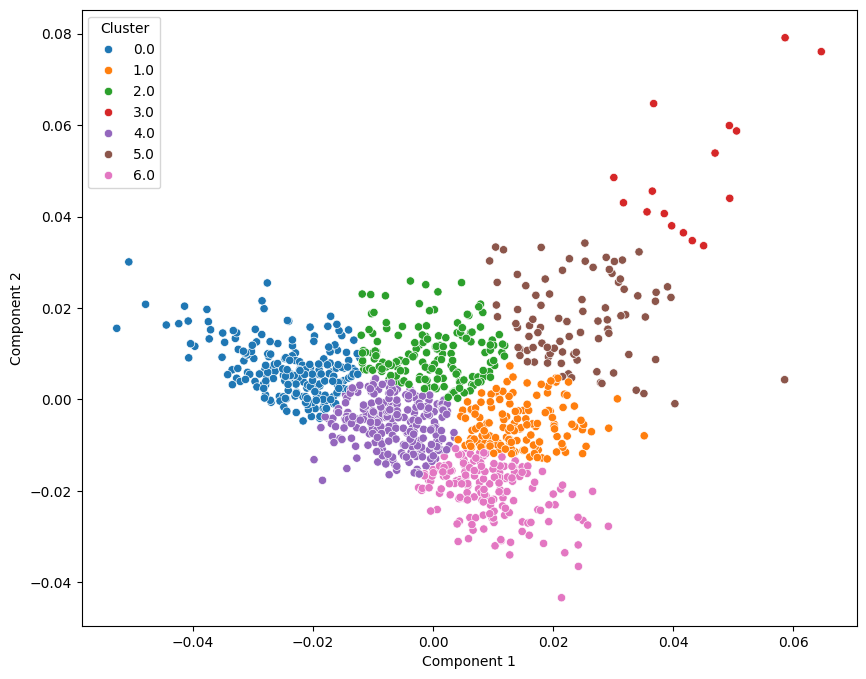

<Figure size 1000x800 with 0 Axes>

In [ ]:
plot_clusters(bovw_pca,labels)

##### BoVW + tfidf + PCA

,cluster,effectives
Category,,
Furniture,5,175
Baby,1,150
Watches,4,170
Decor,0,114
Kitchen,2,145
Beauty,6,174
Computers,3,122


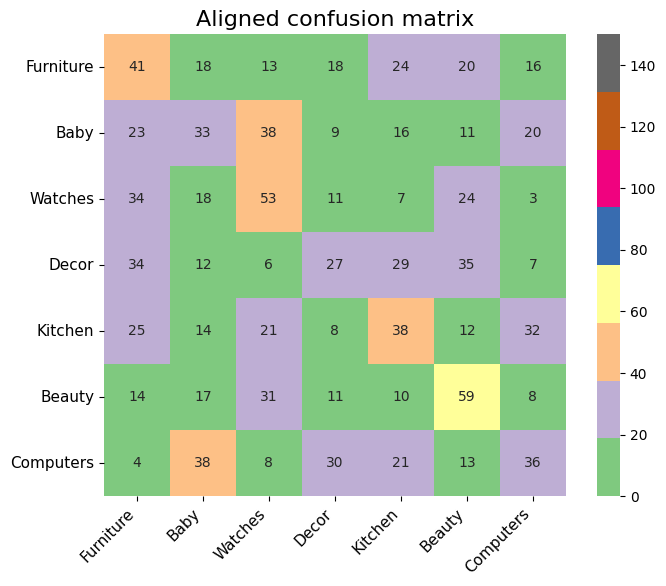

 ARI : 0.04836017074191287
              precision    recall  f1-score   support

   Furniture       0.23      0.27      0.25       150
        Baby       0.00      0.00      0.00       150
     Watches       0.31      0.35      0.33       150
       Decor       0.00      0.00      0.00       150
     Kitchen       0.26      0.25      0.26       150
      Beauty       0.34      0.39      0.36       150
   Computers       0.27      0.69      0.39       150

    accuracy                           0.28      1050
   macro avg       0.20      0.28      0.23      1050
weighted avg       0.20      0.28      0.23      1050

Clustering on BoVW + TFiDF + PCA (2 components, 15.35% explained variance)


In [ ]:
from sklearn.decomposition import PCA
from sklearn.cluster import KMeans

# Create full PCA model to calculate explained variance
pca_full = PCA(random_state=42)
pca_full.fit(tok)

# Calculate cumulative variance explained by the first 2 components
explained_variance_ratio = pca_full.explained_variance_ratio_
cumulative_variance = explained_variance_ratio.cumsum()
variance_2_components = cumulative_variance[1] * 100

# Apply PCA with 2 components for dimensionality reduction
pca = PCA(n_components=2, random_state=42)
tok_pca = pca.fit_transform(tok)

# K-Means clustering on reduced data
kmeans2 = KMeans(n_clusters=len(dico), random_state=42, n_init=30).fit(tok_pca)
labels = kmeans2.labels_

# Title including explained variance
title = f'BoVW + TFiDF + PCA (2 components, {variance_2_components:.2f}% explained variance)'

# Evaluate and store metrics results
append_dict(results1, {
    'title': title,
    'metrics': clustering_evaluate(labels, data.cat_code, cat['category'])
})

# Display clustering results
print(f'Clustering on {title}')


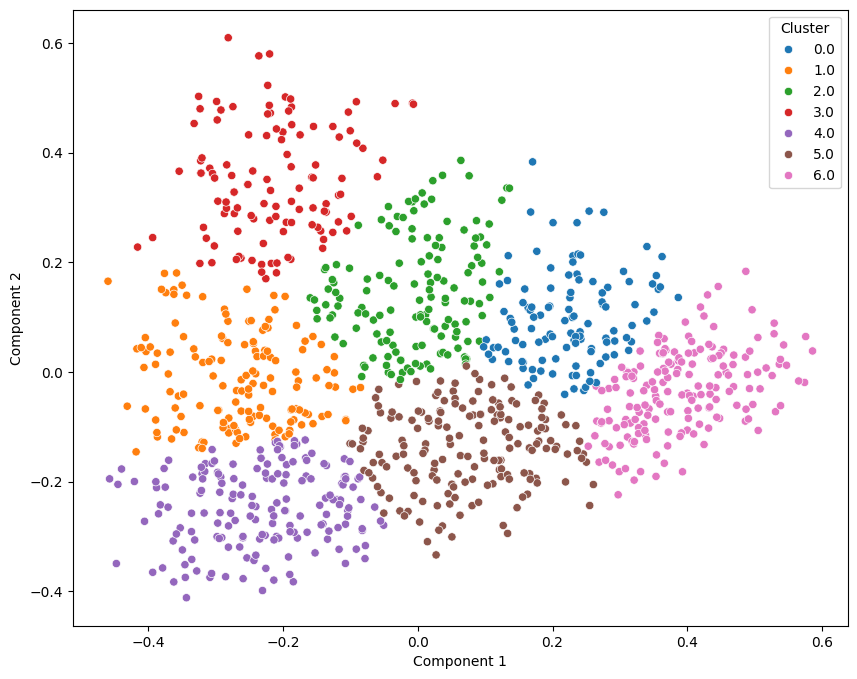

<Figure size 1000x800 with 0 Axes>

In [ ]:
plot_clusters(tok_pca,labels)

##### BoVW + LDA + PCA

,cluster,effectives
Category,,
Furniture,0,83
Baby,6,21
Watches,2,239
Decor,3,225
Kitchen,1,213
Beauty,5,174
Computers,4,95


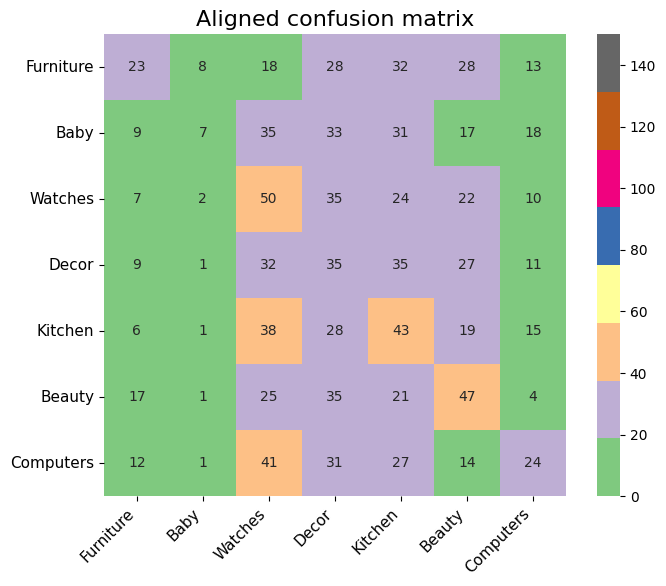

 ARI : 0.010453366998328373
              precision    recall  f1-score   support

   Furniture       0.30      0.21      0.24       150
        Baby       0.00      0.00      0.00       150
     Watches       0.18      0.57      0.28       150
       Decor       0.00      0.00      0.00       150
     Kitchen       0.20      0.29      0.24       150
      Beauty       0.27      0.31      0.29       150
   Computers       0.25      0.16      0.20       150

    accuracy                           0.22      1050
   macro avg       0.17      0.22      0.18      1050
weighted avg       0.17      0.22      0.18      1050

Clustering on BoVW + LDA + PCA (2 components, 100.00% explained variance)


In [ ]:
from sklearn.decomposition import PCA
from sklearn.cluster import KMeans

# Create full PCA model to calculate explained variance
pca_full = PCA(random_state=42)
pca_full.fit(tok_lda)

# Calculate cumulative variance explained by the first 2 components
explained_variance_ratio = pca_full.explained_variance_ratio_
cumulative_variance = explained_variance_ratio.cumsum()
variance_2_components = cumulative_variance[1] * 100

# Apply PCA with 2 components for dimensionality reduction
pca = PCA(n_components=2, random_state=42)
tok_pca = pca.fit_transform(tok_lda)

# K-Means clustering on reduced data
kmeans2 = KMeans(n_clusters=len(dico), random_state=42, n_init=30).fit(tok_pca)
labels = kmeans2.labels_

# Title including explained variance
title = f'BoVW + LDA + PCA (2 components, {variance_2_components:.2f}% explained variance)'

# Evaluate and store metrics results
append_dict(results1, {
    'title': title,
    'metrics': clustering_evaluate(labels, data.cat_code, cat['category'])
})

# Display clustering results
print(f'Clustering on {title}')


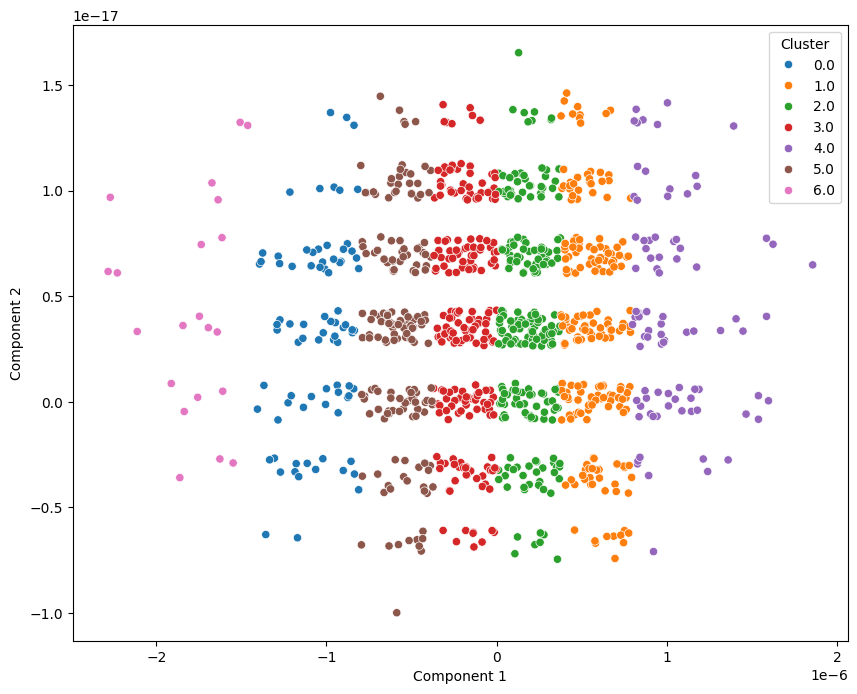

<Figure size 1000x800 with 0 Axes>

In [ ]:
plot_clusters(tok_pca,labels)

#### TSNE

* **Optimized spatial reorganization**: t-SNE transforms the vector space by preserving local similarities while amplifying differences between distinct groups
* **Curse of dimensionality mitigation**: Addresses the "curse of dimensionality" problem that affects high-dimensional TF-IDF vectors, where distance metrics become less meaningful
* **Adaptation to textual complexity**: Unlike linear methods, t-SNE adapts to complex and non-linear structures present in textual data
* **Dimensional noise elimination**: Reduction to 2D eliminates non-relevant dimensions that hindered K-means performance in the original sparse vector space
* **Enhancement of natural boundaries**: The transformation accentuates natural separations between categories, considerably facilitating the clustering algorithm's task

It is interesting to see that using TSNE projection helps having a better ARI score for BoVW only and TFiDF strategies.

##### BoVW + TSNE

,cluster,effectives
Category,,
Furniture,4,157
Baby,3,133
Watches,0,159
Decor,5,133
Kitchen,2,177
Beauty,1,146
Computers,6,145


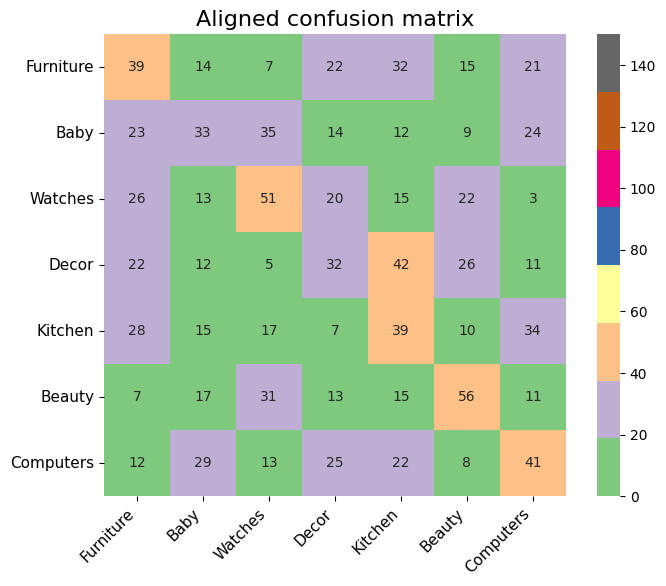

 ARI : 0.0458744659353362
              precision    recall  f1-score   support

   Furniture       0.25      0.26      0.25       150
        Baby       0.25      0.22      0.23       150
     Watches       0.32      0.34      0.33       150
       Decor       0.24      0.49      0.32       150
     Kitchen       0.00      0.00      0.00       150
      Beauty       0.38      0.37      0.38       150
   Computers       0.28      0.27      0.28       150

    accuracy                           0.28      1050
   macro avg       0.25      0.28      0.26      1050
weighted avg       0.25      0.28      0.26      1050

Clustering on BoVW + T-SNE 2 components


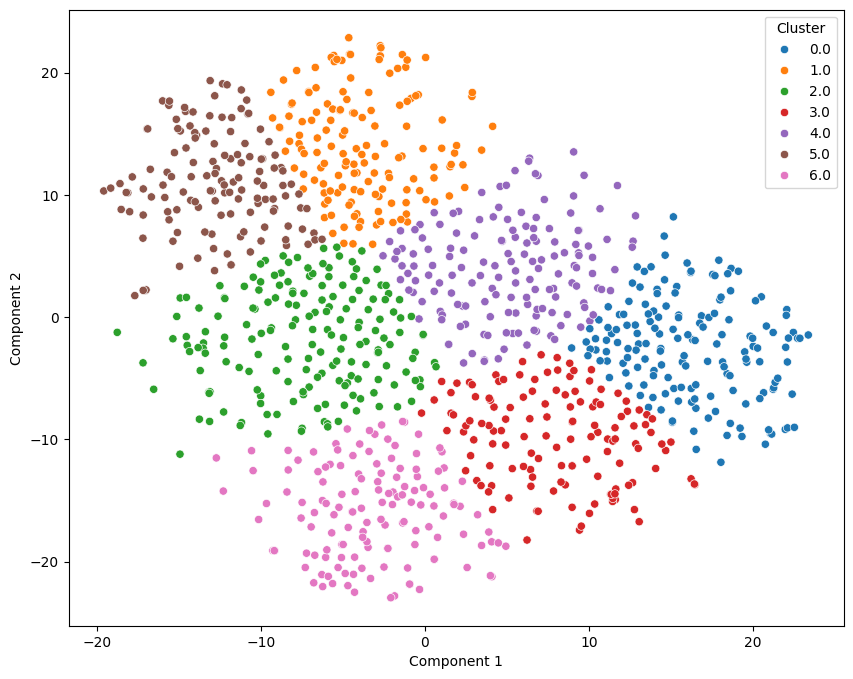

<Figure size 1000x800 with 0 Axes>

In [ ]:
from sklearn.manifold import TSNE
# tok variable comes from the countvectorizer + tfidf section
bovw_tsne = TSNE(n_components=2,
                perplexity=50,
                early_exaggeration=12.0,
                learning_rate=200.0,
                max_iter=1000,
                n_iter_without_progress=300,
                min_grad_norm=1e-07,
                metric='euclidean',
                init='random',   # pca
                verbose=0,
                random_state=42,
                method='barnes_hut',   # exact
                angle=0.2,
                n_jobs=-1
               ).fit_transform(im_features)

# Import KMeans clusterer
from sklearn.cluster import KMeans


kmeans2 = KMeans(n_clusters=len(dico), random_state=42,n_init=30).fit(bovw_tsne)
    # Assign clusters
labels=kmeans2.labels_

title='BoVW + T-SNE 2 components'
# Evaluate and store metrics results)
append_dict(results1, {'title'   : title,
                     'metrics' : clustering_evaluate(labels, data.cat_code,cat['category'])
                     }
           )
# clustering_evaluate(labels, data.cat_code,cat['index'])
print('Clustering on '+title)

plot_clusters(bovw_tsne,labels)

##### BoVW + tfidf + TSNE

,cluster,effectives
Category,,
Furniture,5,124
Baby,3,147
Watches,0,144
Decor,4,163
Kitchen,2,181
Beauty,6,133
Computers,1,158


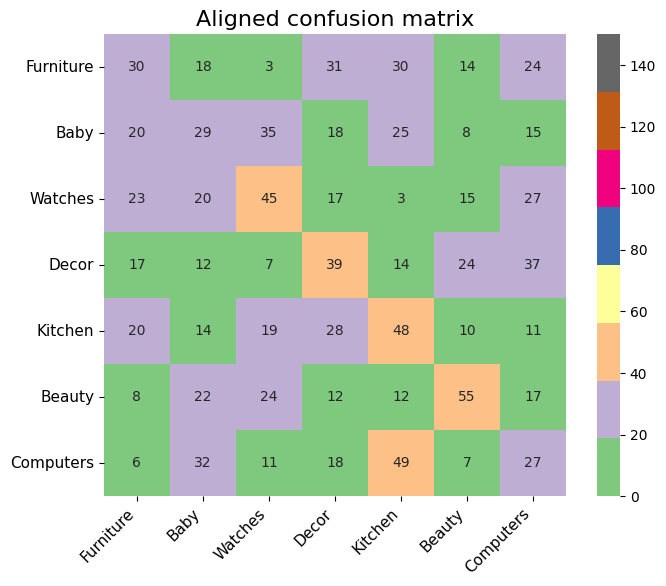

 ARI : 0.04451876129480414
              precision    recall  f1-score   support

   Furniture       0.24      0.20      0.22       150
        Baby       0.00      0.00      0.00       150
     Watches       0.31      0.30      0.31       150
       Decor       0.24      0.51      0.32       150
     Kitchen       0.00      0.00      0.00       150
      Beauty       0.41      0.37      0.39       150
   Computers       0.25      0.54      0.34       150

    accuracy                           0.27      1050
   macro avg       0.21      0.27      0.23      1050
weighted avg       0.21      0.27      0.23      1050

Clustering on BoVW + TFiDF + T-SNE 2 components


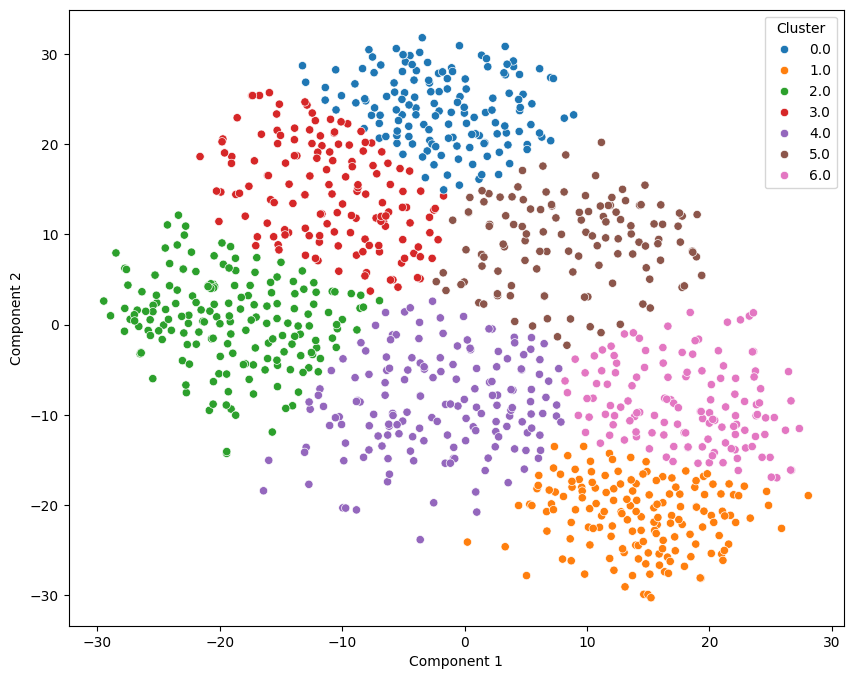

<Figure size 1000x800 with 0 Axes>

In [ ]:
from sklearn.manifold import TSNE
# tok variable comes from the countvectorizer + tfidf section
tok_tsne = TSNE(n_components=2,
                perplexity=50,
                early_exaggeration=12.0,
                learning_rate=200.0,
                max_iter=1000,
                n_iter_without_progress=300,
                min_grad_norm=1e-07,
                metric='euclidean',
                init='random',   # pca
                verbose=0,
                random_state=42,
                method='barnes_hut',   # exact
                angle=0.2,
                n_jobs=-1
               ).fit_transform(tok)

# Import KMeans clusterer
from sklearn.cluster import KMeans


kmeans2 = KMeans(n_clusters=len(dico), random_state=42,n_init=30).fit(tok_tsne)
    # Assign clusters
labels=kmeans2.labels_

title='BoVW + TFiDF + T-SNE 2 components'
# Evaluate and store metrics results)
append_dict(results1, {'title'   : title,
                     'metrics' : clustering_evaluate(labels, data.cat_code,cat['category'])
                     }
           )
# clustering_evaluate(labels, data.cat_code,cat['index'])
print('Clustering on '+title)

plot_clusters(tok_tsne,labels)

##### BoVW + LDA +TSNE

,cluster,effectives
Category,,
Furniture,0,136
Baby,6,154
Watches,1,147
Decor,3,159
Kitchen,2,149
Beauty,4,145
Computers,5,160


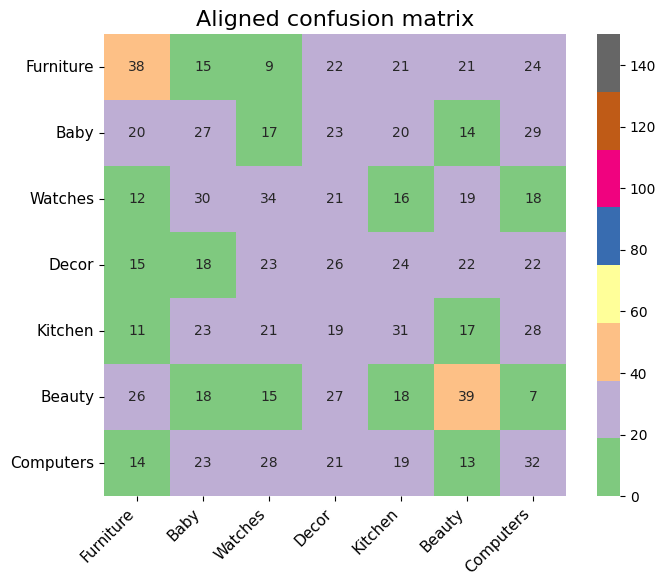

 ARI : 0.01087238844475331
              precision    recall  f1-score   support

   Furniture       0.28      0.25      0.27       150
        Baby       0.00      0.00      0.00       150
     Watches       0.21      0.43      0.28       150
       Decor       0.00      0.00      0.00       150
     Kitchen       0.21      0.21      0.21       150
      Beauty       0.22      0.44      0.29       150
   Computers       0.20      0.21      0.21       150

    accuracy                           0.22      1050
   macro avg       0.16      0.22      0.18      1050
weighted avg       0.16      0.22      0.18      1050

Clustering on BoVW + LDA + T-SNE 2 components


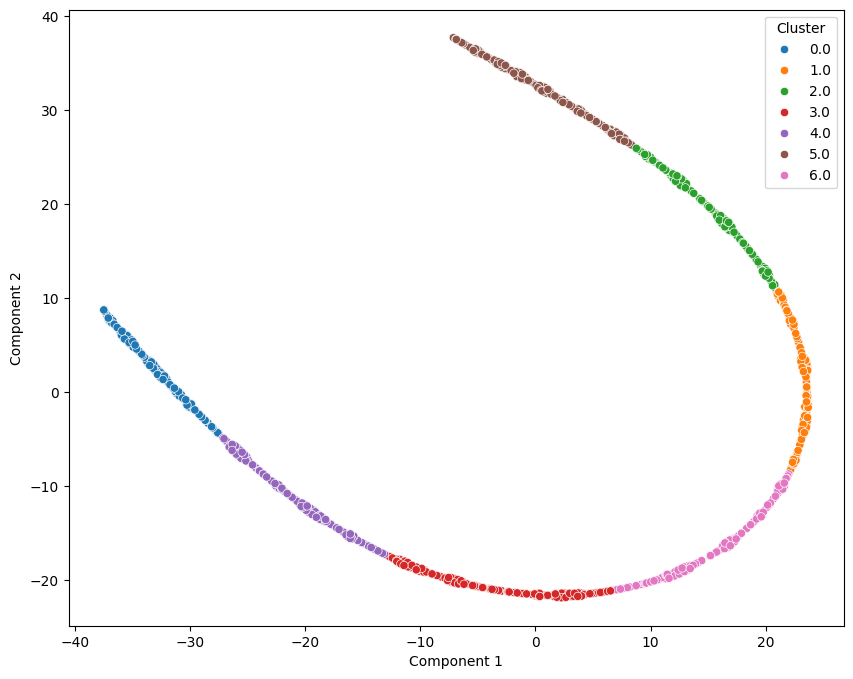

<Figure size 1000x800 with 0 Axes>

In [ ]:
from sklearn.manifold import TSNE
# tok variable comes from the countvectorizer + tfidf section
tok_tsne = TSNE(n_components=2,
                perplexity=50,
                early_exaggeration=12.0,
                learning_rate=200.0,
                max_iter=1000,
                n_iter_without_progress=300,
                min_grad_norm=1e-07,
                metric='euclidean',
                init='random',   # pca
                verbose=0,
                random_state=42,
                method='barnes_hut',   # exact
                angle=0.2,
                n_jobs=-1
               ).fit_transform(tok_lda)

# Import KMeans clusterer
from sklearn.cluster import KMeans


kmeans2 = KMeans(n_clusters=len(dico), random_state=42,n_init=30).fit(tok_tsne)
    # Assign clusters
labels=kmeans2.labels_

title='BoVW + LDA + T-SNE 2 components'
# Evaluate and store metrics results)
append_dict(results1, {'title'   : title,
                     'metrics' : clustering_evaluate(labels, data.cat_code,cat['category'])
                     }
           )
# clustering_evaluate(labels, data.cat_code,cat['index'])
print('Clustering on '+title)

plot_clusters(tok_tsne,labels)

#### MDS

* **Distance preservation focus**: Maintains pairwise distances between documents in lower-dimensional space
* **Global relationship retention**: Preserves overall structure of document relationships
* **Similarity visualization**: Transforms abstract similarities into interpretable spatial relationships
* **Stress minimization**: Optimizes projection by minimizing distortion in distance representation
* **Metric integrity**: Provides faithful representation of original document dissimilarities
* **Euclidean interpretation**: Projected distances correspond meaningfully to original feature differences

Interesting to see that the MDS projection gives better results coupled with LDA approach (compared to TFIDF). The best ARI score is for the BoVW only strategy.

##### BoVW + MDS

,cluster,effectives
Category,,
Furniture,4,163
Baby,3,138
Watches,1,167
Decor,0,188
Kitchen,5,99
Beauty,6,168
Computers,2,127


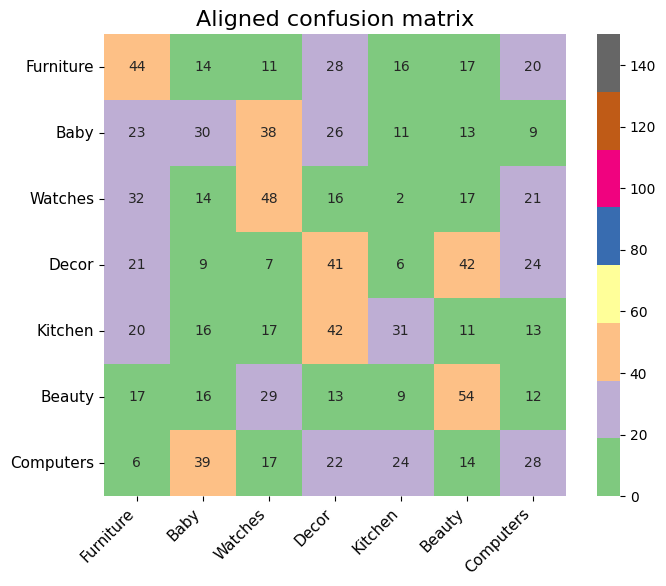

 ARI : 0.04062227090664432
              precision    recall  f1-score   support

   Furniture       0.27      0.29      0.28       150
        Baby       0.00      0.00      0.00       150
     Watches       0.29      0.32      0.30       150
       Decor       0.00      0.00      0.00       150
     Kitchen       0.25      0.49      0.33       150
      Beauty       0.32      0.36      0.34       150
   Computers       0.25      0.45      0.32       150

    accuracy                           0.27      1050
   macro avg       0.20      0.27      0.23      1050
weighted avg       0.20      0.27      0.23      1050

Clustering on BoVW + MDS 2 components


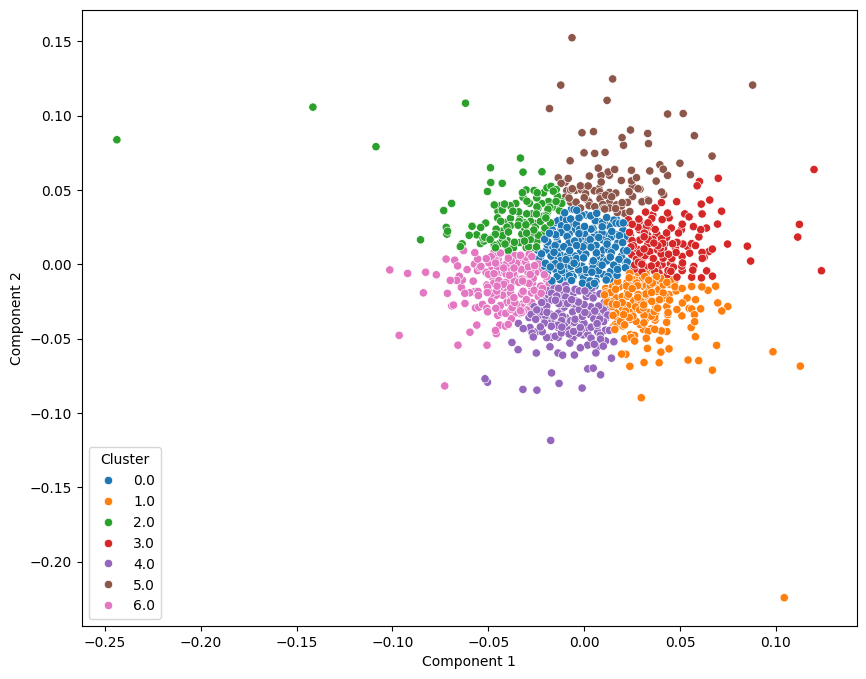

<Figure size 1000x800 with 0 Axes>

In [ ]:
from sklearn.manifold import MDS
bovw_mds = MDS(n_components=2,
              metric=True,
              n_init=4,
              max_iter=300,
              verbose=0,
              eps=0.001,
              n_jobs=-1,
              random_state=42,

             ).fit_transform(im_features)

# Import KMeans clusterer
from sklearn.cluster import KMeans


kmeans3 = KMeans(n_clusters=len(dico), random_state=42,n_init=30).fit(bovw_mds)
    # Assign clusters
labels=kmeans3.labels_

title='BoVW + MDS 2 components'
# Evaluate and store metrics results)
append_dict(results1, {'title'   : title,
                     'metrics' : clustering_evaluate(labels, data.cat_code,cat['category'])
                     }
           )
# clustering_evaluate(labels, data.cat_code,cat['index'])
print('Clustering on '+title)

plot_clusters(bovw_mds,labels)

##### BoVW + tfidf + MDS

,cluster,effectives
Category,,
Furniture,0,151
Baby,3,162
Watches,6,154
Decor,5,113
Kitchen,1,163
Beauty,4,155
Computers,2,152


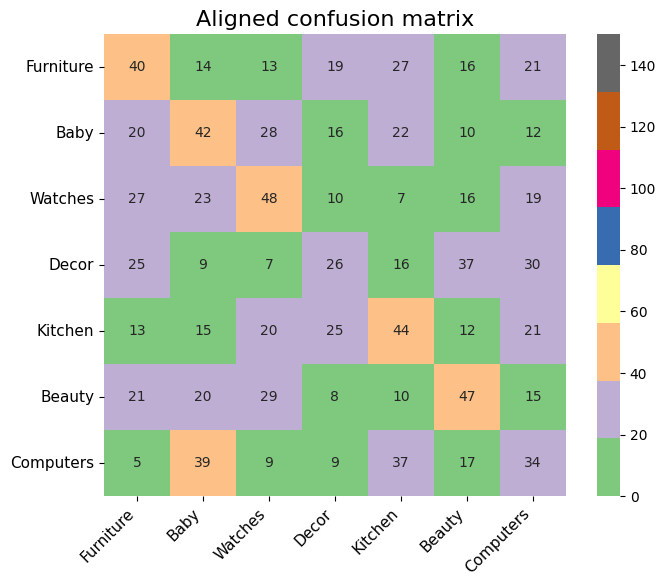

 ARI : 0.03850596827810939
              precision    recall  f1-score   support

   Furniture       0.26      0.27      0.27       150
        Baby       0.26      0.28      0.27       150
     Watches       0.31      0.32      0.32       150
       Decor       0.23      0.17      0.20       150
     Kitchen       0.27      0.29      0.28       150
      Beauty       0.30      0.31      0.31       150
   Computers       0.22      0.23      0.23       150

    accuracy                           0.27      1050
   macro avg       0.27      0.27      0.27      1050
weighted avg       0.27      0.27      0.27      1050

Clustering on BoVW + TFiDF + MDS 2 components


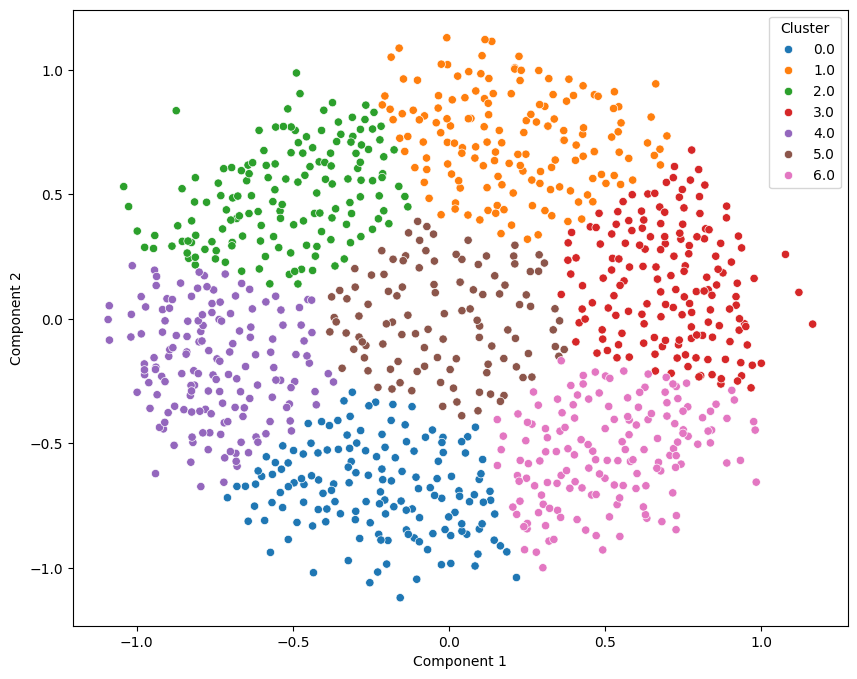

<Figure size 1000x800 with 0 Axes>

In [ ]:
from sklearn.manifold import MDS
tok_mds = MDS(n_components=2,
              metric=True,
              n_init=4,
              max_iter=300,
              verbose=0,
              eps=0.001,
              n_jobs=-1,
              random_state=42,

             ).fit_transform(tok)

# Import KMeans clusterer
from sklearn.cluster import KMeans


kmeans3 = KMeans(n_clusters=len(dico), random_state=42,n_init=30).fit(tok_mds)
    # Assign clusters
labels=kmeans3.labels_

title='BoVW + TFiDF + MDS 2 components'
# Evaluate and store metrics results)
append_dict(results1, {'title'   : title,
                     'metrics' : clustering_evaluate(labels, data.cat_code,cat['category'])
                     }
           )
# clustering_evaluate(labels, data.cat_code,cat['index'])
print('Clustering on '+title)

plot_clusters(tok_mds,labels)

##### BoVW + LDA + MDS

,cluster,effectives
Category,,
Furniture,2,73
Baby,5,49
Watches,0,309
Decor,4,242
Kitchen,3,34
Beauty,1,270
Computers,6,73


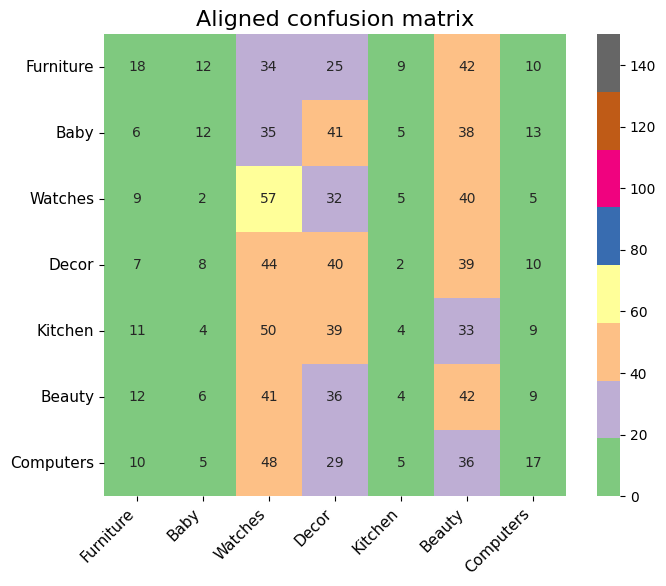

 ARI : 0.0017467144948247098
              precision    recall  f1-score   support

   Furniture       0.19      0.54      0.28       150
        Baby       0.17      0.27      0.21       150
     Watches       0.18      0.38      0.25       150
       Decor       0.00      0.00      0.00       150
     Kitchen       0.00      0.00      0.00       150
      Beauty       0.00      0.00      0.00       150
   Computers       0.23      0.11      0.15       150

    accuracy                           0.19      1050
   macro avg       0.11      0.19      0.13      1050
weighted avg       0.11      0.19      0.13      1050

Clustering on BoVW + LDA + MDS 2 components


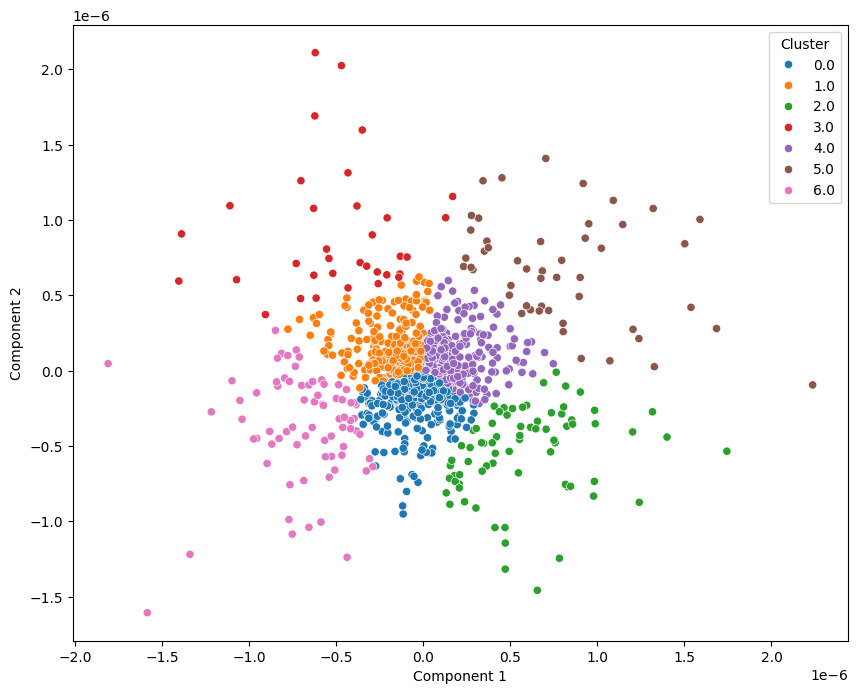

<Figure size 1000x800 with 0 Axes>

In [ ]:
from sklearn.manifold import MDS
tok_mds = MDS(n_components=2,
              metric=True,
              n_init=4,
              max_iter=300,
              verbose=0,
              eps=0.001,
              n_jobs=-1,
              random_state=42,

             ).fit_transform(tok_lda)

# Import KMeans clusterer
from sklearn.cluster import KMeans


kmeans3 = KMeans(n_clusters=len(dico), random_state=42,n_init=30).fit(tok_mds)
    # Assign clusters
labels=kmeans3.labels_

title='BoVW + LDA + MDS 2 components'
# Evaluate and store metrics results)
append_dict(results1, {'title'   : title,
                     'metrics' : clustering_evaluate(labels, data.cat_code,cat['category'])
                     }
           )
# clustering_evaluate(labels, data.cat_code,cat['index'])
print('Clustering on '+title)

plot_clusters(tok_mds,labels)

#### SpectralEmbedding

* **Graph-based approach**: Leverages connectivity patterns between documents for dimensionality reduction
* **Non-linear manifold learning**: Captures intrinsic geometric structure of the document space
* **Eigenvector foundation**: Uses the most significant eigenvectors of the graph Laplacian matrix
* **Community detection strength**: Excels at revealing natural groupings and thematic communities
* **Connectivity preservation**: Maintains connected components from the high-dimensional space
* **Local-to-global mapping**: Builds global representation from local neighborhood information

On spectral projection, TFIDF gives better results than LDA. BoVW only ARI score is also falling.

##### BoVW + spectral

,cluster,effectives
Category,,
Furniture,2,111
Baby,0,103
Watches,3,202
Decor,5,208
Kitchen,6,119
Beauty,1,223
Computers,4,84


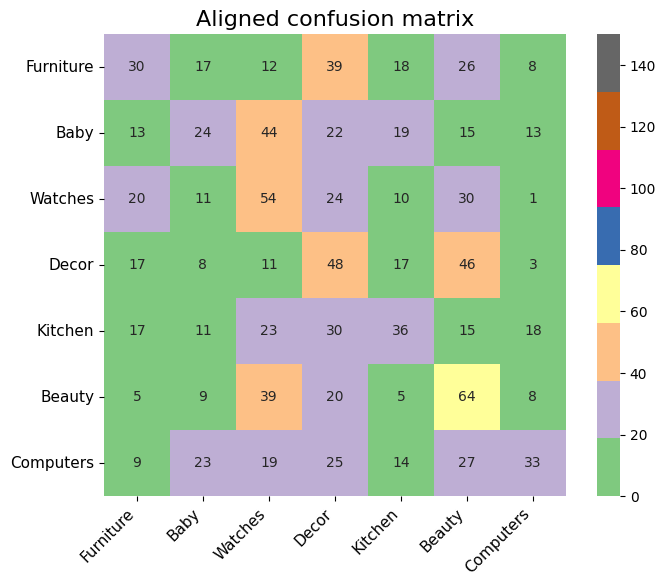

 ARI : 0.03796624880199059
              precision    recall  f1-score   support

   Furniture       0.27      0.20      0.23       150
        Baby       0.23      0.16      0.19       150
     Watches       0.27      0.36      0.31       150
       Decor       0.23      0.32      0.27       150
     Kitchen       0.30      0.24      0.27       150
      Beauty       0.29      0.43      0.34       150
   Computers       0.39      0.22      0.28       150

    accuracy                           0.28      1050
   macro avg       0.28      0.28      0.27      1050
weighted avg       0.28      0.28      0.27      1050

Clustering on BoVW + Spectral 2 components


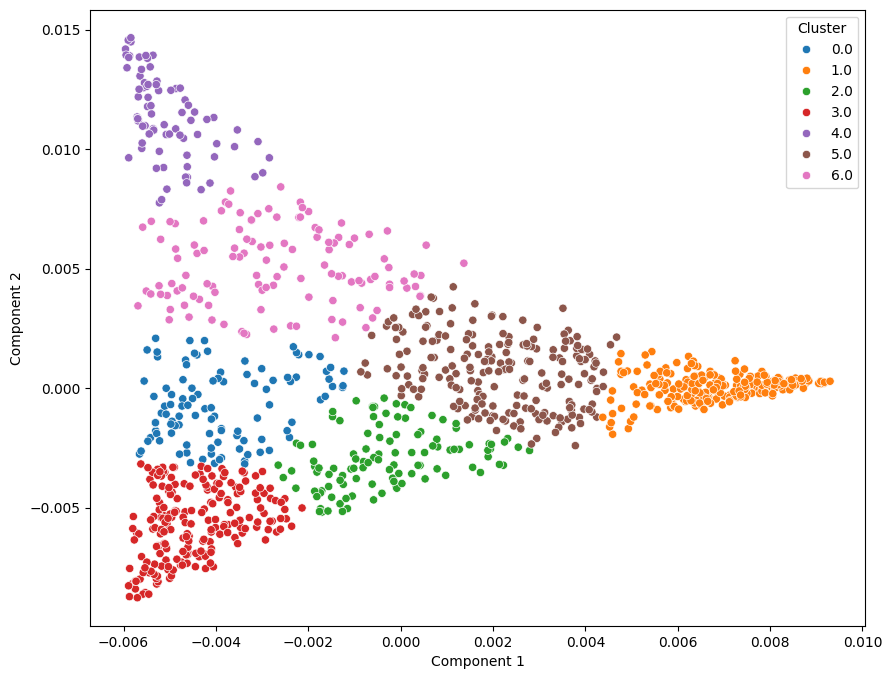

<Figure size 1000x800 with 0 Axes>

In [ ]:
from sklearn.manifold import SpectralEmbedding
bovw_spec = SpectralEmbedding(n_components=2,
                             affinity='nearest_neighbors', # rbf
                             gamma=None,
                             random_state=42,
                             eigen_solver=None, # arpack lobpcg amg
                             n_neighbors=50,
                             n_jobs=-1
                            ).fit_transform(im_features)

# Import KMeans clusterer
from sklearn.cluster import KMeans


kmeans4 = KMeans(n_clusters=len(dico), random_state=42,n_init=30).fit(bovw_spec)
    # Assign clusters
labels=kmeans4.labels_

title='BoVW + Spectral 2 components'
# Evaluate and store metrics results)
append_dict(results1, {'title'   : title,
                     'metrics' : clustering_evaluate(labels, data.cat_code,cat['category'])
                     }
           )
# clustering_evaluate(labels, data.cat_code,cat['index'])
print('Clustering on '+title)

plot_clusters(bovw_spec,labels)

##### BoVW + tfidf + spectral

,cluster,effectives
Category,,
Furniture,5,85
Baby,6,99
Watches,0,245
Decor,1,150
Kitchen,3,119
Beauty,2,263
Computers,4,89


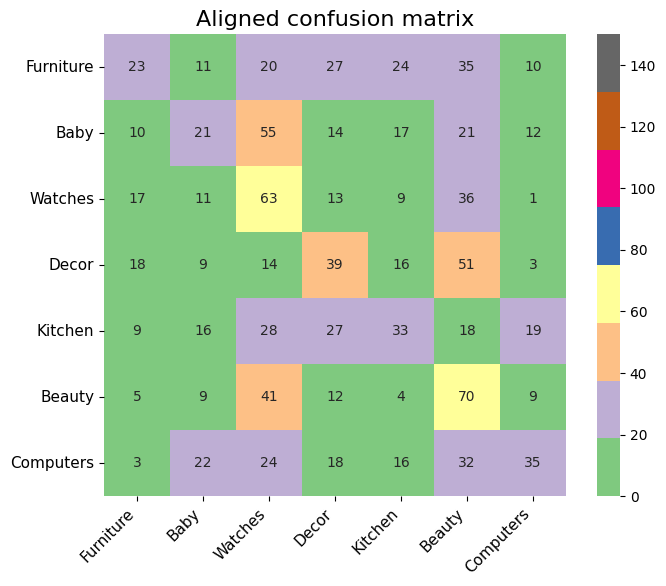

 ARI : 0.03884825416461524
              precision    recall  f1-score   support

   Furniture       0.27      0.15      0.20       150
        Baby       0.00      0.00      0.00       150
     Watches       0.26      0.42      0.32       150
       Decor       0.26      0.26      0.26       150
     Kitchen       0.28      0.22      0.25       150
      Beauty       0.27      0.47      0.34       150
   Computers       0.30      0.38      0.34       150

    accuracy                           0.27      1050
   macro avg       0.23      0.27      0.24      1050
weighted avg       0.23      0.27      0.24      1050

Clustering on BoVW + TFiDF + Spectral 2 components


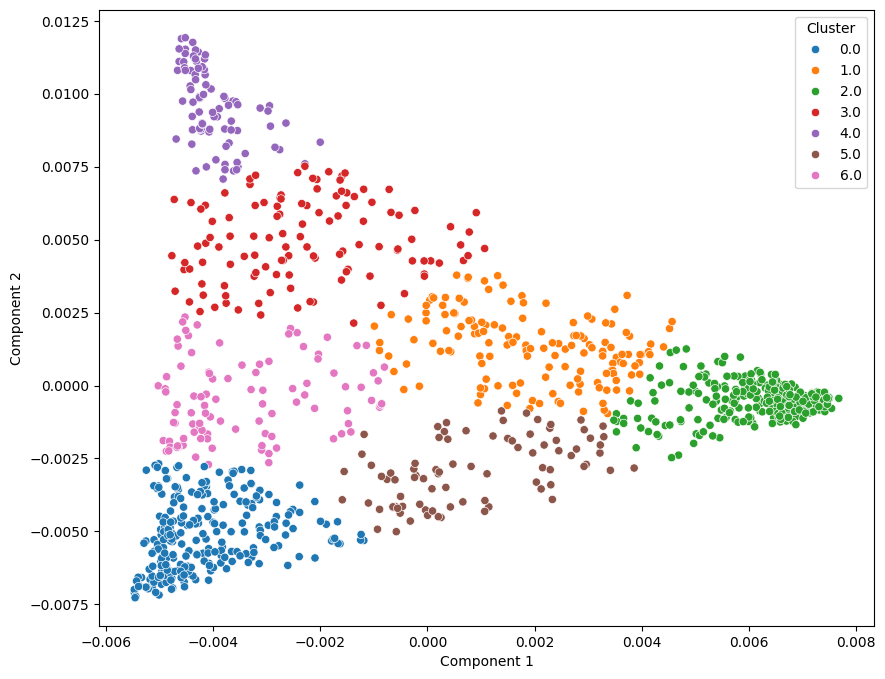

<Figure size 1000x800 with 0 Axes>

In [ ]:
from sklearn.manifold import SpectralEmbedding
tok_spec = SpectralEmbedding(n_components=2,
                             affinity='nearest_neighbors', # rbf
                             gamma=None,
                             random_state=42,
                             eigen_solver=None, # arpack lobpcg amg
                             n_neighbors=50,
                             n_jobs=-1
                            ).fit_transform(tok)

# Import KMeans clusterer
from sklearn.cluster import KMeans


kmeans4 = KMeans(n_clusters=len(dico), random_state=42,n_init=30).fit(tok_spec)
    # Assign clusters
labels=kmeans4.labels_

title='BoVW + TFiDF + Spectral 2 components'
# Evaluate and store metrics results)
append_dict(results1, {'title'   : title,
                     'metrics' : clustering_evaluate(labels, data.cat_code,cat['category'])
                     }
           )
# clustering_evaluate(labels, data.cat_code,cat['index'])
print('Clustering on '+title)

plot_clusters(tok_spec,labels)

##### BoVW + LDA + spectral

,cluster,effectives
Category,,
Furniture,4,176
Baby,0,199
Watches,3,134
Decor,5,135
Kitchen,6,121
Beauty,2,105
Computers,1,180


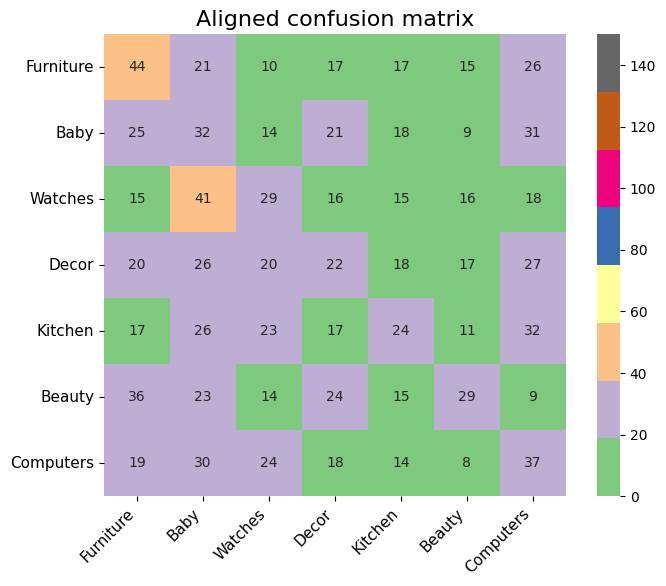

 ARI : 0.010548335419662583
              precision    recall  f1-score   support

   Furniture       0.25      0.29      0.27       150
        Baby       0.00      0.00      0.00       150
     Watches       0.21      0.47      0.29       150
       Decor       0.00      0.00      0.00       150
     Kitchen       0.20      0.16      0.18       150
      Beauty       0.22      0.35      0.27       150
   Computers       0.21      0.25      0.22       150

    accuracy                           0.22      1050
   macro avg       0.15      0.22      0.18      1050
weighted avg       0.15      0.22      0.18      1050

Clustering on BoVW + LDA + Spectral 2 components


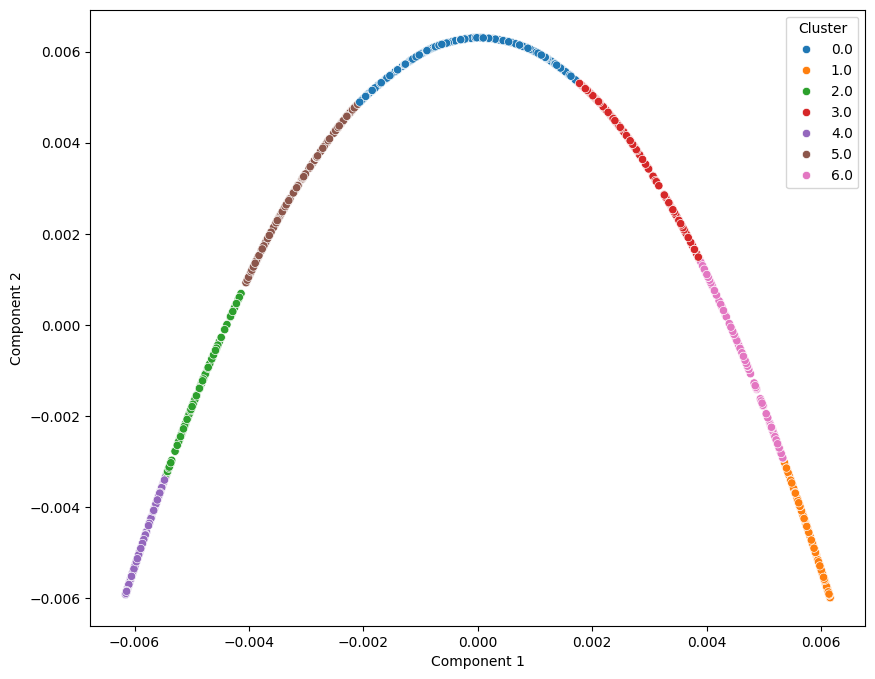

<Figure size 1000x800 with 0 Axes>

In [ ]:
from sklearn.manifold import SpectralEmbedding
tok_spec = SpectralEmbedding(n_components=2,
                             affinity='nearest_neighbors', # rbf
                             gamma=None,
                             random_state=42,
                             eigen_solver=None, # arpack lobpcg amg
                             n_neighbors=50,
                             n_jobs=-1
                            ).fit_transform(tok_lda)

# Import KMeans clusterer
from sklearn.cluster import KMeans


kmeans4 = KMeans(n_clusters=len(dico), random_state=42,n_init=30).fit(tok_spec)
    # Assign clusters
labels=kmeans4.labels_

title='BoVW + LDA + Spectral 2 components'
# Evaluate and store metrics results)
append_dict(results1, {'title'   : title,
                     'metrics' : clustering_evaluate(labels, data.cat_code,cat['category'])
                     }
           )
# clustering_evaluate(labels, data.cat_code,cat['index'])
print('Clustering on '+title)

plot_clusters(tok_spec,labels)

#### UMAP

* **Balanced structure preservation**: Maintains both local similarity relationships and global data patterns
* **Topological foundation**: Constructs representation based on manifold topology and fuzzy simplicial sets
* **Computational efficiency**: Delivers t-SNE-like quality with significantly better performance
* **Meaningful distance preservation**: Maintains more of the important distance relationships than t-SNE
* **Theoretical rigor**: Built on stronger mathematical foundations with clearer optimization objectives
* **Cluster separation clarity**: Produces well-defined clusters while preserving their relative positions

On UMAP projection, TFIDF gives better results than LDA. BoVW only ARI score fell a bit.

##### BoVW + UMAP

/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


,cluster,effectives
Category,,
Furniture,6,139
Baby,5,126
Watches,0,169
Decor,1,142
Kitchen,3,181
Beauty,4,139
Computers,2,154


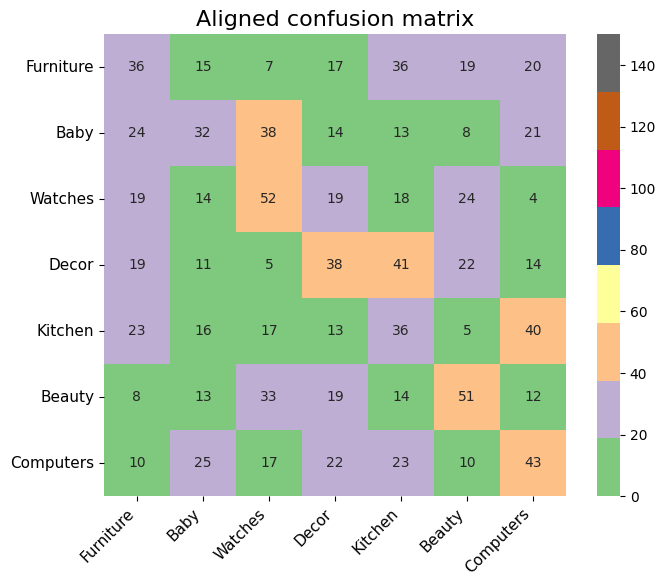

 ARI : 0.04337430309433282
              precision    recall  f1-score   support

   Furniture       0.26      0.24      0.25       150
        Baby       0.25      0.21      0.23       150
     Watches       0.31      0.35      0.33       150
       Decor       0.24      0.53      0.33       150
     Kitchen       0.00      0.00      0.00       150
      Beauty       0.37      0.34      0.35       150
   Computers       0.28      0.29      0.28       150

    accuracy                           0.28      1050
   macro avg       0.24      0.28      0.25      1050
weighted avg       0.24      0.28      0.25      1050

Clustering on BoVW + UMAP 2 components


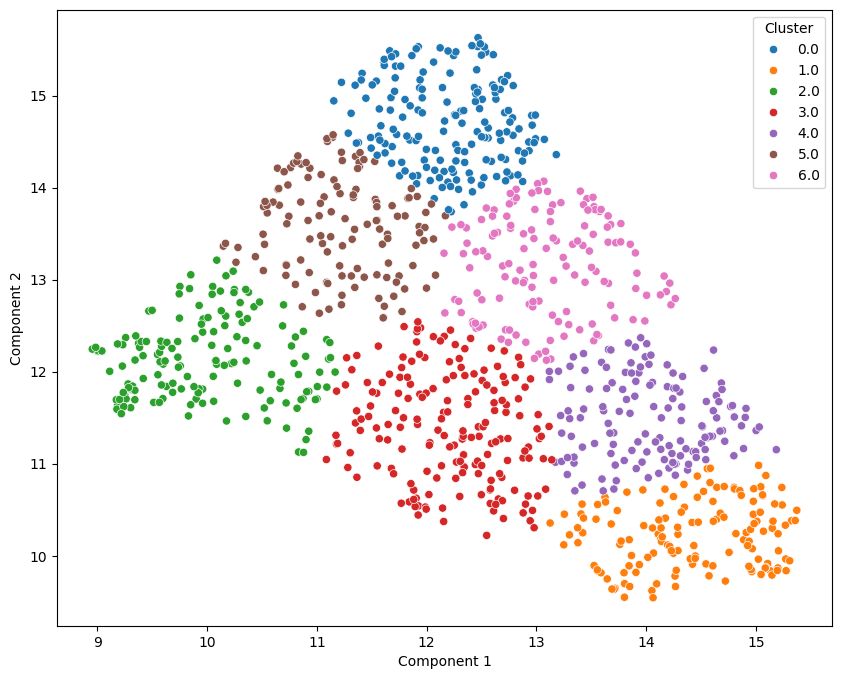

<Figure size 1000x800 with 0 Axes>

In [ ]:
import umap

Umap = umap.UMAP(
                n_neighbors=50,
                min_dist=0.1,
                n_components=2,
                metric='euclidean',
                random_state=42
    )
bovw_umap = Umap.fit_transform(im_features)

kmeans5 = KMeans(n_clusters=len(dico), random_state=42,n_init=30).fit(bovw_umap)
    # Assign clusters
labels=kmeans5.labels_

title='BoVW + UMAP 2 components'
# Evaluate and store metrics results)
append_dict(results1, {'title'   : title,
                     'metrics' : clustering_evaluate(labels, data.cat_code,cat['category'])
                     }
           )
# clustering_evaluate(labels, data.cat_code,cat['index'])
print('Clustering on '+title)

plot_clusters(bovw_umap,labels)

##### BoVW + tfidf + UMAP

/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


,cluster,effectives
Category,,
Furniture,4,105
Baby,1,133
Watches,5,181
Decor,2,167
Kitchen,3,179
Beauty,6,141
Computers,0,144


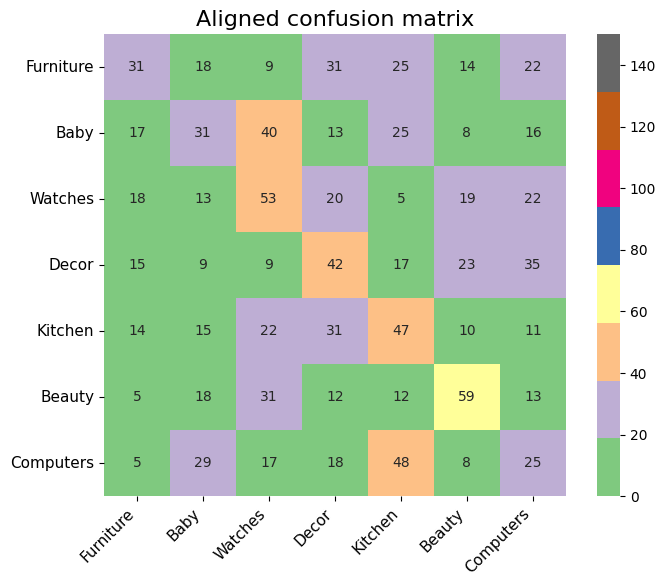

 ARI : 0.04757965429937477
              precision    recall  f1-score   support

   Furniture       0.30      0.21      0.24       150
        Baby       0.23      0.21      0.22       150
     Watches       0.29      0.35      0.32       150
       Decor       0.25      0.51      0.33       150
     Kitchen       0.00      0.00      0.00       150
      Beauty       0.42      0.39      0.41       150
   Computers       0.27      0.32      0.29       150

    accuracy                           0.28      1050
   macro avg       0.25      0.28      0.26      1050
weighted avg       0.25      0.28      0.26      1050

Clustering on BoVW + TFiDF + UMAP 2 components


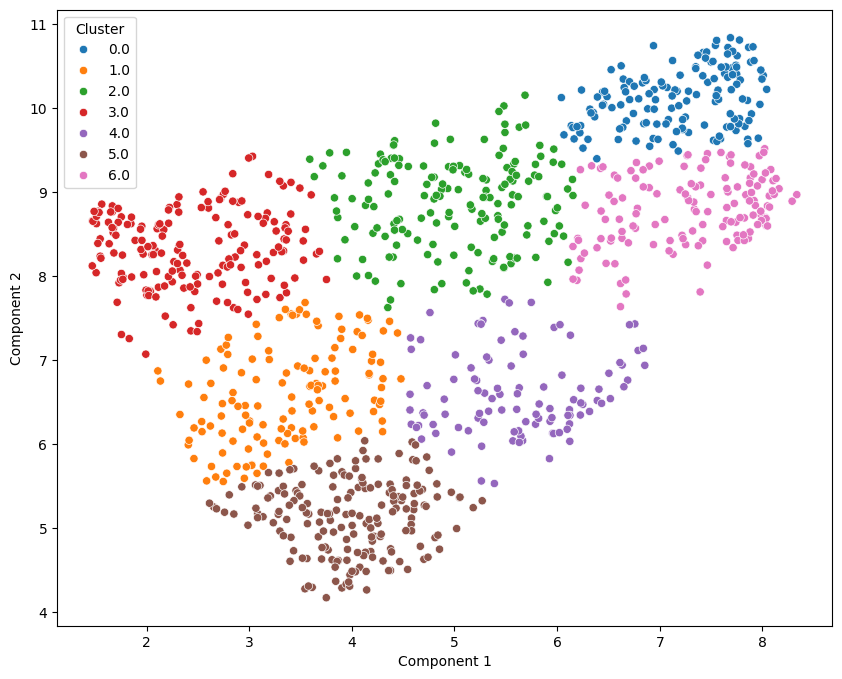

<Figure size 1000x800 with 0 Axes>

In [ ]:
import umap

Umap = umap.UMAP(
                n_neighbors=50,
                min_dist=0.1,
                n_components=2,
                metric='euclidean',
                random_state=42
    )
tok_umap = Umap.fit_transform(tok)

kmeans5 = KMeans(n_clusters=len(dico), random_state=42,n_init=30).fit(tok_umap)
    # Assign clusters
labels=kmeans5.labels_

title='BoVW + TFiDF + UMAP 2 components'
# Evaluate and store metrics results)
append_dict(results1, {'title'   : title,
                     'metrics' : clustering_evaluate(labels, data.cat_code,cat['category'])
                     }
           )
# clustering_evaluate(labels, data.cat_code,cat['index'])
print('Clustering on '+title)

plot_clusters(tok_umap,labels)

##### BoVW + LDA + UMAP

/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


,cluster,effectives
Category,,
Furniture,0,188
Baby,2,240
Watches,1,128
Decor,3,218
Kitchen,4,96
Beauty,6,123
Computers,5,57


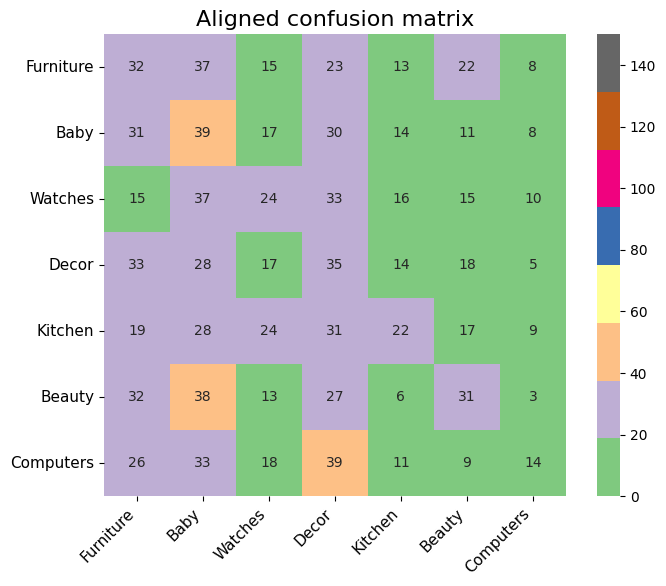

 ARI : 0.0035060343231604588
              precision    recall  f1-score   support

   Furniture       0.00      0.00      0.00       150
        Baby       0.16      0.26      0.20       150
     Watches       0.19      0.16      0.17       150
       Decor       0.18      0.22      0.20       150
     Kitchen       0.23      0.15      0.18       150
      Beauty       0.25      0.21      0.23       150
   Computers       0.19      0.35      0.25       150

    accuracy                           0.19      1050
   macro avg       0.17      0.19      0.17      1050
weighted avg       0.17      0.19      0.17      1050

Clustering on BoVW + LDA + UMAP 2 components


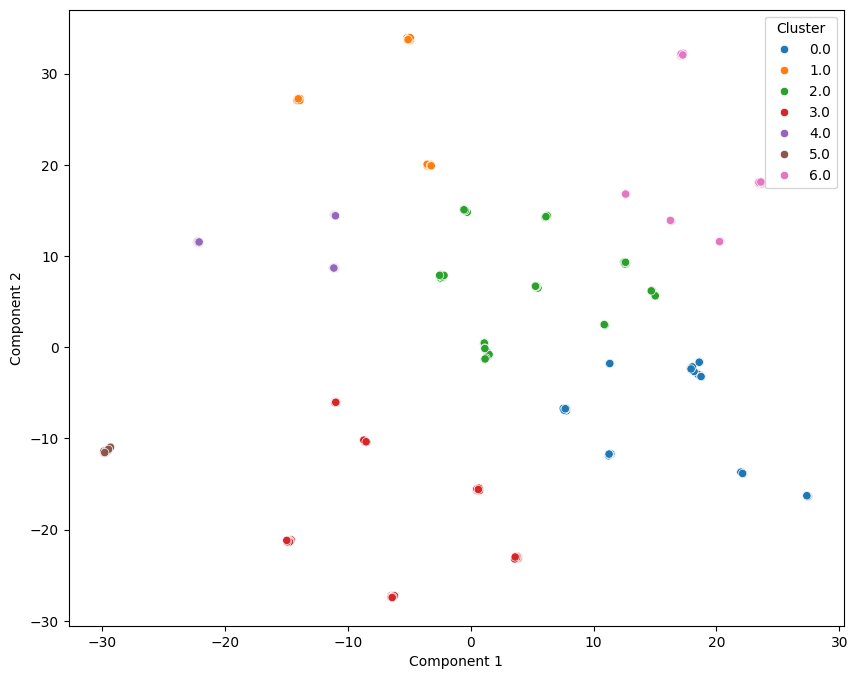

<Figure size 1000x800 with 0 Axes>

In [ ]:
import umap

Umap = umap.UMAP(
                n_neighbors=50,
                min_dist=0.1,
                n_components=2,
                metric='euclidean',
                random_state=42
    )
tok_umap = Umap.fit_transform(tok_lda)

kmeans5 = KMeans(n_clusters=len(dico), random_state=42,n_init=30).fit(tok_umap)
    # Assign clusters
labels=kmeans5.labels_

title='BoVW + LDA + UMAP 2 components'
# Evaluate and store metrics results)
append_dict(results1, {'title'   : title,
                     'metrics' : clustering_evaluate(labels, data.cat_code,cat['category'])
                     }
           )
# clustering_evaluate(labels, data.cat_code,cat['index'])
print('Clustering on '+title)

plot_clusters(tok_umap,labels)

### Visual analysis: T-SNE display by image category
* The "cloudy" and "rain" categories are partially separated.

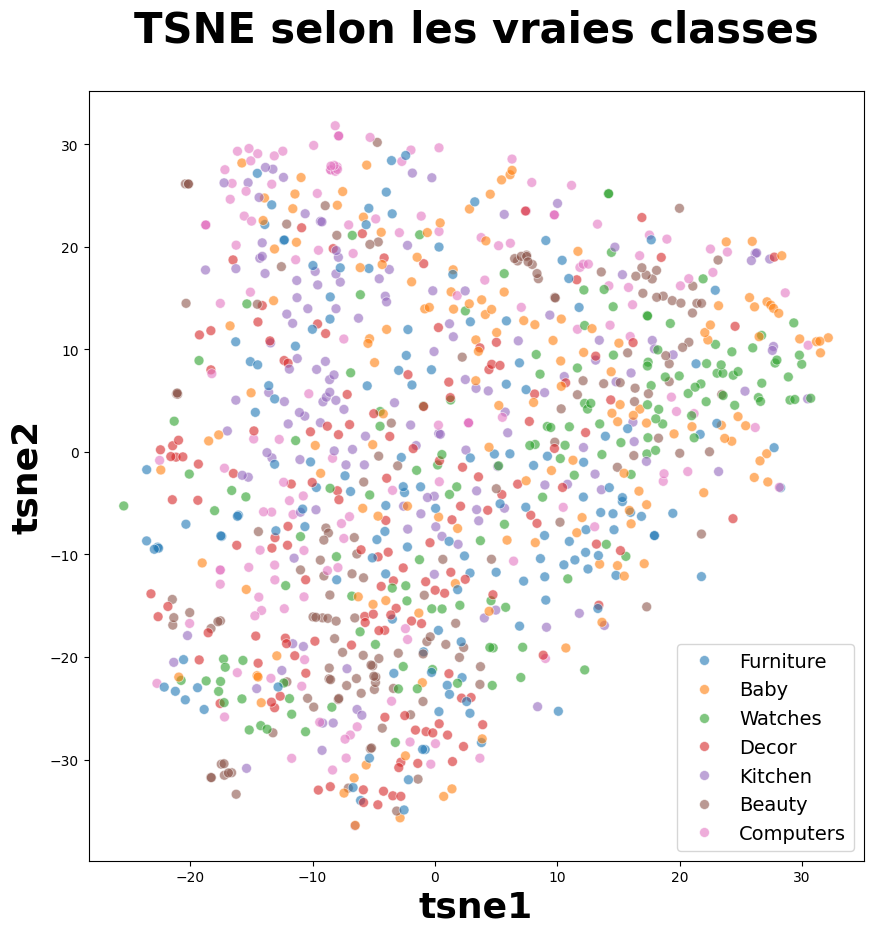

In [ ]:
plt.figure(figsize=(10,10))
sns.scatterplot(
    x="tsne1", y="tsne2", hue="class", data=df_tsne, legend="brief",
    palette=sns.color_palette('tab10', n_colors=7), s=50, alpha=0.6)

plt.title('TSNE selon les vraies classes', fontsize = 30, pad = 35, fontweight = 'bold')
plt.xlabel('tsne1', fontsize = 26, fontweight = 'bold')
plt.ylabel('tsne2', fontsize = 26, fontweight = 'bold')
plt.legend(prop={'size': 14})

plt.show()


### Measure analysis: similarity between categories and clusters

####  Cluster creation from T-SNE

In [ ]:
from sklearn import cluster, metrics

cls = cluster.KMeans(n_clusters=7, random_state=6)
cls.fit(X_tsne)

df_tsne["cluster"] = cls.labels_
print(df_tsne.shape)


(1050, 4)


####  Display of images by clusters and ARI calculation of image category/cluster similarity
* ARI score of 0.03 remains low

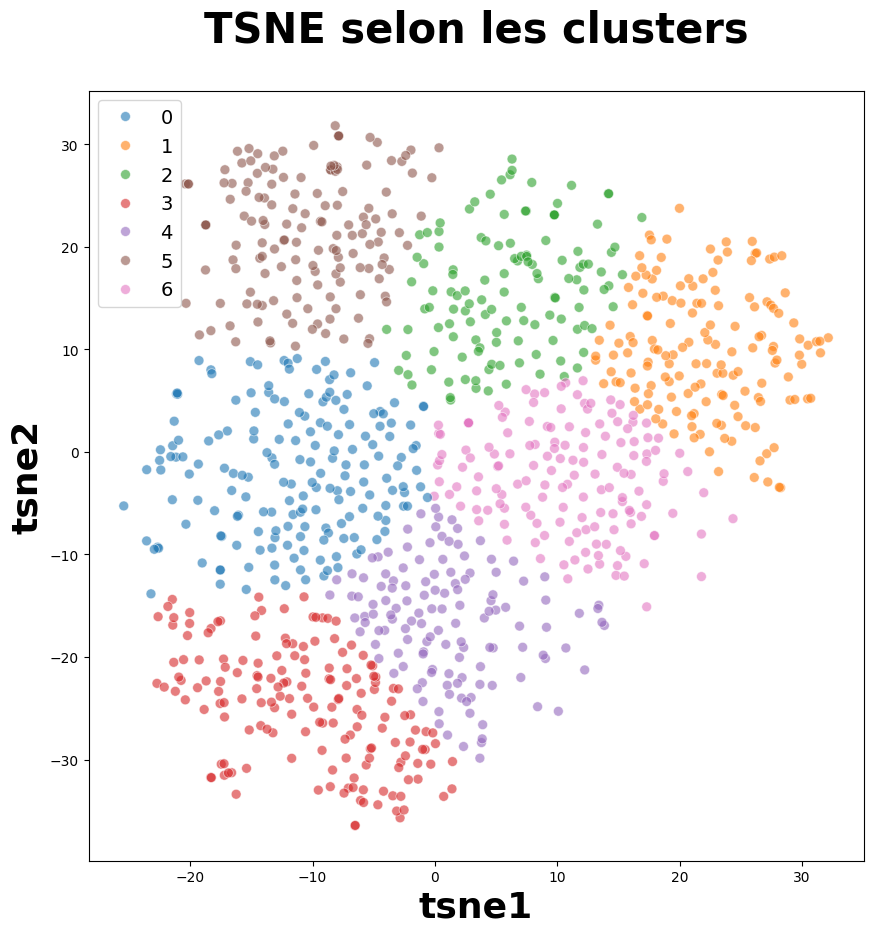

ARI :  0.03429780948315841


In [ ]:
plt.figure(figsize=(10,10))
sns.scatterplot(
    x="tsne1", y="tsne2",
    hue="cluster",
    palette=sns.color_palette('tab10', n_colors=7), s=50, alpha=0.6,
    data=df_tsne,
    legend="brief")

plt.title('TSNE selon les clusters', fontsize = 30, pad = 35, fontweight = 'bold')
plt.xlabel('tsne1', fontsize = 26, fontweight = 'bold')
plt.ylabel('tsne2', fontsize = 26, fontweight = 'bold')
plt.legend(prop={'size': 14})

plt.show()

labels = data.cat_code
print("ARI : ", metrics.adjusted_rand_score(labels, cls.labels_))

#### Class analysis
* The confusion matrix must be transformed to give the same order of assumed categories in the columns as in the rows.
* This transformation reaches its limits for the 2 categories "shine" and "sunshine", which are not very well separated (so it was done manually instead of using the "argmax" function).

,cluster,effectives
Category,,
Furniture,6,151
Baby,2,124
Watches,1,154
Decor,4,131
Kitchen,0,180
Beauty,3,165
Computers,5,145


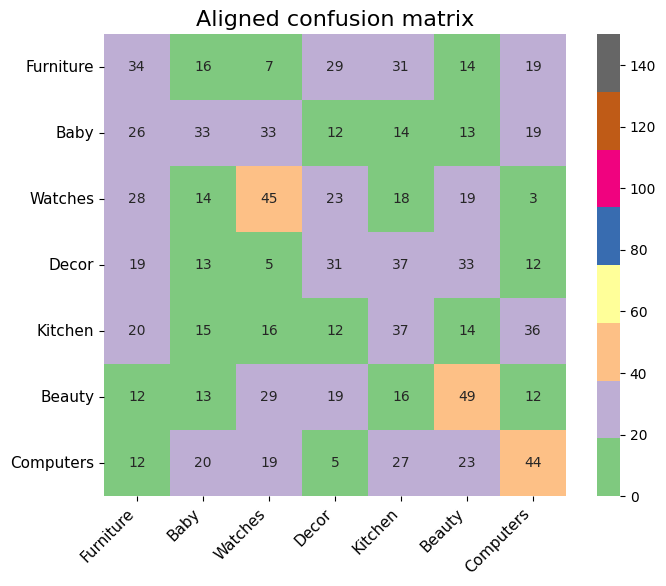

 ARI : 0.03429780948315841
              precision    recall  f1-score   support

   Furniture       0.23      0.23      0.23       150
        Baby       0.27      0.22      0.24       150
     Watches       0.29      0.30      0.30       150
       Decor       0.22      0.45      0.30       150
     Kitchen       0.00      0.00      0.00       150
      Beauty       0.30      0.33      0.31       150
   Computers       0.30      0.29      0.30       150

    accuracy                           0.26      1050
   macro avg       0.23      0.26      0.24      1050
weighted avg       0.23      0.26      0.24      1050

Clustering sur BoVW ORB descriptors


In [ ]:
title='BoVW ORB descriptors'
# Evaluate and store metrics results)
append_dict(results, {'title'   : title,
                     'metrics' : clustering_evaluate(cls.labels_, data.cat_code,cat['category'])
                     }
           )
# clustering_evaluate(labels, data.cat_code,cat['index'])
print('Clustering sur '+title)

## Visualisation of images in each cluster

In [ ]:
def view_cluster(pred_labels):
    # Dict to hold the cluster id and the images { id: [images] }
    groups_per = {}
    print('Create groups of images per cluster...')
    # Filling groups
    for file, cluster in zip(data.image,pred_labels):
        if cluster not in groups_per.keys():
            groups_per[cluster] = []
            groups_per[cluster].append(file)
        else:
            groups_per[cluster].append(file)
    print('done.')

    # loops on clusters for content sample
    for cluster in tnrange(7,desc='Printing images by cluster'):
        plt.figure(figsize = (25,25));
        # gets the list of filenames for a cluster
        files = groups_per[cluster]
        # only allow up to 30 images to be shown at a time
        if len(files) > 30:
            print(f"Clipping cluster {cluster} size from {len(files)} to 30")
            files = files[:29]
        else:
            print(f"Cluster {cluster} size {len(files)}")
        # plot each image in the cluster
        for index, file in enumerate(files):
            plt.subplot(10,10,index+1);
            img = cv2.imread(path+file)

            img = np.array(img)
            plt.imshow(img,cmap='gray')
            plt.axis('off')
        plt.show()



In [ ]:
# Show a sample of 30 image in each cluster for visual verification
print('In cluster image with BoVW ORB descriptors')
view_cluster(cls.labels_)

Output hidden; open in https://colab.research.google.com to view.

# Results

In [ ]:
# Create data frame from resluts dictionaryy


def highlight_max(s):
    '''
    highlight the maximum in a Series green.
    '''
    is_max = s == s.max()
    return ['background-color: green' if v else '' for v in is_max]
def highlight_min(s):
    '''
    highlight the minmum in a Series red.
    '''
    is_max = s == s.min()
    return ['background-color: lightcoral' if v else '' for v in is_max]


# unpack tuples and create result data frame
def dict_to_df(dic):
    # dict to data frame
    results_all=pd.DataFrame(dic)
    # unpack metrics tuple
    results_all['precision']=[tup[0][0] for tup in results_all.metrics]
    results_all['recall']=[tup[0][1] for tup in results_all.metrics]
    results_all['f1_score']=[tup[0][2] for tup in results_all.metrics]
    results_all['ARI']=[tup[1] for tup in results_all.metrics]
    # drop tuples
    results_all.drop(['metrics'],axis=1,inplace=True)
    # set title as index
    results_all.set_index('title',inplace=True)
#     # columns to highligth
#     subset=['precision','recall','f1_score','ARI']
    # return dataframe
    return results_all.style.apply(highlight_max).apply(highlight_min).format('{:.2%}')

In [ ]:
results_images_sift = dict_to_df(results)
results_images_sift

,precision,recall,f1_score,ARI
title,,,,
BoVW,32.26%,25.90%,16.17%,4.33%
BoVW + TFiDF,21.91%,29.90%,25.07%,6.15%
BoVW + LatentDirichletAllocation,24.59%,26.57%,20.27%,3.55%
"BoVW + PCA (2 components, 11.95% explained variance)",11.78%,23.33%,11.97%,4.39%
"BoVW + TFiDF + PCA (2 components, 8.01% explained variance)",19.94%,27.62%,22.38%,4.71%
"BoVW + LDA + PCA (2 components, 100.00% explained variance)",24.59%,26.57%,20.28%,3.53%
BoVW + T-SNE 2 components,31.75%,31.81%,31.35%,6.68%
BoVW + TFiDF + T-SNE 2 components,23.10%,27.24%,24.16%,5.19%
BoVW + LDA + T-SNE 2 components,15.71%,26.19%,18.71%,4.04%


In [ ]:
results_images_orb = dict_to_df(results1)
results_images_orb

,precision,recall,f1_score,ARI
title,,,,
BoVW,20.05%,25.62%,21.09%,3.31%
BoVW + TFiDF,31.61%,30.48%,30.53%,5.37%
BoVW + LatentDirichletAllocation,17.23%,21.90%,17.77%,1.05%
"BoVW + PCA (2 components, 17.76% explained variance)",18.67%,26.19%,21.59%,3.99%
"BoVW + TFiDF + PCA (2 components, 15.35% explained variance)",20.24%,28.10%,22.76%,4.84%
"BoVW + LDA + PCA (2 components, 100.00% explained variance)",17.23%,21.90%,17.77%,1.05%
BoVW + T-SNE 2 components,24.60%,28.00%,25.65%,4.59%
BoVW + TFiDF + T-SNE 2 components,20.74%,27.33%,22.51%,4.45%
BoVW + LDA + T-SNE 2 components,15.96%,22.00%,17.92%,1.09%


In [ ]:
print(' Executé en : ', datetime.timedelta(seconds=(time.time() - start_time)))

 Executé en :  0:10:11.214628
